# **Project II: Unsupervised Learning**

Author: Sofía Vega


## **A. Recommendation System**

In this project, we will develop a movie recommendation system using the MovieLens 100K dataset (1998), which contains 100,000 ratings from 943 users on 1,682 movies. In addition to the user-item rating matrix, the dataset provides metadata such as movie genres, and user demographics including age, gender, and occupation:

1. **u_data_ratings.xls**: Ratings given by users to specific movies.
2. **u_movies_genre.xls**: Enumeration of the 20 different movie genres included in the dataset.
3. **u_movies_items.xls**: Contains additional information about each movie.
4. **u_user_info.xls**: Contains user-related information.
5. **u_occupation.xls**: Contains users' occupations.

Recommendation systems are widely used in online platforms to personalize content and enhance user experience. By learning from past user interactions and item characteristics, these systems can predict what users might enjoy next, reducing information overload and improving engagement.

### **Types of Recommendation Systems**

Recommendation systems can be broadly categorized into three main types, each with its own strategy for generating personalized suggestions:

1. **Content-Based Filtering**  
   This approach relies on the attributes of items and user profiles. The system recommends items that are similar to those the user has liked in the past, based on characteristics such as genre, actors, or director in the case of movies. It treats recommendation as a classification problem, learning a model for each user.

2. **Collaborative Filtering**  
   Collaborative filtering leverages the interactions between users and items. It assumes that users who agreed in the past will likely agree again in the future. This method can be user-based (recommending items liked by similar users) or item-based (recommending items similar to those the user has rated positively).

3. **Hybrid Methods**  
   These systems combine both content-based and collaborative approaches to leverage the strengths of each. For example, a hybrid system might use content-based filtering to handle new items (cold start problem) and collaborative filtering for users with rich histories.

### **1. Data Loading and Preprocessing**

We will begin by properly handling the dataset and storing it in a structured format for further use. Specifically, we will load the user ratings, movie-related data such as genres and item details, as well as user information including demographic attributes and occupations.

In [49]:
# ================================
#  0. Import Necessary Libraries
# ================================

# Data manipulation and display
import pandas as pd
import numpy as np
from pprint import pprint

# Visualization
import matplotlib.pyplot as plt
import seaborn as sns

# Machine learning
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA, TruncatedSVD
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import make_pipeline
from sklearn.neighbors import NearestNeighbors
from sklearn.metrics import silhouette_score, mean_squared_error
from sklearn.metrics.pairwise import cosine_similarity

# Sparse matrix
from scipy.sparse import csr_matrix

# Jupyter UI (optional)
from IPython.display import display, clear_output, Markdown, HTML
import ipywidgets as widgets

# Utilities
import re
import math

#### **1.1 Load User Ratings**

The first file we load is `u_data_ratings.xls`, which contains four columns: the user ID, the movie ID, the rating assigned, and a timestamp. The timestamp is originally in Unix time (seconds since epoch), so we convert it into a readable datetime format. The resulting data is stored in a DataFrame named `ratings`.

In [50]:
# =======================
#  1. Load User Ratings
# =======================

# Load user-movie ratings from Excel
ratings = pd.read_excel("u_data_ratings.xls")

# Convert timestamps to datetime format
ratings["Timestamp"] = pd.to_datetime(ratings["Timestamp"], unit='s')

# Preview ratings
print(" Ratings preview:")
print(ratings.head())
print(f"\n Total valid ratings loaded: {len(ratings)}")

 Ratings preview:
   User ID  Item ID  Rating           Timestamp
0      196      242       3 1997-12-04 15:55:49
1      186      302       3 1998-04-04 19:22:22
2       22      377       1 1997-11-07 07:18:36
3      244       51       2 1997-11-27 05:02:03
4      166      346       1 1998-02-02 05:33:16

 Total valid ratings loaded: 65535


A significant discrepancy is observed between the number of valid ratings loaded (65,535) and the expected total of approximately 100,000. This difference suggests the absence of a substantial portion of records in the dataset, potentially caused by technical limitations related to the file format used.

Specifically, the provided files are in .xls format, which supports a maximum of 65,536 rows per worksheet. In contrast, the more modern .xlsx format accommodates up to 1,048,576 rows. Therefore, it is reasonable to assume that data truncation may have occurred during the export or saving process due to the restricted capacity of the selected format.

For this reason, the methods implemented to mitigate the impact of this limitation on the recommendation system are detailed throughout the notebook.

#### **1.2. Load Movie Metadata and Genres**

In this step, we load the file `u_movies_items.csv`, which contains metadata for each movie. Although the original file was provided in `.xlsx` format, its internal structure used pipe (`|`) separators rather than standard spreadsheet formatting. Therefore, we treat it as a CSV file and load it using `pd.read_csv()` with `sep="|"`.

The dataset includes 24 columns: the movie ID, title, release dates, IMDb URL, and binary indicators for 19 different genres (e.g., Comedy, Action, Romance). Each genre is represented by a value of **1** if the movie belongs to that genre, or **0** otherwise.

We manually assign column names. Then, the data is stored in a DataFrame called `movies`, and we ensure all genre columns are correctly interpreted as integers. To simplify analysis, we create a new column named `genre_list` that holds a list of genres associated with each movie—constructed by checking which genre indicators have a value of 1.

Lastly, we display a preview of this enriched DataFrame and report the number of valid movies successfully loaded.

In [51]:
# ================================
#  2. Load Movie Metadata & Genres
# ================================

# Define column names for movie metadata (24 total: id, title, date, genres...)
movie_columns = [
    "Item ID", "title", "release_date", "video_release_date", "IMDb_URL",
    "unknown", "Action", "Adventure", "Animation", "Children's", "Comedy",
    "Crime", "Documentary", "Drama", "Fantasy", "Film-Noir", "Horror",
    "Musical", "Mystery", "Romance", "Sci-Fi", "Thriller", "War", "Western"
]

# Load movie metadata from pipe-separated CSV 
movies = pd.read_csv("u_movies_items.csv", sep="|", header=None, names=movie_columns, encoding="latin-1", engine="python", on_bad_lines="skip")

# Convert genre columns to integer (0 or 1)
genre_columns = movie_columns[5:]
for col in genre_columns:
    movies[col] = pd.to_numeric(movies[col], errors="coerce").fillna(0).astype(int)

# Create a genre list per movie
movies["genre_list"] = movies[genre_columns].apply(
    lambda row: [genre for genre, val in row.items() if val == 1], axis=1
)

# Preview movies
print("\n Movies preview with genres:")
print(movies[["Item ID", "title", "genre_list"]].head())
print(f"\nTotal valid movies loaded: {len(movies)}")


 Movies preview with genres:
   Item ID              title                       genre_list
0        1   Toy Story (1995)  [Animation, Children's, Comedy]
1        2   GoldenEye (1995)    [Action, Adventure, Thriller]
2        3  Four Rooms (1995)                       [Thriller]
3        4  Get Shorty (1995)          [Action, Comedy, Drama]
4        5     Copycat (1995)         [Crime, Drama, Thriller]

Total valid movies loaded: 1682


Unlike the discrepancy observed in the ratings count, the total number of movies loaded aligns with the expected value. Nevertheless, it is appropriate to conduct an additional verification to identify potential duplicates namely, instances where multiple entries share the same movie title and content but are assigned different identifiers.

Upon review, we find that there are only 1,664 unique movie titles, despite a total of 1,682 movie records being loaded. This discrepancy suggests that certain films may have been stored as separate entries, possibly due to differences in release dates or minor variations in metadata, even though they essentially represent the same cinematic work.

In addition, the output clearly indicates that a single movie can belong to multiple genres, as evidenced by the genre_list field containing several genre labels for a given title. This highlights a multiclass structure in the dataset, which enriches the potential for analysis but also introduces complexity in user segmentation and preference modeling.

In [52]:
movie_dataset = movies[['Item ID','title']]
len(movies.groupby(by=movie_columns[1:])),len(movies)

(1664, 1682)

We observe that there are only 1,664 unique movie titles, yet 1,682 movies are loaded. This suggests that some movies may be stored as separate entries, possibly due to differences in release dates, despite being essentially the same film.

#### **1.3. Load Genre Mapping**

In this step, we load the file `u_movies_genre.csv`, which provides a mapping between genre names and their corresponding index positions. Although this file was also originally given as `.xls`, its content is structured using pipe (`|`) separators, so we load it as a CSV using `pd.read_csv()` with `sep="|"`.

The file consists of two columns: the **genre name** and its **index**, which indicates the position of the genre in the binary genre columns of the movie metadata file (`u_movies_items.csv`). Since there is no header in the file, we manually assign the column names `"genre"` and `"index"`.

The data is stored in a DataFrame named `genre_map`, which will later be useful for building a genre-specific analysis. A preview of the mapping confirms that each genre is properly indexed.

In [53]:
# =========================
#  3. Load Genre Mapping
# =========================

# Load mapping of genre names to their index positions
genre_map = pd.read_csv("u_movies_genre.csv", sep="|", header=None, names=["genre", "index"])

# Preview genre mapping
print("\n Genre map:")
print(genre_map)


 Genre map:
          genre  index
0       unknown      0
1        Action      1
2     Adventure      2
3     Animation      3
4    Children's      4
5        Comedy      5
6         Crime      6
7   Documentary      7
8         Drama      8
9       Fantasy      9
10    Film-Noir     10
11       Horror     11
12      Musical     12
13      Mystery     13
14      Romance     14
15       Sci-Fi     15
16     Thriller     16
17          War     17
18      Western     18


The structure loaded from the genre mapping file confirms that each genre category has been correctly associated with a numerical index. This index corresponds to the position that each genre occupies within the binary encoding used in the movie metadata file (u_movies_items.csv). This systematic assignment will be essential for building the recommendation system, as it will enable the identification and filtering of user preferences based on the genres associated with each film.

#### **1.4. Load Occupation List**

In this step, we load the file `u_occupation.xls`, which contains a list of user occupations. The file includes only one column without a header, so we assign the column name `"occupation"` manually during import.

We use `pd.read_excel()` to load the data directly into a DataFrame named `occupations`. A quick preview confirms that the data was loaded correctly.

In [54]:
# ========================
#  4. Load Occupation List
# ========================

# Load list of occupations from Excel
occupations = pd.read_excel("u_occupation.xls", header=None, names=["occupation"])

# Preview occupations
print("\n Occupations:")
print(occupations.head())


 Occupations:
      occupation
0  administrator
1         artist
2         doctor
3       educator
4       engineer


The file u_occupation.xls, which contains the list of user occupations, was successfully loaded.

### **1.5. Load User Info**

In this step, we load the file `u_user_info.csv`, which contains demographic information about each user. Although originally provided in spreadsheet format, the file uses pipe (`|`) separators, so we load it as a CSV using `pd.read_csv()` with `sep="|"`.

The dataset includes five columns: the user ID, age, gender, occupation, and zip code. Since the file has no header row, we manually assign column names using the list `["user_id", "age", "gender", "occupation", "zip_code"]`.

The data is stored in a DataFrame called `users`, where each row corresponds to a unique user. This information will later help us explore how demographic variables influence movie preferences and clustering behavior.

We also display a preview of the first few rows and confirm the total number of users successfully loaded.

In [55]:
# =====================
#  5. Load User Info
# =====================

# Define column names for user info
user_columns = ["User ID", "age", "gender", "occupation", "zip_code"]

# Load user profile data from pipe-separated CSV
users = pd.read_csv("u_user_info.csv", sep="|", header=None, names=user_columns)

# Preview users
print("\n User info preview:")
print(users.head())
print(f"\n Total users loaded: {len(users)}")


 User info preview:
   User ID  age gender  occupation zip_code
0        1   24      M  technician    85711
1        2   53      F       other    94043
2        3   23      M      writer    32067
3        4   24      M  technician    43537
4        5   33      F       other    15213

 Total users loaded: 943


The output shows that the data of 943 users have been successfully loaded, which matches the expected number of users, confirming that the file was imported correctly. The provided information includes user ID, age, gender, occupation, and zip code, which are essential for analyzing how the demographic characteristics of users may influence their movie preferences. These data will allow for the segmentation of users into groups with similar characteristics, facilitating the personalization of recommendations and the identification of patterns in users' preferences

#### **1.6. Dataset Summary Table**

To get an overview of the data we have loaded, we construct a summary table that lists the main datasets used in the project along with their respective number of rows and columns. This helps ensure that all files were imported correctly and gives a sense of the dataset sizes we are working with.

We create a DataFrame called `summary`, where each row corresponds to one of the following datasets:  
- `Ratings`: User-movie interactions  
- `Movies`: Metadata and genre indicators for each movie  
- `Users`: Demographic information  
- `Occupations`: List of distinct user professions  
- `Genre Map`: Mapping of genre names to index positions

For each dataset, we report the total number of rows (records) and columns (features). This table serves as a quick reference point before diving into preprocessing and analysis.


In [56]:
# ==========================
#  6. Dataset Summary Table
# ==========================

summary = pd.DataFrame({
    "Dataset": ["Ratings", "Movies", "Users", "Occupations", "Genre Map"],
    "Rows": [
        len(ratings),
        len(movies),
        len(users),
        len(occupations),
        len(genre_map)
    ],
    "Columns": [
        ratings.shape[1],
        movies.shape[1],
        users.shape[1],
        occupations.shape[1],
        genre_map.shape[1]
    ]
})

print("\n Dataset Summary:")
print(summary)


 Dataset Summary:
       Dataset   Rows  Columns
0      Ratings  65535        4
1       Movies   1682       25
2        Users    943        5
3  Occupations     21        1
4    Genre Map     19        2


A summary of the analysis of the loaded dataset reveals several discrepancies and similarities with the expected values. The user ratings are incomplete, with only 65,535 records loaded instead of the anticipated 100,000, which is attributed to the limitations of the .xls format. Regarding the movies, although 1,682 records were loaded, only 1,664 unique titles are present, indicating the presence of duplicates caused by minor variations in the metadata. The user data aligns with expectations, with a total of 943 records, which will be used for segmentation within the recommendation system. The occupation and genre files were correctly loaded, without discrepancies, and will be used for personalizing the recommendations. It is important to highlight that missing records or duplicates in the movie titles will be filtered out to ensure the quality of the recommendation system.

## **2. Exploratory Data Analysis**

In this section, we will visualize the data in various ways to better understand its distribution, identify potential relationships, and explore user preferences or behavioral patterns. This exploratory analysis is essential, as it provides context and insight that will help us interpret the results of clustering later on and assess whether those groupings are meaningful.

### **2.0 Merging Datasets for Analysis**

In this step, we prepare a unified dataset by merging the user ratings with the corresponding movie metadata and user demographic information.

1. **Merge Ratings with Movie Metadata**  
   We begin by merging the `ratings` dataset with `movie_dataset` (which contains information such as movie titles and genres) using the `Item ID` as the common key. This allows us to associate each rating with its corresponding movie.

2. **Average Ratings per User–Movie Pair**  
   In case a user rated the same movie more than once, we compute the average rating per `(User ID, Movie Title)` pair. This ensures that each user–movie combination appears only once in the dataset.

3. **Merge with User Demographics**  
   The resulting dataset is then merged with the `users` dataframe to include user-related features such as age, gender, and occupation. This enriches the data for demographic-aware recommendation strategies.

4. **Clean Unused Columns**  
   We drop the `video_release_date` column, which is mostly empty (`NaN`) and not relevant for analysis.

5. **Create Age Groups**  
   To facilitate demographic segmentation, we categorize users into age bins (e.g., `<20`, `20–29`, etc.) using the `pd.cut` function.

The resulting dataframe, `ratings_all`, contains user ratings, movie metadata, and user demographics in a single structure.

In [57]:
# ==========================================================
# 1. Merge ratings with movie metadata 
# ==========================================================
ratings_movies_users = pd.merge(ratings, movie_dataset, how='inner', on='Item ID')

# ==========================================================
# 2. Average multiple ratings per (User, Movie) pair
# Ensures one rating per user–movie combination
# ==========================================================
ratings_average = (
    ratings_movies_users
    .groupby(['User ID', 'title'], as_index=False)
    .agg({"Rating": "mean"})
)

print("Shape of averaged rating matrix:", ratings_average.shape)
ratings_average.head()

# ==========================================================
# 3. Merge user demographic data into the averaged ratings
# (age, gender, occupation, etc.)
# ==========================================================
ratings_all = (
    ratings_average
    .merge(users, on="User ID", how="left")
    .merge(movies, on="title", how="left")
)

# ==========================================================
# 4. Drop unused or empty columns 
# ==========================================================
if 'video_release_date' in ratings_all.columns:
    ratings_all.drop(columns=['video_release_date'], inplace=True)

# ==========================================================
# 5. Bin user ages into categorical age groups for analysis
# ==========================================================
age_bins = [0, 19, 29, 39, 49, 59, 69, 100]
age_labels = ["<20", "20-29", "30-39", "40-49", "50-59", "60-69", "70+"]
ratings_all["age_group"] = pd.cut(ratings_all["age"], bins=age_bins, labels=age_labels, right=False)
users["age_group"] = pd.cut(users["age"], bins=age_bins, labels=age_labels, right=False)

# ==========================================================
# 6. Preview the enriched dataset and print coverage
# ==========================================================
print("Number of unique users:", ratings_average["User ID"].nunique())
print("Number of unique movie titles:", ratings_average["title"].nunique())

ratings_complete = ratings_all
ratings_copy= ratings_all
ratings_all.head()

Shape of averaged rating matrix: (65374, 3)
Number of unique users: 916
Number of unique movie titles: 1611


,User ID,title,Rating,age,gender,occupation,zip_code,Item ID,release_date,IMDb_URL,...,Horror,Musical,Mystery,Romance,Sci-Fi,Thriller,War,Western,genre_list,age_group
0,1,101 Dalmatians (1996),2.0,24,M,technician,85711,225,27-Nov-1996,http://us.imdb.com/M/title-exact?101%20Dalmati...,...,0,0,0,0,0,0,0,0,"[Children's, Comedy]",20-29
1,1,12 Angry Men (1957),5.0,24,M,technician,85711,178,01-Jan-1957,http://us.imdb.com/M/title-exact?12%20Angry%20...,...,0,0,0,0,0,0,0,0,[Drama],20-29
2,1,"20,000 Leagues Under the Sea (1954)",3.0,24,M,technician,85711,141,01-Jan-1954,"http://us.imdb.com/M/title-exact?20,000%20Leag...",...,0,0,0,0,1,0,0,0,"[Adventure, Children's, Fantasy, Sci-Fi]",20-29
3,1,2001: A Space Odyssey (1968),4.0,24,M,technician,85711,135,01-Jan-1968,http://us.imdb.com/M/title-exact?2001:%20A%20S...,...,0,0,1,0,1,1,0,0,"[Drama, Mystery, Sci-Fi, Thriller]",20-29
4,1,"Abyss, The (1989)",3.0,24,M,technician,85711,164,01-Jan-1989,"http://us.imdb.com/M/title-exact?Abyss,%20The%...",...,0,0,0,0,1,1,0,0,"[Action, Adventure, Sci-Fi, Thriller]",20-29


After the filtering process, it was found that the number of unique users is 916, and the number of unique movie titles is 1,611, following the exclusion of users who did not provide any ratings and movies that received no ratings.

We configure the default aesthetics for our plots using Seaborn:

- `sns.set(style="whitegrid")` sets a clean white grid background for better readability.
- `palette = "crest"` sets the default color palette for plots to a cool-toned gradient.

In [58]:
sns.set(style="whitegrid")      
palette="crest"

### **2.1 Rating Distribution**

To begin our exploratory data analysis, we examine how ratings are distributed across the dataset. Using a count plot, we visualize the number of occurrences of each rating value (from 1 to 5).

This helps us understand the general tendencies of user ratings; whether users tend to rate movies positively, negatively, or neutrally. The `countplot` from Seaborn displays the frequency of each rating, revealing any skewness in the data.

In addition, we analyze **how many movies users typically rate**. This is shown using a histogram of the number of ratings per user, grouped in intervals (e.g., 20–70, 70–120, etc.). This view helps us detect **rating activity patterns**, identifying whether most users are highly active or only rate a few items. Count labels on each bar make the frequency easy to interpret.

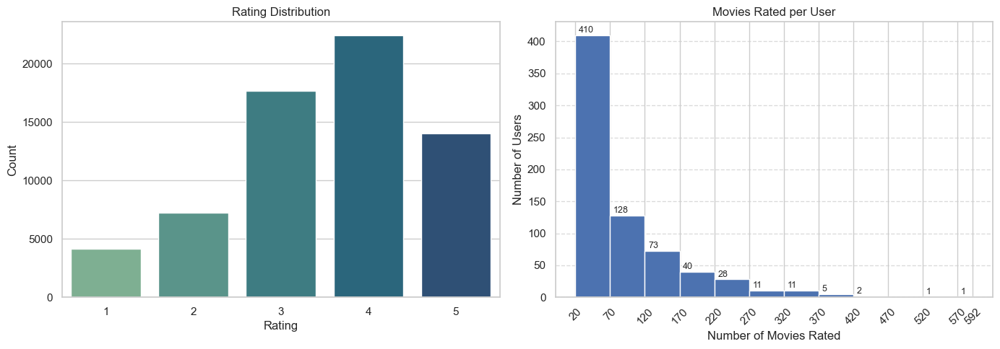

In [59]:
# Count how many ratings each user gave
user_rating_counts = ratings_all.groupby("User ID").size()

# Define custom bins 
bins = list(range(20, 600, 50))
bins.append(user_rating_counts.max() + 1)

# Create a figure with two subplots side by side
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

# ==========================
# 1. Rating Distribution
# ==========================
sns.countplot(ax=axes[0], x="Rating", data=ratings, palette=palette)
axes[0].set_title("Rating Distribution")
axes[0].set_xlabel("Rating")
axes[0].set_ylabel("Count")

# ================================
# 2. Number of Movies Rated/User
# ================================
counts, bin_edges, patches = axes[1].hist(user_rating_counts, bins=bins)

# Add count labels
for count, edge in zip(counts, bin_edges[:-1]):
    if count > 0:
        axes[1].text(edge + 5, count + 1, str(int(count)), fontsize=9, ha='left', va='bottom')

axes[1].set_title("Movies Rated per User")
axes[1].set_xlabel("Number of Movies Rated")
axes[1].set_ylabel("Number of Users")
axes[1].set_xticks(bins)
axes[1].tick_params(axis='x', rotation=45)
axes[1].grid(axis='y', linestyle='--', alpha=0.7)

plt.tight_layout()
plt.show()

The first graph, titled "Rating Distribution", illustrates the distribution of ratings assigned by users, with values ranging from 1 to 5. It is evident that the most frequent rating is 4, followed by 3 and 5, suggesting a general trend towards positive ratings. In contrast, lower ratings, such as 1 and 2, are considerably less common, which implies that users tend to rate mainly the movies they enjoyed or prefer to avoid making excessively negative judgments. This right-skewed distribution has significant implications: on the one hand, it may lead to an overestimation of the general perception of movie quality, and on the other, it could affect the performance of recommendation models by artificially inflating the averages.

In the second graph, which presents the number of movies rated per user, it is observed that the majority of users rated between 20 and 70 movies, with a peak of 410 users in this range. Beyond this point, a sharp decline is evident, with very few users rating more than 300 movies. This distribution reveals a clear concentration of inactive users, which poses a common challenge in recommendation systems, known as the "cold user problem." Nevertheless, the more active users, although fewer in number, are essential for training more robust collaborative models.

### **2.2 Age Distribution of Users who Rate**

Next, we explore the age profile of users who have rated movies. We group users into age ranges (e.g., 20–29, 30–39, etc.) and compute the total number of ratings submitted by each group. This provides a clearer view of which age demographics are most active in the dataset.

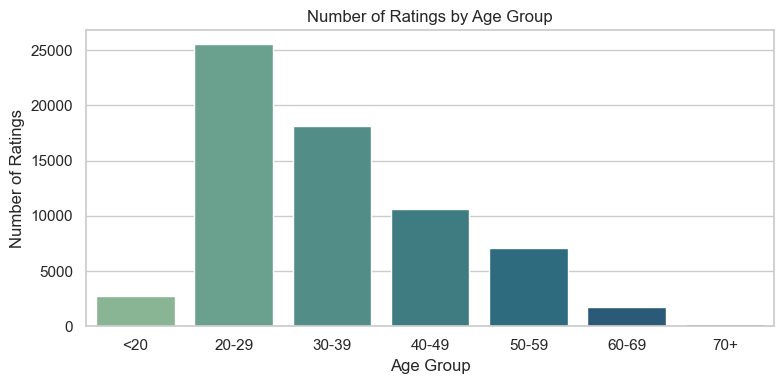

In [60]:
# ==========================
#  2. Ratings per Age
# ==========================

# Count number of ratings per age group
ratings_per_age_group = ratings_all.groupby("age_group")["Rating"].count().reset_index()

# Plot
plt.figure(figsize=(8, 4))
sns.barplot(x="age_group", y="Rating", data=ratings_per_age_group, palette=palette)
plt.title("Number of Ratings by Age Group")
plt.xlabel("Age Group")
plt.ylabel("Number of Ratings")
plt.tight_layout()
plt.show()

Regarding the number of ratings by age groups, the most active group consists of users aged between 20 and 29 years, who provided more than 25,000 ratings. This is followed by the 30-39 and 40-49 age groups, with decreasing participation, though still significant. In contrast, users under 20 and those over 50 years old show a notable decline in the number of ratings, with the number being almost negligible for users over 60 years old. This distribution highlights a clear predominance of young adult users in the dataset, which may be attributed to greater familiarity with digital technologies, a higher interest in recommendation platforms, or simply an overrepresentation of these groups in the original sample. This age bias could influence the type of content recommended, as well as the learning algorithms used, given that the data will predominantly be optimized for a younger user profile. Therefore, it is essential to consider age-based personalization strategies to prevent recommendations from favoring the interests of the dominant demographic groups.

### **2.3 Ratings by Gender**

Here, we analyze how ratings are distributed by gender. Using a count plot, we display the total number of ratings submitted by male and female users. This plot reveals the gender composition of rating activity in the dataset. A significant imbalance, such as one gender contributing far more ratings than the other, can introduce bias into the recommendation system. Recognizing these patterns early helps us interpret later clustering results and assess whether recommendations may be skewed toward dominant user groups.

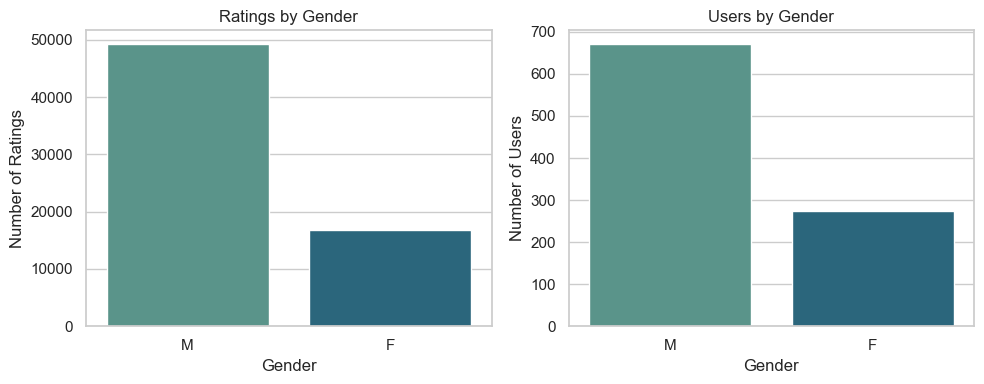

Gender  Number of Ratings  Number of Users  Ratings per User
     M              49191              670             73.42
     F              16851              273             61.73


In [61]:
# ==========================
#  3. Ratings and Users by Gender
# ==========================

# Create figure with 2 subplots side by side
fig, axs = plt.subplots(1, 2, figsize=(10, 4), sharey=False)

# Plot 1: Ratings by Gender
sns.countplot(x="gender", data=ratings_all, palette=palette, ax=axs[0])
axs[0].set_title("Ratings by Gender")
axs[0].set_xlabel("Gender")
axs[0].set_ylabel("Number of Ratings")

# Plot 2: Users by Gender
sns.countplot(x="gender", data=users, palette=palette, ax=axs[1])
axs[1].set_title("Users by Gender")
axs[1].set_xlabel("Gender")
axs[1].set_ylabel("Number of Users")

plt.tight_layout()
plt.show()

# ==========================
#  Ratings per User by Gender (Table)
# ==========================

# Compute values
ratings_per_gender = ratings_all['gender'].value_counts()
users_per_gender = users['gender'].value_counts()

# Ensure order alignment
users_per_gender = users_per_gender[ratings_per_gender.index]
ratings_per_user_gender = (ratings_per_gender / users_per_gender).round(2)

# Print table
gender_comparison = pd.DataFrame({
    "Gender": ratings_per_gender.index,
    "Number of Ratings": ratings_per_gender.values,
    "Number of Users": users_per_gender.values,
    "Ratings per User": ratings_per_user_gender.values
})

print(gender_comparison.to_string(index=False))

In the chart depicting the number of ratings by gender, a significant disparity is observed between male and female participation. Male users submitted approximately 50,000 ratings, whereas female users contributed around 20,000. This gap may be partly explained by the higher representation of men within the user base—670 males with an average of 73.42 ratings per user compared to 273 females with an average of 61.73 ratings. However, it may also reflect differing patterns of engagement between genders.

This imbalance in the distribution of data volume by gender is noteworthy, as it can significantly influence outcomes and algorithmic decisions if not properly addressed. In this context, encouraging greater female participation would not only foster a more balanced analysis but also enhance the diversity of the datasets, thereby contributing to improved fairness and representativeness in recommendation systems.

### **2.4 Average Rating by Gender**

In addition to analyzing how many ratings are submitted by each gender, it's important to examine whether there are differences in **how** movies are rated. In this plot, we visualize the **average rating** given by male and female users. 

To generate the chart, we group the ratings by gender and calculate the mean rating for each group. The resulting bar plot highlights any tendencies one gender may have to rate movies more favorably or critically than the other.


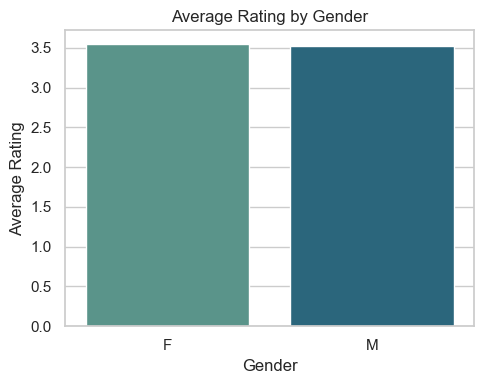

In [62]:
# ==============================
#  4. Average Rating by Gender
# ==============================

avg_rating_gender = ratings_all.groupby("gender")["Rating"].mean().reset_index()
plt.figure(figsize=(5, 4))
sns.barplot(x="gender", y="Rating", data=avg_rating_gender, palette=palette)
plt.title("Average Rating by Gender")
plt.xlabel("Gender")
plt.ylabel("Average Rating")
plt.tight_layout()
plt.show()

The average ratings by gender chart reveals that, in general, female users tend to assign slightly higher ratings than their male counterparts, although the difference is not particularly pronounced. This may indicate a modest tendency among women to be more generous in their evaluations, a factor worth considering when assessing the perceived quality of films or designing recommendation models. When this observation is contextualized within the previous section and chart, it is noteworthy that despite the significantly lower number of ratings submitted by women, their average rating behavior closely mirrors that of men. This suggests a relatively homogeneous evaluation pattern across genders

### **2.5 Ratings by Occupation**

To explore how user occupation relates to rating behavior, we begin by calculating the total number of ratings submitted by users in each profession. The occupations are sorted in descending order based on rating count and visualized using a horizontal bar chart. This allows us to easily identify which professional groups are most active in rating movies.

This analysis gives insight into how engagement with the platform varies across different occupational profiles. For example, certain occupations may have more free time or stronger interest in movies, which can translate to more frequent ratings.

To complement this, we also plot the **number of users per occupation** to see whether high rating activity is due to a large number of users in that group or simply greater participation per individual. Comparing both charts can reveal whether certain occupations are particularly active relative to their size in the dataset.


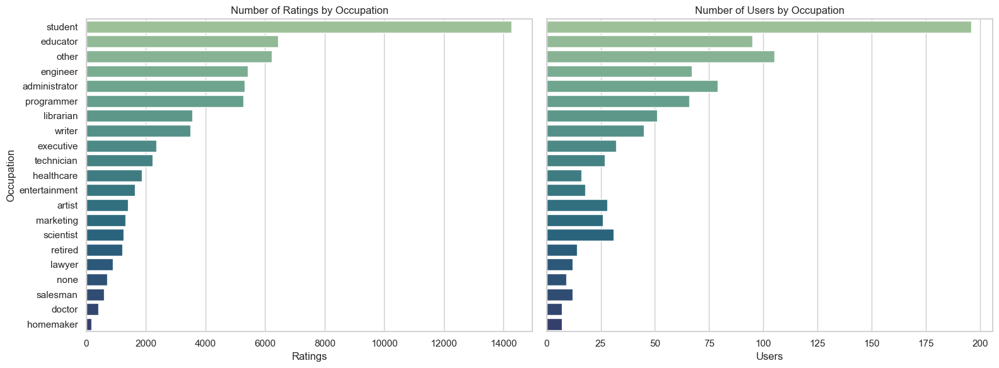

   Occupation  Number of Ratings  Number of Users  Ratings per User
      student              14259              196             72.75
     educator               6444               95             67.83
        other               6218              105             59.22
     engineer               5417               67             80.85
administrator               5315               79             67.28
   programmer               5277               66             79.95
    librarian               3555               51             69.71
       writer               3489               45             77.53
    executive               2358               32             73.69
   technician               2223               27             82.33
   healthcare               1871               16            116.94
entertainment               1641               18             91.17
       artist               1399               28             49.96
    marketing               1322               2

In [63]:
# ============================================
#  5. Ratings vs. Users by Occupation 
# ============================================

# 1. Prepare data
ratings_per_occupation = ratings_all.groupby("occupation")["Rating"].count()
users_per_occupation = users["occupation"].value_counts()

# Align both on common occupations
common_occupations = ratings_per_occupation.index.intersection(users_per_occupation.index)
ratings_per_occupation = ratings_per_occupation[common_occupations].sort_values(ascending=False)
users_per_occupation = users_per_occupation[ratings_per_occupation.index]  # reorder to match

# 2. Plot side-by-side bar charts
fig, axs = plt.subplots(1, 2, figsize=(16, 6), sharey=True)

# Plot: Ratings by Occupation
sns.barplot(x=ratings_per_occupation.values, y=ratings_per_occupation.index, palette=palette, ax=axs[0])
axs[0].set_title("Number of Ratings by Occupation")
axs[0].set_xlabel("Ratings")
axs[0].set_ylabel("Occupation")

# Plot: Users by Occupation
sns.barplot(x=users_per_occupation.values, y=users_per_occupation.index, palette=palette, ax=axs[1])
axs[1].set_title("Number of Users by Occupation")
axs[1].set_xlabel("Users")
axs[1].set_ylabel("")

plt.tight_layout()
plt.show()

# 3. Compute ratings per user 
ratings_per_user = ratings_per_occupation / users_per_occupation

# 4. Print comparison table
comparison_table = pd.DataFrame({
    "Occupation": ratings_per_occupation.index,
    "Number of Ratings": ratings_per_occupation.values,
    "Number of Users": users_per_occupation.values,
    "Ratings per User": ratings_per_user.round(2).values
})

print(comparison_table.to_string(index=False))


When analyzing the number of ratings by occupation, it becomes evident that although students represent the group with the highest absolute number of ratings (14,259), they are not the most actively engaged on an individual level. Professionals in healthcare, entertainment, and retirees stand out with the highest average ratings per user 116.94,

91.17, and 86.93 respectively indicating a strong personal involvement despite having relatively fewer users. Conversely, occupations such as homemaker, scientist, and artist exhibit lower ratings per user, suggesting a more moderate level of participation. This heterogeneity in rating behavior across occupations may have significant implications for recommendation systems, highlighting that user activity levels are influenced not only by group size but also by the intensity of individual contributions.

### **2.6. Most Represented Genres**

To understand the composition of our movie dataset, we begin by identifying the most represented genres. Each movie may belong to multiple genres, and the dataset uses binary indicators (1 or 0) to denote whether a movie falls into a given category.

By summing each genre column, we calculate the total number of movies assigned to that genre. The resulting bar chart displays these totals, showing us which genres are most prevalent in the dataset. This insight helps explain potential rating biases if certain genres dominate the dataset.

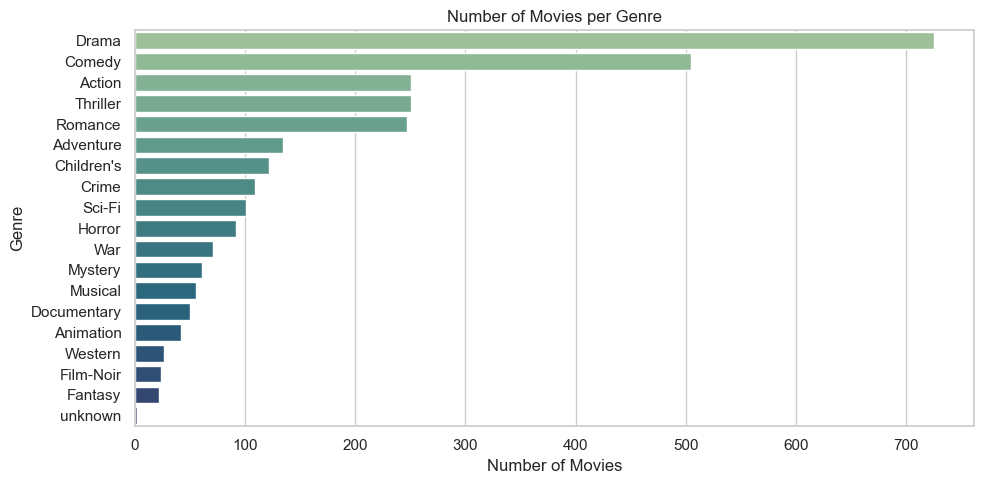

In [64]:
# ==============================
#  6. Most Represented Genres
# ==============================

genre_counts = movies[genre_columns].sum().sort_values(ascending=False)
plt.figure(figsize=(10, 5))
sns.barplot(x=genre_counts.values, y=genre_counts.index, palette=palette)
plt.title("Number of Movies per Genre")
plt.xlabel("Number of Movies")
plt.ylabel("Genre")
plt.tight_layout()
plt.show()

Regarding the output related to the most represented genres, the data highlights the frequency with which each genre appears in the movie database, thereby allowing for the identification of the most common types of content within the analyzed dataset. Drama, comedy, and action clearly stand out as the most prevalent genres, suggesting a notable trend in both the production and categorization of these types of films. In contrast, genres such as western, film noir, and fantasy are among the least represented, indicating either lower availability or more limited production within the analyzed corpus.

This uneven distribution may have several implications. On the one hand, the predominance of certain genres could reflect market preferences or editorial decisions when curating or classifying content. On the other hand, it may also introduce bias into recommendation systems, as algorithms tend to favor genres with larger volumes of data.

### **2.7 Average Rating per Genre**

Next, we analyze how different genres are rated on average. For each genre, we identify the set of movies labeled with that genre and extract all user ratings associated with those movies. We then compute the mean rating for each genre.

The resulting bar chart shows the average user rating per genre, allowing us to compare overall audience satisfaction across genres. This information is helpful when interpreting user preferences and assessing genre popularity beyond just frequency.

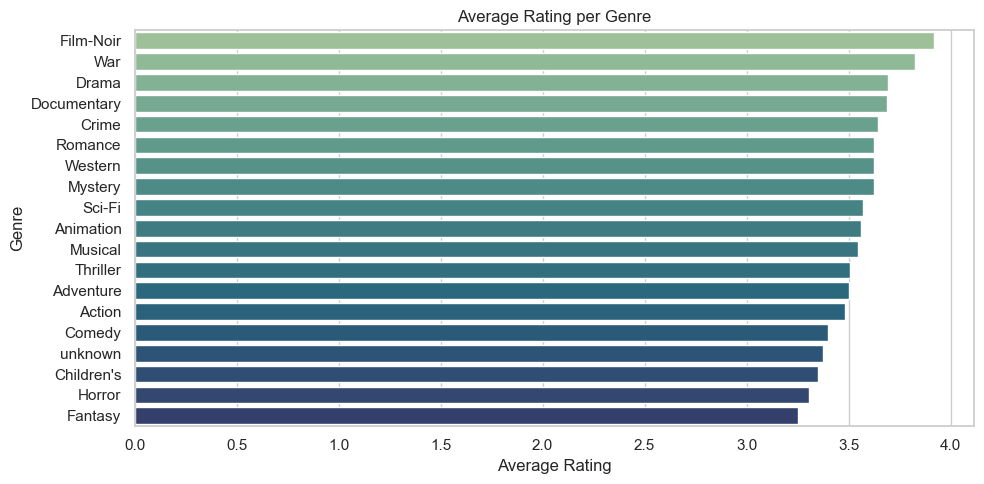

In [65]:
# ===============================
#  7. Average Rating per Genre
# ===============================

genre_avg_rating = {}
for genre in genre_columns:
    ids = movies[movies[genre] == 1]["Item ID"]
    genre_ratings = ratings[ratings["Item ID"].isin(ids)]["Rating"]
    genre_avg_rating[genre] = genre_ratings.mean()

genre_avg_rating = pd.Series(genre_avg_rating).sort_values(ascending=False)
plt.figure(figsize=(10, 5))
sns.barplot(x=genre_avg_rating.values, y=genre_avg_rating.index, palette=palette)
plt.title("Average Rating per Genre")
plt.xlabel("Average Rating")
plt.ylabel("Genre")
plt.tight_layout()
plt.show()

Regarding the average rating by genre, the analysis focuses on the mean score received by films within each category, offering insights into how perceived quality varies across cinematic genres. Genres such as film noir, war, and drama top the list with the highest average ratings, suggesting that, although they may not be the most prevalent in the database, audiences who engage with these genres tend to evaluate them very positively. In contrast, genres like fantasy, horror, and children’s content receive lower average scores, possibly due to more polarized opinions or unmet viewer expectations.

When comparing this information with the chart of most represented genres, an interesting pattern emerges: drama and comedy, despite being among the most common, do not stand out in terms of average rating. This indicates that a genre’s abundance in the catalog does not necessarily equate to higher user satisfaction. Conversely, less represented genres such as film noir or western, though scarce, achieve high ratings, potentially reflecting a more specific, selective, and satisfied audience.

These insights highlight the importance of not relying solely on genre frequency when developing recommendation models. A widely available genre is not necessarily better received by users. Thus, incorporating both representation and average rating enables the design of more personalized, balanced, and effective recommendations ones that prioritize the actual user experience rather than merely the volume of content available.

### **2.8 Genre Preferences by Gender**

To explore how genre preferences differ by gender, we analyze the proportion of movies rated within each genre by male and female users.

We group the fully merged dataset (`ratings_all`) by gender and compute the mean value for each genre column. Since these columns contain binary values (1 if the genre is associated with the rated movie, 0 otherwise), the result represents the **proportion of rated movies** that belong to each genre for each gender.

The grouped bar chart allows us to visually compare genre engagement across genders, revealing potential differences in taste and viewing habits. This analysis may guide personalization strategies in gender-aware recommendation systems.

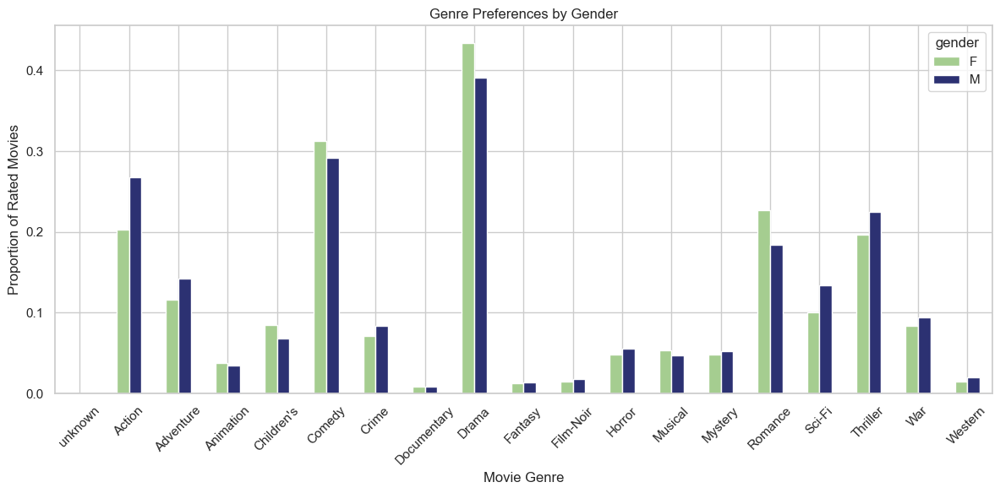

In [66]:
# =================================
#  8. Genre Preference by Gender
# ================================

genre_by_gender = ratings_all.groupby("gender")[genre_columns].mean().T
genre_by_gender.plot(kind="bar", figsize=(12, 6), colormap=palette)
plt.title("Genre Preferences by Gender")
plt.xlabel("Movie Genre")
plt.ylabel("Proportion of Rated Movies")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

The Genre Preferences by Gender chart reveals clear distinctions in the cinematic interests of men and women when rating films. Among female users, the drama genre stands out as the most favored category, with over 45% of the films they rate belonging to this classification. This preference suggests a notable affinity for content focused on emotional development, personal conflict, and narrative depth. Furthermore, there is increased female engagement with genres such as romance and musicals, reinforcing a tendency toward productions with a stronger aesthetic and emotional component.

In contrast, male users exhibit higher levels of activity in genres such as action, science fiction, and thriller. Notably, action films account for more than 25% of their ratings, whereas this proportion is significantly lower among women. This behavior points to a male inclination toward fast-paced narratives, intense visual effects, and themes rooted in adventure, suspense, or fantasy.

On the other hand, genres such as comedy and animation show a relatively balanced distribution between genders, indicating a broader acceptance that is not strongly influenced by the viewer’s sex.

These differences in preferences highlight the importance of incorporating variables such as gender in the design of personalized recommendation systems. Failing to account for such distinctions may result in biased or unrepresentative recommendations. Therefore, implementing personalization strategies that consider these factors would not only enhance the accuracy of recommendation systems but also promote fairness and diversity in the user experience.

### **2.9 Movie Statistics**

In this section, we will look into important movie statistics. First, we will display the **top 5 highest-rated** and **bottom 5 lowest-rated** movies, considering only those that have received **more than 100 ratings**. This ensures that the results reflect consistently rated titles rather than outliers with very few reviews.

In [67]:
# Group movies by title and compute average rating and number of ratings
movie_stats = ratings_all.groupby("title").agg(
    num_ratings=("Rating", "count"),
    avg_rating=("Rating", "mean"),
    genre=("genre_list", "first")
).reset_index()

# Filter to include only movies with more than 100 ratings
popular_movies = movie_stats[movie_stats["num_ratings"] > 100]

# Get Top 5 highest-rated movies
top_5 = popular_movies.sort_values(by="avg_rating", ascending=False).head(5)
top_5["Rank"] = "Top 5"

# Get Bottom 5 lowest-rated movies
bottom_5 = popular_movies.sort_values(by="avg_rating", ascending=True).head(5)
bottom_5["Rank"] = "Bottom 5"

# Combine into one table
top_bottom_movies = pd.concat([top_5, bottom_5], ignore_index=True)

# Reorder columns for display
top_bottom_movies = top_bottom_movies[["Rank", "title", "genre", "avg_rating", "num_ratings"]]

# Show as table
display(top_bottom_movies)

,Rank,title,genre,avg_rating,num_ratings
0,Top 5,Casablanca (1942),"[Drama, Romance, War]",4.487500,160
1,Top 5,Schindler's List (1993),"[Drama, War]",4.449495,198
2,Top 5,"Shawshank Redemption, The (1994)",[Drama],4.439560,182
3,Top 5,Rear Window (1954),"[Mystery, Thriller]",4.340741,135
4,Top 5,"Usual Suspects, The (1995)","[Crime, Thriller]",4.338983,177
5,Bottom 5,George of the Jungle (1997),"[Children's, Comedy]",2.601852,108
6,Bottom 5,Volcano (1997),"[Drama, Thriller]",2.700000,150
7,Bottom 5,Mars Attacks! (1996),"[Action, Comedy, Sci-Fi, War]",2.872180,133
8,Bottom 5,"Lost World: Jurassic Park, The (1997)","[Action, Adventure, Sci-Fi, Thriller]",2.895238,105
9,Bottom 5,"First Wives Club, The (1996)",[Comedy],2.902913,103


The table presents the top five highest-rated and bottom five lowest-rated films, considering only those with more than 100 ratings. This criterion ensures that the results are based on a statistically reliable sample. The highest-rated movies such as Casablanca, Schindler's List, and The Shawshank Redemption not only achieve high average scores but also belong to genres with strong emotional or historical components, such as drama and war. These titles are widely appreciated by audiences, making them particularly valuable in cold-start scenarios, where there is little to no prior information about a user’s preferences. Such universally acclaimed films serve as safe initial recommendations due to their broad appeal and widespread recognition.

Conversely, the lowest-rated movies, despite having substantial visibility and rating counts, receive significantly lower average scores. This suggests that while they may have been commercially prominent, they often fail to meet audience expectations. Incorporating this insight into recommendation systems can help avoid unfavourable suggestions and enhance the overall user experience from the outset.

We now shift our focus to movie preference by certain groups. In particular, we aim to identify which movies are most popular within each age group and occupation category. To achieve this, we present two summary tables: the first displays the most watched movie for each age group, and the second does the same for each occupation.

In [68]:
# Define how many top movies we want per group
TOP_N = 1

# ===============================
# Compute Top N Movies by Age Group
# ===============================
top_by_age = {}
# Loop through each unique age group
for group in ratings_all["age_group"].dropna().unique():
    # Filter data for the current age group
    group_data = ratings_all[ratings_all["age_group"] == group]

    # Aggregate statistics: number of ratings, average rating, and genre
    movie_stats = group_data.groupby("title").agg(
        num_ratings=("Rating", "count"),
        avg_rating=("Rating", "mean"),
        genre=("genre_list", "first")  
    )

    # Sort movies by number of ratings and select top N
    movie_stats = movie_stats.sort_values(by="num_ratings", ascending=False).head(TOP_N)

    # Save result in dictionary using age group as key
    top_by_age[str(group)] = movie_stats.round(2)

    # Format Markdown Table: Age Group
age_summary_md = "| Age Group | Movie Rank | Title | Genres | Avg Rating | # Ratings |\n"
age_summary_md += "|-----------|-------------|--------|--------|------------|------------|\n"

# Loop through each age group and its top movies
for group, df in top_by_age.items():
    for i, (_, row) in enumerate(df.iterrows(), 1):
        age_summary_md += f"| {group if i == 1 else ''} | {i} | {row.name} | {row['genre']} | {row['avg_rating']:.2f} | {row['num_ratings']} |\n"

# Display Results in Notebook
display(Markdown("### Top Movie by Age Group\n" + age_summary_md))

### Top Movie by Age Group
| Age Group | Movie Rank | Title | Genres | Avg Rating | # Ratings |
|-----------|-------------|--------|--------|------------|------------|
| 20-29 | 1 | Chasing Amy (1997) | ['Drama', 'Romance'] | 3.79 | 184 |
| 50-59 | 1 | English Patient, The (1996) | ['Drama', 'Romance', 'War'] | 3.86 | 50 |
| 30-39 | 1 | Star Wars (1977) | ['Action', 'Adventure', 'Romance', 'Sci-Fi', 'War'] | 4.26 | 108 |
| 40-49 | 1 | Star Wars (1977) | ['Action', 'Adventure', 'Romance', 'Sci-Fi', 'War'] | 4.14 | 65 |
| <20 | 1 | Scream (1996) | ['Horror', 'Thriller'] | 4.03 | 30 |
| 60-69 | 1 | English Patient, The (1996) | ['Drama', 'Romance', 'War'] | 3.88 | 17 |
| 70+ | 1 | Get Shorty (1995) | ['Action', 'Comedy', 'Drama'] | 3.67 | 3 |


The table presents the highest-rated movies within each age group, revealing generational differences in cinematic tastes. For instance, in the 30-49 age groups, Star Wars (1977) ranks first, reflecting a strong nostalgic affinity for science fiction and adventure classics that

defined an era. In contrast, older groups (50-59 and 60-69) both favor The English Patient (1996), a dramatic and romantic film with a historical context, suggesting a preference for deeper, more reflective narratives. On the other hand, younger viewers (<20) show greater enthusiasm for Scream (1996), indicating a tendency toward suspense and horror genres, which often appeal to adolescent audiences due to their emotional intensity. It is important to note that the data from the 70+ age group come from an extremely small sample, only three ratings, which limits the statistical robustness of the results.

In [69]:
# ===============================
# Compute Top N Movies by Occupation
# ===============================
top_by_occupation = {}
# Loop through each unique occupation
for occ in ratings_all["occupation"].dropna().unique():
    # Filter data for the current occupation
    occ_data = ratings_all[ratings_all["occupation"] == occ]

    # Aggregate statistics: number of ratings, average rating, and genre
    movie_stats = occ_data.groupby("title").agg(
        num_ratings=("Rating", "count"),
        avg_rating=("Rating", "mean"),
        genre=("genre_list", "first")
    )

    # Sort by number of ratings and select top N
    movie_stats = movie_stats.sort_values(by="num_ratings", ascending=False).head(TOP_N)

    # Store results in dictionary
    top_by_occupation[occ] = movie_stats.round(2)


# Format Markdown Table: Occupation
occ_summary_md = "| Occupation | Movie Rank | Title | Genres | Avg Rating | # Ratings |\n"
occ_summary_md += "|------------|-------------|--------|--------|------------|------------|\n"

# Loop through each occupation and its top movies
for occ, df in top_by_occupation.items():
    for i, (_, row) in enumerate(df.iterrows(), 1):
        occ_summary_md += f"| {occ if i == 1 else ''} | {i} | {row.name} | {row['genre']} | {row['avg_rating']:.2f} | {row['num_ratings']} |\n"

# Display Results in Notebook
display(Markdown("### Top Movie by Occupation\n" + occ_summary_md))


### Top Movie by Occupation
| Occupation | Movie Rank | Title | Genres | Avg Rating | # Ratings |
|------------|-------------|--------|--------|------------|------------|
| technician | 1 | Raiders of the Lost Ark (1981) | ['Action', 'Adventure'] | 4.14 | 14 |
| other | 1 | Star Wars (1977) | ['Action', 'Adventure', 'Romance', 'Sci-Fi', 'War'] | 4.05 | 37 |
| writer | 1 | Chasing Amy (1997) | ['Drama', 'Romance'] | 4.04 | 24 |
| executive | 1 | Contact (1997) | ['Drama', 'Sci-Fi'] | 3.41 | 17 |
| administrator | 1 | English Patient, The (1996) | ['Drama', 'Romance', 'War'] | 3.97 | 33 |
| student | 1 | Scream (1996) | ['Horror', 'Thriller'] | 3.76 | 100 |
| lawyer | 1 | Contact (1997) | ['Drama', 'Sci-Fi'] | 3.38 | 8 |
| educator | 1 | English Patient, The (1996) | ['Drama', 'Romance', 'War'] | 3.55 | 40 |
| scientist | 1 | Chasing Amy (1997) | ['Drama', 'Romance'] | 4.17 | 12 |
| entertainment | 1 | Chasing Amy (1997) | ['Drama', 'Romance'] | 3.86 | 14 |
| programmer | 1 | Star Wars (1977) | ['Action', 'Adventure', 'Romance', 'Sci-Fi', 'War'] | 4.53 | 36 |
| librarian | 1 | English Patient, The (1996) | ['Drama', 'Romance', 'War'] | 3.81 | 26 |
| homemaker | 1 | Saint, The (1997) | ['Action', 'Romance', 'Thriller'] | 3.25 | 4 |
| artist | 1 | Chasing Amy (1997) | ['Drama', 'Romance'] | 3.19 | 16 |
| engineer | 1 | Star Wars (1977) | ['Action', 'Adventure', 'Romance', 'Sci-Fi', 'War'] | 4.40 | 40 |
| marketing | 1 | Chasing Amy (1997) | ['Drama', 'Romance'] | 3.17 | 12 |
| none | 1 | Scream (1996) | ['Horror', 'Thriller'] | 4.83 | 6 |
| healthcare | 1 | Fly Away Home (1996) | ['Adventure', "Children's"] | 2.75 | 8 |
| retired | 1 | Star Wars (1977) | ['Action', 'Adventure', 'Romance', 'Sci-Fi', 'War'] | 3.86 | 7 |
| salesman | 1 | Broken Arrow (1996) | ['Action', 'Thriller'] | 3.00 | 5 |
| doctor | 1 | Ulee's Gold (1997) | ['Drama'] | 4.00 | 4 |


Regarding the top-rated movies by occupation, a notable diversity in cinematic preferences is observed. Star Wars (1977) stands out among engineers, programmers, and retirees, suggesting a clear inclination towards classic science fiction and adventure films, genres that seem to appeal to individuals with a technical or nostalgic affinity. On the other hand, Chasing Amy (1997) ranks first among writers, scientists, and artists, reflecting a preference for romantic dramas with an introspective and emotional focus, possibly due to the creative and reflective nature of their occupations.

Another interesting trend is the popularity of The English Patient (1996) among administrators, educators, and librarians, which suggests that these groups value historical romantic dramas, possibly due to the intellectual and formal connections they find within their professions. In contrast, Scream (1996) is the preferred choice among students and those with no recorded occupation, reflecting a greater attraction to suspense and horror genres, which are often popular among younger or less professionally established audiences.

It is important to note that the differences in ratings among various occupations, as well as the variability in the number of reviews, may influence the robustness of the results. Some occupations with lower participation, such as salesman or doctor, have a limited number of reviews, which could introduce biases into the results presented in the table.

## **3.Unsupervised Learning**

In this section, we apply unsupervised learning; specifically KMeans clustering, to analyze groups of users based on their movie preferences. From our previous visualizations, we’ve already observed some general trends. Now we aim to test whether these patterns emerge naturally through clustering.

We begin by constructing a user–genre matrix, where each row represents a user, and each column represents a genre. The values indicate the average rating that user has given to movies within that genre. This representation provides a compact, meaningful summary of each user’s preferences across genres.

In [100]:
# Merge ratings with movie genre_list
ratings_with_genres = ratings_all.merge(movies[['title', 'genre_list']], on='title')

ratings_with_genres.head()

# Explode the genre list
ratings_exploded = ratings_with_genres.explode('genre_list_x')

# Build the user × genre matrix (average rating per genre per user)
user_genre_matrix = ratings_exploded.groupby(['User ID', 'genre_list_x'])['Rating'].mean().unstack().fillna(0)

user_genre_matrix.head()

genre_list_x,Action,Adventure,Animation,Children's,Comedy,Crime,Documentary,Drama,Fantasy,Film-Noir,Horror,Musical,Mystery,Romance,Sci-Fi,Thriller,War,Western,unknown
User ID,,,,,,,,,,,,,,,,,,,
1,3.263889,2.853659,3.300000,2.095238,3.453333,3.590909,4.8,3.913043,3.5,5.0,3.500000,2.909091,3.250000,3.894737,3.923077,3.565217,3.625000,3.666667,4.0
2,3.800000,4.500000,4.000000,2.666667,3.812500,2.909091,0.0,3.764706,3.0,4.0,3.000000,0.000000,3.000000,4.153846,3.750000,3.500000,3.500000,0.000000,0.0
3,2.923077,3.500000,0.000000,0.000000,2.363636,3.200000,5.0,2.777778,0.0,2.5,2.750000,2.000000,3.181818,3.250000,3.000000,2.727273,2.800000,0.000000,0.0
4,4.000000,4.000000,0.000000,0.000000,5.000000,4.857143,0.0,4.750000,0.0,0.0,4.000000,0.000000,4.000000,4.333333,4.200000,4.250000,4.500000,0.000000,0.0
5,3.040816,3.142857,3.923077,2.480000,3.069444,3.875000,0.0,2.583333,2.5,5.0,2.576923,3.363636,3.000000,2.235294,3.428571,2.947368,3.076923,2.500000,4.0


Before clustering, we apply dimensionality reduction to simplify our dataset while preserving its most relevant information. Our user–genre matrix has one column per genre, but many genres are correlated (e.g., users who like Action may also enjoy Adventure). This redundancy can reduce the effectiveness of clustering. We first standardize the features so that each genre column has zero mean and unit variance. This ensures that PCA is not biased toward genres with naturally higher average ratings.

In [101]:
# Normalize features
scaler = StandardScaler()
features_scaled = scaler.fit_transform(user_genre_matrix)

We then apply Principal Component Analysis (PCA) to transform the data into a new set of uncorrelated variables (principal components), ordered by the amount of variance they explain. Initially, we keep all components so we can evaluate how many are needed to retain most of the dataset’s variability.

In [102]:
# Apply PCA
pca = PCA(n_components=None)  # Keep all components to analyze variance
pca_features = pca.fit_transform(features_scaled)

To decide how many components to keep, we compute the cumulative explained variance and plot it. This shows how much total information is retained as we increase the number of components. We draw a red line at 90% to guide our selection.

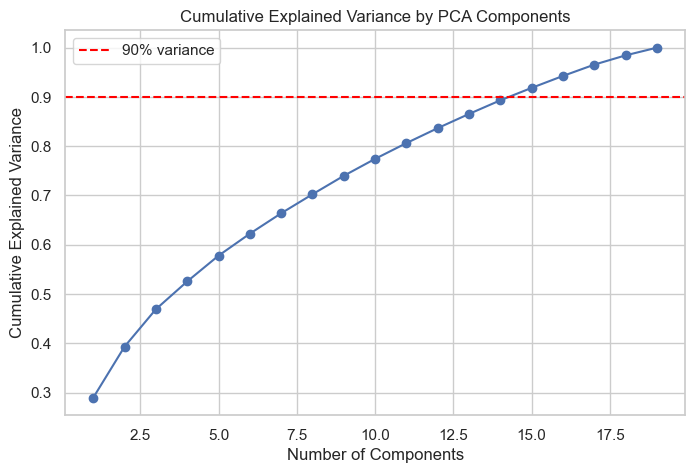

In [103]:
# Plot explained variance to choose optimal components
explained_var = pca.explained_variance_ratio_.cumsum()

plt.figure(figsize=(8, 5))
plt.plot(range(1, len(explained_var)+1), explained_var, marker='o')
plt.axhline(y=0.90, color='red', linestyle='--', label='90% variance')
plt.title('Cumulative Explained Variance by PCA Components')
plt.xlabel('Number of Components')
plt.ylabel('Cumulative Explained Variance')
plt.grid(True)
plt.legend()
plt.show()

Once we visualize the cumulative explained variance, we select the smallest number of principal components that preserve at least 90% of the original variance. This ensures we retain most of the dataset’s structure while reducing dimensionality.

In [104]:
# Choose number of components 
optimal_components = (explained_var >= 0.90).argmax() + 1
print(f"Using {optimal_components} PCA components to retain 90% variance.")

Using 15 PCA components to retain 90% variance.


We then redefine the PCA transformation using only this optimal number of components and apply it to our scaled feature matrix.

In [105]:
# Redefine PCA with optimal components
pca = PCA(n_components=optimal_components)
reduced_features = pca.fit_transform(features_scaled)

With this reduced dataset, we apply KMeans clustering to identify natural groupings of users based on their genre preferences. However, KMeans requires us to specify the number of clusters k in advance.

To choose the most appropriate value of k, we compute two evaluation metrics across a range of cluster counts (k = 2 to 14):

- Inertia (used in the Elbow Method): Measures how tightly grouped the samples are within each cluster. Lower is better.

- Silhouette Score: Measures how similar a user is to their own cluster compared to other clusters. Higher is better.

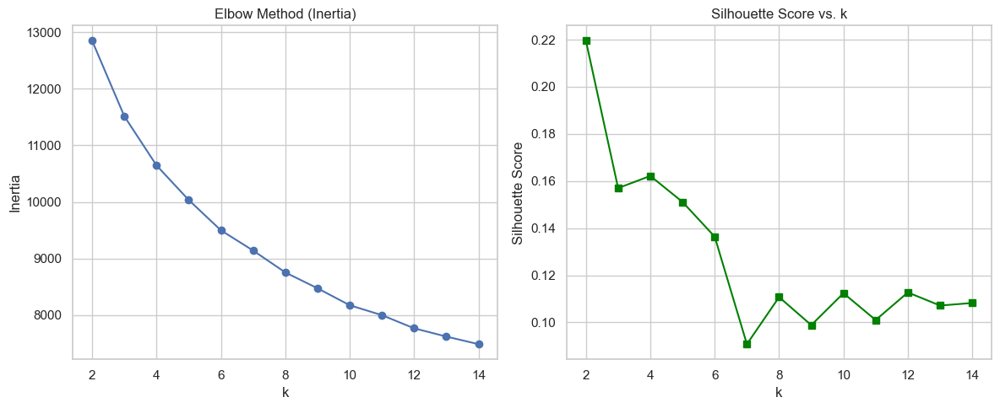

In [106]:
# Try KMeans clustering with different k values
inertia = []
silhouette = []
k_range = range(2, 15)

for k in k_range:
    km = KMeans(n_clusters=k, random_state=42, n_init=10)
    labels = km.fit_predict(reduced_features)
    inertia.append(km.inertia_)
    silhouette.append(silhouette_score(reduced_features, labels))

# Plot Inertia and Silhouette Score
plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.plot(k_range, inertia, 'o-')
plt.title('Elbow Method (Inertia)')
plt.xlabel('k')
plt.ylabel('Inertia')

plt.subplot(1, 2, 2)
plt.plot(k_range, silhouette, 's-', color='green')
plt.title('Silhouette Score vs. k')
plt.xlabel('k')
plt.ylabel('Silhouette Score')

plt.tight_layout()
plt.show()

Based on the graphs, we observe that k = 5 offers a good balance: it is close to the elbow point in the inertia plot and achieves a reasonably high silhouette score. Therefore, we select k = 5 as the number of clusters.

In [107]:
# Final clustering
optimal_k = 5  
kmeans_final = KMeans(n_clusters=optimal_k, random_state=42, n_init=10)
cluster_labels = kmeans_final.fit_predict(reduced_features)

# Assign cluster labels to users
user_genre_matrix['cluster'] = cluster_labels

# Analyze clusters
cluster_summary = user_genre_matrix.groupby('cluster').mean()
display(cluster_summary)

genre_list_x,Action,Adventure,Animation,Children's,Comedy,Crime,Documentary,Drama,Fantasy,Film-Noir,Horror,Musical,Mystery,Romance,Sci-Fi,Thriller,War,Western,unknown
cluster,,,,,,,,,,,,,,,,,,,
0,3.794655,3.639788,1.619979,2.349840,3.616671,3.399005,0.460510,3.916363,0.616915,1.417600,2.177107,1.671744,2.950378,3.929299,3.679657,3.716281,3.904506,0.474502,0.000000
1,3.648234,3.674264,3.326917,3.542899,3.559879,3.682848,1.902062,3.837286,2.709502,3.071229,3.349157,3.585998,3.665563,3.775421,3.683098,3.678053,3.968533,3.108929,0.000000
2,2.941698,2.185897,0.983701,1.516632,2.996413,2.871478,0.817236,3.385800,0.622770,1.275218,1.846408,1.566660,2.560922,3.127564,2.584226,3.032876,2.976382,0.669193,0.000000
3,1.360205,1.004495,0.787967,0.817618,2.386799,0.888472,0.245276,3.007752,0.080688,0.343386,0.528331,1.276942,0.964686,2.121689,1.053401,1.714198,0.897344,0.191468,0.015873
4,3.463917,2.938743,3.280047,3.063415,3.300900,3.733375,1.828571,3.695436,2.759524,4.340136,3.281253,3.127728,3.513312,3.651141,3.027475,3.514699,3.946676,2.956633,3.714286


To better visualize these tendencies, we will display a heatmap.

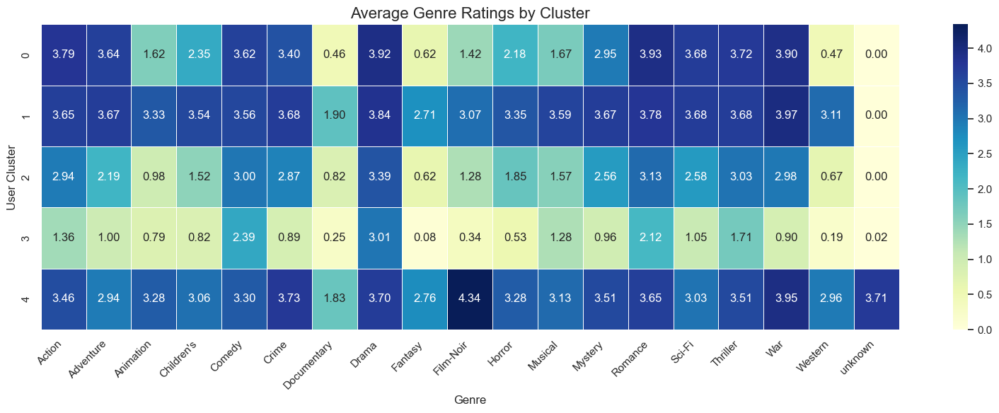

In [108]:
# Create heatmap
plt.figure(figsize=(16, 6))
sns.heatmap(cluster_summary, cmap="YlGnBu", annot=True, fmt=".2f", linewidths=0.5)
plt.title("Average Genre Ratings by Cluster", fontsize=16)
plt.xlabel("Genre")
plt.ylabel("User Cluster")
plt.xticks(rotation=45, ha="right")
plt.tight_layout()
plt.show()

## **4. Recommendation System Overview**

With a comprehensive understanding of our dataset in place, we can now develop a **personalized recommendation system**. Inspired by the layered user experience of platforms like **Netflix**, our system is designed to address both new and returning users through multiple types of recommendations.

### **4.1 User Watch History**

Users will be able to view a summary of the movies they’ve already rated, sorted by rating. This section provides a quick recap of their viewing preferences.

### **4.2 Top Movies in Your Location**

This section displays the most popular or highly rated movies among users from the same region or demographic group, encouraging local discovery and engagement.

### **4.3 Personalized Recommendations**

Upon logging in, returning users will receive a tailored list of movie suggestions. These recommendations are based on **collaborative filtering**, where the system identifies users with similar tastes and recommends movies they enjoyed but that the current user hasn’t yet watched.

### **4.4 Cold-Start Strategy for New Users**

To address the **cold-start problem** for new users (i.e., users with no prior ratings), the system will:

* Ask them to rate a curated list of popular movies.
* Let them select their top three favorite genres.

Using this data, we can immediately provide an initial batch of personalized suggestions while their full profile is being built.

---

### **4.1 User Watch History**

The function `display_watch_history_with_posters` generates a visually appealing, scrollable horizontal gallery of movies that a specific user has rated. Each movie is displayed with its poster, title, and corresponding star rating.

#### **Parameters**

* `user_id`: The ID of the user whose watch history is being displayed.
* `ratings_all`: A DataFrame containing all user ratings. Must include the columns `'User ID'`, `'title'`, and `'Rating'`.
* `posters_df`: A DataFrame containing movie titles and their corresponding poster image URLs. Must include `'title'` and `'poster_url'`.

#### **How it Works**

1. **Filter and Sort User Ratings**
   The function filters the ratings dataset to select only the movies rated by the specified user, then sorts them from highest to lowest rated.

2. **Clean Titles for Merging**
   To enable consistent matching, it removes year suffixes like `(1997)` from movie titles in both the user data and poster data.

3. **Merge with Poster URLs**
   It merges the cleaned user ratings with the poster dataset, using the cleaned titles. If a poster is missing, a default placeholder image is used.

4. **Build HTML Cards**
   For each movie, an HTML "card" is created containing:

   * The movie poster image
   * The title (in white text)
   * The star rating (in gold, e.g., ⭐⭐⭐⭐ (4.0))

5. **Display Scrollable Gallery**
   All the HTML cards are displayed in a horizontal scrollable row using inline CSS styling to mimic a Netflix-like interface.

#### **Output**

The function uses `IPython.display.HTML` to render the scrollable HTML block directly in a Jupyter Notebook cell. It does not return any value — it outputs the content visually.

In [109]:
def display_watch_history_with_posters(user_id, ratings_all, posters_df):
    """
    Displays a scrollable horizontal gallery of movies the user has rated,
    showing posters, white titles, and star ratings.
    """
    # 1. Get the user's ratings, sorted by score
    user_data = ratings_all[ratings_all['User ID'] == user_id][['title', 'Rating']].sort_values(by='Rating', ascending=False)

    # 2. Clean titles for merging
    user_data['title_clean'] = user_data['title'].str.replace(r"\s+\(\d{4}\)", "", regex=True)
    posters_df['title_clean'] = posters_df['title'].str.replace(r"\s+\(\d{4}\)", "", regex=True)

    # 3. Merge with poster URLs
    merged = pd.merge(user_data, posters_df, on='title_clean', how='left')
    merged['poster_url'] = merged['poster_url'].fillna('https://via.placeholder.com/150x220?text=No+Image')

    # 4. Build HTML card view
    cards = ""
    for _, row in merged.iterrows():
        title_clean = row['title_clean']
        rating = row['Rating']
        poster = row['poster_url']
        stars = "⭐" * int(round(rating)) + f" ({rating:.1f})"

        cards += f"""
        <div style="flex: 0 0 auto; width: 150px; margin-right: 15px;">
            <img src="{poster}" style="width: 100%; border-radius: 8px; box-shadow: 2px 2px 6px rgba(0,0,0,0.15);">
            <div style="margin-top: 5px;">
                <strong style="font-size: 14px; color: #ffffff;">{title_clean}</strong><br>
                <span style="font-size: 12px; color: #f39c12;">{stars}</span>
            </div>
        </div>
        """

    # 5. Display scrollable row
    html = f"""
    <div style="font-family: Arial, sans-serif; padding: 10px;">
        <h3 style="color: #ffffff;">Watch again</h3>
        <div style="display: flex; overflow-x: auto; padding: 10px 0; scrollbar-width: thin;">
            {cards}
        </div>
    </div>
    """

    display(HTML(html))


### **4.1.1 Watch History Setup for Personalized View**

WWe select an example user (`user_id = 123`) and prepare the dataset to display their previously rated movies.

In [110]:
# Parameters (Example user ID)
user_id = 123

# Read movie_poster.csv file
posters = pd.read_csv('movie_poster.csv', header=None, names=['Item ID', 'poster_url'])
posters.head()

# Merge with poster URLs
posters_df = pd.merge(movies, posters, on='Item ID', how='left')

# Display user 123's watch history
display_watch_history_with_posters(user_id, ratings_all, posters_df)

User ID 123 is a female between the ages of forty and forty-nine, professionally engaged in the arts. The initial step involved identifying the films she had previously viewed, which were categorized under the Watch again section. These titles were arranged in descending order according to the ratings she personally assigned, thereby facilitating a more accurate interpretation of her cinematic preferences.

An examination of the genres associated with the films that received the highest rating of five stars revealed a marked inclination toward drama, classic cinema, and narratives with profound emotional or thematic content. This tendency is exemplified by films such as Dead Man Walking, Secrets & Lies, and The English Patient, all of which explore deeply human experiences. A strong preference for historical and auteur cinema also emerged, as seen in Lawrence of Arabia and Jean de Florette, along with a distinct appreciation for musicals and classics like The Sound of Music, My Fair Lady, and Fantasia, which suggest an aesthetic sensibility aligned with her professional background in the arts.

Notably, her list of most highly rated titles also includes works of science fiction and fantasy, such as 2001: A Space Odyssey and Fantasia. This inclusion highlights her openness to innovative visual styles, symbolic narratives, and speculative storytelling, thus broadening the spectrum of genres she positively engages with. Although her predominant taste gravitates toward emotionally rich and classical storytelling, she also demonstrates an appreciation for films that offer visual experimentation, conceptual abstraction, and allegorical dimensions.

Among the films rated with four stars, including The Silence of the Lambs, Taxi Driver, and Vertigo, there is a discernible interest in psychological thrillers and crime dramas. These choices indicate a proclivity for intense, character-driven narratives, although they do not occupy the highest tier of preference. Meanwhile, titles such as Star Wars, The Shawshank Redemption, and North by Northwest, which received three-star ratings, represent genres such as science fiction, action, and adventure. These appear to provoke moderate engagement. On the other hand, the lowest-rated films, including Evita and My Best Friend’s Wedding, which were assigned one or two stars, primarily belong to the romantic and light comedy genres, suggesting limited affinity toward these types of narratives.

Following this initial evaluation based solely on user 123's own ratings, a clear pattern of preference emerged, favoring genres such as drama, classic cinema, psychological thrillers, science fiction, and auteur films. 

---

### **4.1.2 User Interface**

#### **Function: `display_movies_with_posters`**

The function `display_movies_with_posters` generates a visually engaging, scrollable gallery of movie posters using HTML formatting. It is used to present movie lists—optionally including predicted or actual ratings—in a user-friendly and application-like format.

#### **Parameters**

* `movies_list`: `list[str]`
  A list of movie titles to be shown in the gallery.

* `posters_df`: `DataFrame`
  DataFrame that must contain two columns: `'title'` and `'poster_url'`, where each row maps a movie to its poster image.

* `header_title`: `str`
  Title to be displayed above the gallery section (e.g., "Because You Liked...", "Watch Again").

* `ratings_dict`: `dict`, optional
  A dictionary mapping each movie title to its predicted or actual rating (e.g., `{ "Toy Story": 4.5 }`). If provided, star ratings will be shown below each poster.

* `user_id`: `int`, optional
  If passed, the header will indicate the user to whom the recommendations belong.

#### **How it Works**

1. **Prepare Clean Titles for Matching**
   Removes year annotations from movie titles (e.g., `"Toy Story (1995)" → "Toy Story"`) for more consistent merging with poster data.

2. **Merge Poster URLs**
   Joins the list of movie titles with the `posters_df` on the cleaned title column to retrieve the corresponding poster URL.

3. **Build HTML Cards**
   Iterates over the merged dataset and creates HTML "cards" for each movie. These include the movie poster, title (in white), and a gold star rating if `ratings_dict` is provided.

4. **Assemble and Display Gallery**
   Constructs a horizontally scrollable container of all cards with the given section header and displays the resulting HTML.

#### **Returns**

* This function does not return anything. It directly renders the scrollable gallery in the notebook environment using `IPython.display`.

In [ ]:
def display_movies_with_posters(movies_list, posters_df, header_title, ratings_dict=None, user_id=None):
    """
    Displays a scrollable horizontal gallery of movie posters with optional ratings.
    """
    # Clean titles for merging
    titles_df = pd.DataFrame({'title': movies_list})
    titles_df['title_clean'] = titles_df['title'].astype(str).str.replace(r"\s+\(\d{4}\)", "", regex=True)
    posters_df['title_clean'] = posters_df['title'].str.replace(r"\s+\(\d{4}\)", "", regex=True)

    # Merge to get poster URLs
    merged = pd.merge(titles_df, posters_df, on='title_clean', how='left')
    merged['poster_url'] = merged['poster_url'].fillna('https://www.prokerala.com/movies/assets/img/no-poster-available.jpg')

    # Generate cards
    cards = ""
    for _, row in merged.iterrows():
        title = row['title_clean']
        poster = row['poster_url']
        rating = ratings_dict.get(title) if ratings_dict else None
        stars = f"{'⭐' * int(round(rating))} ({rating:.1f})" if rating is not None else ""

        cards += f"""
        <div style="flex: 0 0 auto; width: 150px; margin-right: 15px;">
            <img src="{poster}" style="width: 100%; border-radius: 8px; box-shadow: 2px 2px 6px rgba(0,0,0,0.15);">
            <div style="margin-top: 5px;">
                <strong style="font-size: 14px; color: #ffffff;">{title}</strong><br>
                <span style="font-size: 12px; color: #f39c12;">{stars}</span>
            </div>
        </div>
        """

    # Display HTML
    user_section = f" for User {user_id}" if user_id is not None else ""
    html = f"""
    <div style="font-family: Arial, sans-serif; padding: 10px;">
        <h3 style="color: #ffffff;">{header_title}</h3>
        <div style="display: flex; overflow-x: auto; padding: 10px 0; scrollbar-width: thin;">
            {cards}
        </div>
    </div>
    """

    display(HTML(html))

---

### **4.2 Top Movies in Your Location**

This function recommends the **top 10 highest-rated movies** in the user’s **geographic area**, based on their `zip code`. It leverages the existing ratings dataset to find what people near the user are watching and enjoying the most.


#### **How It Works**

1. **Input: Logged-in User's ID**  
   The system extracts the `zip code` of the logged-in user using the `users_df`.

2. **Filtering Local Users**  
   All users with the **same zip code** are selected, and their ratings are aggregated.

3. **Top Movie Selection**  
   Among the ratings of users from that zip code, the function computes the **average ratings** per movie and selects the **top 10 highest-rated movies**, ensuring a minimum number of ratings if needed.

4. **Displaying the Results**  
   These top movies are displayed with **poster images** using the `display_movies_with_posters` function for an engaging experience.

#### **Output**

- A visual list of **10 popular movies** in the user’s area.
- Useful for users with little to no rating history.

In [112]:
def recommend_top_movies_by_state(user_id, ratings_copy, zip_state_df, posters_df):
    """
    Recommends and displays the top 10 most popular movies in the user's state using their zip code.
    """

    # Step 1: Get user's zip code
    user_info = ratings_copy[ratings_copy['User ID'] == user_id]
    
    if user_info.empty:
        print("User not found.")
        return []

    user_zip = str(user_info.iloc[0]['zip_code']).zfill(5)

    # Step 2: Map zip code to state
    state_row = zip_state_df[zip_state_df['zip'].astype(str).str.zfill(5) == user_zip]
    if state_row.empty:
        print("Could not find state for the user's zip code.")
        return []

    state_name = state_row.iloc[0]['state_name']

    # Step 3: Get all users from the same state
    state_zips = zip_state_df[zip_state_df['state_name'] == state_name]['zip'].astype(str)
    state_users = ratings_copy[ratings_copy['zip_code'].astype(str).isin(state_zips)]

    # Step 4: Get top 10 most rated movies in that state
    top_movies = (
        state_users.groupby('title')['Rating']
        .count()
        .sort_values(ascending=False)
        .head(10)
        .index
        .tolist()
    )

    # Step 5: Display results with posters
    display_movies_with_posters(top_movies, posters_df, header_title=f"Top Movies in {state_name}")

    return top_movies

In [113]:
# Load zip code csv file
zip_state_df = pd.read_excel("zip_codes_us.xlsx")

# Select an example user to display most popular movies
user_id = 4
recommend_top_movies_by_state(user_id, ratings_complete, zip_state_df, posters_df)

['Star Wars (1977)',
 'Independence Day (ID4) (1996)',
 'Return of the Jedi (1983)',
 'Contact (1997)',
 'Mission: Impossible (1996)',
 'Liar Liar (1997)',
 'Braveheart (1995)',
 'Toy Story (1995)',
 'Fargo (1996)',
 'E.T. the Extra-Terrestrial (1982)']

One of the main strengths of this recommendation system lies in its ability to incorporate the geographical variable of the postal code, a factor that had not been considered in previous models. Including this dimension is essential to fully leveraging the information available in the dataset and to developing a more robust, comprehensive, and context-aware model that is sensitive to the users’ sociocultural environment. In this approach, a strategy is implemented that links each user to their state of residence, using the reported postal code as a starting point. By cross-referencing postal codes with their corresponding states, it becomes possible to identify all users within the same region and analyze their movie ratings to determine which films are most popular in that geographic context.

For example, when applying this method to a user residing in the state of Ohio, the system recommends titles such as Star Wars, Independence Day, Return of the Jedi, Contact, Mission Impossible, Liar Liar, Braveheart, Toy Story, Fargo and E.T. the Extra-Terrestrial, reflecting the prevailing cinematic preferences among users in that region. This strategy resembles those used by platforms such as Netflix, which utilize demographic and location-based data to personalize content suggestions, offering recommendations that are more relevant and widely accepted within specific areas.

This type of geographically contextualized recommendation is particularly effective when applied to broader spatial units, such as states or countries, where consumption trends are typically more stable and representative. In contrast, smaller regions defined by a single postal code may present challenges due to the limited volume of data, which can hinder the identification of consistent and generalizable viewing patterns.

---

### **4.3 Personalized Recommendations**

This section of our system delivers personalized movie recommendations using a **user–user collaborative filtering approach** based on K-Nearest Neighbors (KNN). We explore two variations of this method:

1. **Standard Collaborative Filtering**: We use a user–movie rating matrix to identify users with similar preferences and recommend movies they rated highly but that the target user hasn't seen.
2. **Hybrid Filtering with Demographic Boosting**: We enhance the standard method by incorporating user demographic information; such as **age group**, **gender**, and **occupation**, to increase the influence of users with similar profiles.

By comparing both methods, we aim to evaluate the impact of demographic context on recommendation quality.

### **4.3.1 Building the User–Movie Matrix**

To begin the recommendation process, we construct a matrix that captures each user's interaction with the movies in the dataset. In this matrix, each **row corresponds to a user**, and each **column corresponds to a movie**.

We include only movies that have received at least one rating and compute the **average rating for each user–movie pair** to ensure that every cell reflects a single, consistent score.

The final result is a **user–movie matrix** in which:

* Each row represents a unique user
* Each column represents a unique movie
* Each cell contains the user’s average rating for that movie

In [114]:
#  Select relevant columns: User ID, Movie Title, Rating
ratings_all = ratings_all.iloc[:, [0, 1, 2]]

# Average multiple ratings per (User, Movie) pair
ratings_all = ratings_all.groupby(
    by=['User ID', 'title'], as_index=False
).agg({"Rating": "mean"})

ratings_all.head()

# Pivot the table to form the user–movie matrix
user_movie_df = ratings_all.pivot(
    index='User ID',
    columns='title',
    values='Rating'
).fillna(0)

user_movie_df.head()

title,'Til There Was You (1997),1-900 (1994),101 Dalmatians (1996),12 Angry Men (1957),187 (1997),2 Days in the Valley (1996),"20,000 Leagues Under the Sea (1954)",2001: A Space Odyssey (1968),3 Ninjas: High Noon At Mega Mountain (1998),"39 Steps, The (1935)",...,"Wrong Trousers, The (1993)",Wyatt Earp (1994),Yankee Zulu (1994),Year of the Horse (1997),Young Frankenstein (1974),Young Guns (1988),Young Guns II (1990),"Young Poisoner's Handbook, The (1995)",Zeus and Roxanne (1997),unknown
User ID,,,,,,,,,,,,,,,,,,,,,
1,0.0,0.0,2.0,5.0,0.0,0.0,3.0,4.0,0.0,0.0,...,5.0,0.0,0.0,0.0,5.0,3.0,0.0,0.0,0.0,4.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,2.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
5,0.0,0.0,2.0,0.0,0.0,0.0,0.0,4.0,0.0,0.0,...,5.0,0.0,0.0,0.0,4.0,0.0,0.0,0.0,0.0,4.0


To evaluate our recommendation system rigorously, we simulate a real-world scenario by hiding a portion of known ratings and testing whether the system can predict them. The process is as follows:

In [ ]:
# Create a copy to mask and evaluate
user_movie_df_copy = user_movie_df.copy()
test_entries = []

# Iterate over each user
for user_idx in range(user_movie_df.shape[0]):
    # Get indices of movies rated by this user
    rated_movie_indices = user_movie_df.iloc[user_idx].to_numpy().nonzero()[0]

    # Skip users with very few ratings
    if len(rated_movie_indices) < 15:
        continue

    # Randomly choose 20% to mask for testing
    test_size = max(1, int(0.2 * len(rated_movie_indices)))
    test_indices = np.random.choice(rated_movie_indices, size=test_size, replace=False)

    for movie_idx in test_indices:
        rating = user_movie_df_copy.iat[user_idx, movie_idx]
        test_entries.append((user_idx, movie_idx, rating))
        user_movie_df_copy.iat[user_idx, movie_idx] = 0  

### **4.3.2 Data Splitting for Training**

Once we have masked 20% of each user's ratings, we finalize our train/test split as follows:

* `train_df` holds the **masked version** of the user–movie rating matrix. This is what we’ll use to train the KNN model (it simulates what the model "knows.")
* `train_sparse` is the same matrix converted into a **compressed sparse row format** (`csr_matrix`), which is more efficient for distance computations in KNN.
* `test_df` is created from the `test_entries` list. It stores all the ratings we **masked out** earlier, in the format:

  * `user_idx`: the row index of the user,
  * `movie_idx`: the column index of the hidden movie,
  * `true_rating`: the original rating value (our ground truth for evaluation).

This setup allows us to train on 80% of the known data and test the model's ability to recover the missing 20%.

In [ ]:
# Final train and test
train_df = user_movie_df_copy
train_sparse = csr_matrix(train_df.values)
test_df = pd.DataFrame(test_entries, columns=['user_idx', 'movie_idx', 'true_rating'])

### **4.3.3 Fitting a KNN Model with Cosine Similarity**

Next, we train a **K-Nearest Neighbors (KNN)** model using the sparse user–movie matrix. This model allows us to find the users most similar to our logged-in user, enabling user-based collaborative filtering.

We use the **cosine similarity** metric, which is particularly effective for high-dimensional and sparse datasets like our rating matrix. Cosine similarity measures the cosine of the angle between two vectors, and is defined as:

$$
\text{cosine\_similarity}(A, B) = \frac{A \cdot B}{\|A\| \|B\|}
$$

This captures the **orientation** of the rating patterns rather than their magnitude, making it ideal for comparing user preferences regardless of absolute rating scale.

Because we're using cosine similarity and working with a sparse, high-dimensional matrix, we choose `algorithm='brute'`. This forces the model to compute all pairwise distances directly, which is more reliable than tree-based methods that only work well with low-dimensional Euclidean data.

In [117]:
# Train the KNN model
knn_model = NearestNeighbors(metric='cosine', algorithm='brute')
knn_model.fit(train_sparse)

NearestNeighbors(algorithm='brute', metric='cosine')

### **4.3.4 Function Definitions**

We now define the core functions of the personalized section of our recommendation system. These functions are designed to provide personalized movie suggestions by analyzing a user's past ratings and viewing behavior. As mentioned before, our approach includes two main strategies: a KNN-based collaborative filtering, and a demographic-enhanced hybrid filtering. To achieve this, we define four key functions:

1. **`find_similar_users`** – Finds the top-N most similar users based on rating patterns using KNN.
2. **`find_similar_users_with_demographics`** – Extends the first function by boosting similarity scores for users who share demographic traits with the target user.
3. **`for_you_KNN`** – Generates movie recommendations based solely on rating-based similarity.
4. **`for_you_KNN_demographics`** – A hybrid recommender that uses both rating similarity and demographic similarity to deliver more nuanced suggestions.

<div style="margin-top: 20px;"></div>

---

#### **Function: `find_similar_users`**

This function uses a trained K-Nearest Neighbors (KNN) model to identify the most similar users to a given user based on their movie ratings. 
It computes cosine similarity between users and returns a list of the closest neighbors along with their similarity distances.

#### **Parameters**

* `target_user_id`: `int`
  The ID of the user for whom we want to find similar users.

* `user_movie_df`: `DataFrame`
  A matrix where rows represent users and columns represent movies. The values are ratings, typically with 0 for unrated items.

* `knn_model`: `NearestNeighbors`
  A fitted KNN model (e.g., using `cosine` metric) trained on the sparse user-movie rating matrix.

* `n_neighbors`: `int`
  The number of similar users to retrieve.

* `bool_print`: `bool` (default `True`)
  Whether or not to print the list of similar users and their distances. Useful to suppress output when calling this function from another function.

#### **How it Works**

1. **Extract Target User Vector**
   Retrieves the target user's rating vector from the user-movie matrix.

2. **Find Nearest Neighbors**
   Uses the KNN model to find the `n_neighbors + 1` nearest users (including the user themselves, who is excluded later).

3. **Format and Print Output** *(optional)*
   If `bool_print` is `True`, the function prints a table of the nearest users and their cosine distances.

4. **Compile Output Lists**
   Appends each neighbor’s user ID and distance into separate lists, skipping the target user themself.

#### **Returns**

* `similar_user_ids`: `list[int]`
  A list of user IDs representing the most similar users (excluding the target user).

* `similarity_weights`: `list[float]`
  A list of corresponding cosine distances (smaller values = higher similarity).

In [179]:
# ==============================================================
# Function 1: KNN Similar User Identification
# ==============================================================
def find_similar_users(target_user_id, user_movie_df, knn_model, n_neighbors, bool_print=True):
    """
    Identifies the most similar users to a given user based on cosine similarity over the rating matrix.
    Returns the list of similar user IDs and their distances.
    """
    # Extract the feature vector for the target user
    target_vector = user_movie_df.values[target_user_id - 1].reshape(1, -1)

    # Use the trained KNN model to find the nearest neighbors (including the user themself)
    distances, neighbor_indices = knn_model.kneighbors(target_vector, n_neighbors=n_neighbors + 1)

    # Initialize lists for output
    similar_user_ids = []
    similarity_weights = []


    # Display header for output
    if bool_print:
        print(f"\nTop {n_neighbors} similar users to User-{target_user_id} (based on ratings only):")
        print("User ID | Distance")
        print("-------------------")

    # Iterate over the closest neighbors (skipping the first one, which is the user themself)
    for i in range(1, len(distances[0])):
        neighbor_id = neighbor_indices[0][i] + 1
        distance = distances[0][i]

        if bool_print:
            print(f"{i}. User: {neighbor_id} | Dist: {distance:.4f}")

        similar_user_ids.append(neighbor_id)
        similarity_weights.append(distance)

    return similar_user_ids, similarity_weights

#### **Function: `find_similar_users_with_demographics`**

This function extends basic KNN user similarity by introducing *demographic-aware boosting*. It first finds similar users using cosine similarity over ratings, and then adjusts similarity weights based on how closely each neighbor matches the target user's gender, age group, and occupation.

#### **Parameters**

* `target_user_id`: `int`
  The ID of the user for whom we want to find similar users.

* `user_movie_df`: `DataFrame`
  Matrix of user ratings where rows represent users and columns represent movies.

* `knn_model`: `NearestNeighbors`
  A fitted KNN model trained on the user-movie matrix using cosine similarity.

* `users`: `DataFrame`
  Contains demographic attributes (gender, age\_group, occupation) indexed by user ID - 1.

* `n_neighbors`: `int`
  Number of top similar users to retrieve.

#### **How it Works**

1. **Find Base Similar Users**
   Calls `find_similar_users()` to compute similarity based on rating vectors. Returns user IDs and their cosine distances.

2. **Print Table Header**
   Outputs column headers for the demographic comparison table.

3. **Iterate Through Similar Users**
   For each similar user:

   * Converts distance into a similarity score (inverse of distance).
   * Initializes a boost factor (starting at 1.0).
   * Increases the boost if the neighbor has matching demographic traits.

     * +50% for each of: same gender, same age group, same occupation.
   * Multiplies the base weight by the boost factor to get the final adjusted weight.
   * Prints all info including original and boosted weights.

4. **Normalize the Adjusted Weights**
   The final weights are normalized so they sum to 1, ensuring they can be used as weighted contributions in recommendation scoring.

#### **Returns**

* `adjusted_user_ids`: `list[int]`
  User IDs of the top similar users after demographic weighting.

* `adjusted_weights`: `np.ndarray`
  Corresponding weights (normalized) used to influence recommendations.

In [180]:
# =================================================================
# Function 2: KNN + Demographic-aware Similar User Identification
# =================================================================
def find_similar_users_with_demographics(target_user_id, user_movie_df, knn_model, users, n_neighbors):
    """
    Enhances user similarity search by boosting weights based on demographic similarity.
    Returns a list of similar user IDs and adjusted, normalized weights.
    """
    # Use the base KNN-based method to find similar users and distances
    base_user_ids, base_distances = find_similar_users(target_user_id, user_movie_df, knn_model, n_neighbors, False)

    # Display demographic-enhanced output
    print("\nDemographics-boosted similarities:")
    print("User ID | Distance | Boosted Weight | Gender | Age Group | Occupation")
    print("----------------------------------------------------------------------")

    # Initialize lists for adjusted outputs
    adjusted_user_ids = []
    adjusted_weights = []

    # Iterate over each similar user
    for i, neighbor_id in enumerate(base_user_ids):
        distance = base_distances[i]  # Extract distance
        weight = 1 / (distance + 1e-6)  # Convert distance to similarity score (avoid division by zero)

        # Initialize demographic boost factor
        boost = 1.0

        # Apply boosting for demographic similarity
        if users.loc[(neighbor_id-1), 'gender'] == users.loc[target_user_id-1, 'gender']:
            boost *= 1.5
        if users.loc[(neighbor_id-1), 'age_group'] == users.loc[target_user_id-1, 'age_group']:
            boost *= 1.5
        if users.loc[(neighbor_id-1), 'occupation'] == users.loc[target_user_id-1, 'occupation']:
            boost *= 1.5

        # Calculate adjusted weight after boosting
        adjusted_weight = weight * boost

        # Extract demographic attributes for display
        gender = users.loc[(neighbor_id-1), 'gender']
        age_group = users.loc[(neighbor_id-1), 'age_group']
        occupation = users.loc[(neighbor_id-1), 'occupation']

        # Print formatted output
        print(f"{i+1}. User: {neighbor_id} | Dist: {distance:.4f} | Original Weight:{weight:.4f} | Boost: {boost:.4f}| Weight: {adjusted_weight:.4f} | {gender} | {age_group} | {occupation}")

        # Append results
        adjusted_user_ids.append(neighbor_id)
        adjusted_weights.append(adjusted_weight)

    # Normalize the adjusted weights so that their sum is 1
    adjusted_weights = np.array(adjusted_weights)
    adjusted_weights /= np.sum(adjusted_weights)

    # Return similar users and their normalized weights
    return adjusted_user_ids, adjusted_weights

#### **Function: `for_you_KNN`**

This function generates personalized movie recommendations using classic collaborative filtering based on user similarity derived from the K-Nearest Neighbors (KNN) algorithm and cosine similarity of rating vectors.

#### **Parameters**

* `user_id`: `int`
  The ID of the user for whom the recommendations are being generated.

* `user_movie_df`: `DataFrame`
  Matrix where rows correspond to users and columns correspond to movies. Each cell contains a rating or 0.

* `knn_model`: `NearestNeighbors`
  A trained KNN model using cosine similarity to identify nearest users.

* `top_k_users`: `int`
  The number of similar users to consider when aggregating recommendations.

* `top_k_movies`: `int`
  The number of final movie recommendations to return.

* `watched_movies`: `list[str]`
  A list of movie titles that the target user has already seen. These will be excluded from recommendations.

#### **How it Works**

1. **Find Similar Users**
   Calls `find_similar_users()` to retrieve the top K users most similar to the target user based on cosine distance.

2. **Normalize Similarity Weights**
   Converts distances into weights by normalizing them. These weights determine how much influence each neighbor's ratings should have.

3. **Retrieve Ratings of Neighbors**
   Collects the ratings of the similar users across all movies and stores the movie titles.

4. **Compute Weighted Average Scores**
   Multiplies each neighbor’s rating vector by their respective weight and sums across users to estimate a score for each movie.

5. **Sort Estimated Scores**
   Ranks the movies by their estimated scores, skipping movies with a score of zero (unseen or unrated).

6. **Filter Out Already Watched Movies**
   Removes movies the target user has already rated or watched to avoid redundant recommendations.

7. **Return Top Recommendations**
   Returns the top K recommended movie titles that the user has not seen yet.

#### **Returns**

* `recommended`: `list[str]`
  A list of up to `top_k_movies` movie titles predicted to align with the user's taste based on collaborative filtering.

In [181]:
# ========================================================
# Function 3: KNN Recommender
# ========================================================
def for_you_KNN(user_id, user_movie_df, knn_model, top_k_users, top_k_movies, print_bool):
    """
    Recommends movies using standard collaborative filtering based on user rating similarity only.
    """
    # Find similar users and get distances
    similar_users, distances = find_similar_users(user_id, user_movie_df, knn_model, top_k_users, print_bool)

    # Normalize distances to get weights
    weights = distances / np.sum(distances)

    # Get the ratings of the similar users
    neighbor_ratings = user_movie_df.values[[uid - 1 for uid in similar_users]]
    movie_titles = user_movie_df.columns

    # Compute weighted scores
    weighted_matrix = weights[:, np.newaxis] * neighbor_ratings
    estimated_scores = weighted_matrix.sum(axis=0)

    # Sort scores and remove movies with zero score
    try:
        last_zero_idx = np.where(estimated_scores == 0)[0][-1]
        sorted_idx = np.argsort(estimated_scores)[::-1]
        sorted_idx = sorted_idx[:list(sorted_idx).index(last_zero_idx)]
    except IndexError:
        sorted_idx = np.argsort(estimated_scores)[::-1]

   # Return separate lists: one for titles, one for scores
    recommended_titles = [movie_titles[i] for i in sorted_idx[:top_k_movies]]
    recommended_scores = [estimated_scores[i] for i in sorted_idx[:top_k_movies]]

    return recommended_titles, recommended_scores

#### **Function: `for_you_KNN_demographics`**

This function extends collaborative filtering by incorporating **demographic information** (such as gender, age group, and occupation) into the similarity computation between users. It builds on the KNN recommender to produce more personalized suggestions.

#### **Parameters**

* `user_id`: `int`
  The ID of the target user for whom the recommendations will be generated.

* `user_movie_df`: `DataFrame`
  User-movie rating matrix, where each row corresponds to a user and each column to a movie.

* `users`: `DataFrame`
  Dataset containing demographic details (e.g., gender, age group, occupation) for each user.

* `knn_model`: `NearestNeighbors`
  A pre-trained KNN model using cosine similarity to identify the nearest neighbors in rating space.

* `top_k_users`: `int`
  Number of top similar users to consider for recommendation.

* `top_k_movies`: `int`
  Maximum number of recommended movies to return.

* `watched_movies`: `list[str]`
  A list of movies already rated by the target user. These will be excluded from the output.

#### **How it Works**

1. **Find Demographically Similar Users**
   Calls `find_similar_users_with_demographics()`, which boosts similarity scores if users share gender, age group, or occupation with the target user.

2. **Extract Ratings of Similar Users**
   Uses the identified similar users to retrieve their ratings from the `user_movie_df`.

3. **Compute Weighted Scores**
   Multiplies each similar user’s rating vector by their adjusted similarity weight and sums the results to obtain predicted scores for each movie.

4. **Sort Predictions**
   Sorts the estimated scores in descending order, optionally trimming off movies with a score of zero.

5. **Filter Watched Movies**
   Removes any movie already rated by the user to avoid repetition in recommendations.

6. **Return Top Predictions**
   Returns a ranked list of up to `top_k_movies` titles that the user is predicted to enjoy.

#### **Returns**

* `recommended`: `list[str]`
  A list of movie titles recommended to the user, incorporating both rating similarity and demographic similarity.

In [182]:
# ========================================================
# Function 4: KNN + Demographic-Boosted Hybrid Recommender
# ========================================================
def for_you_KNN_demographics(user_id, user_movie_df, users, knn_model, top_k_users, top_k_movies):
    """
    Recommends movies using collaborative filtering, with demographic-aware weight boosting.
    """
    # Find similar users with demographic weighting
    similar_user_ids, weights = find_similar_users_with_demographics(user_id, user_movie_df, knn_model, users, top_k_users)

    # Get rating matrix of similar users
    similar_user_indices = [uid - 1 for uid in similar_user_ids]
    neighbor_ratings = user_movie_df.values[similar_user_indices]
    movie_titles = user_movie_df.columns

    # Compute weighted score matrix
    weighted_matrix = weights[:, np.newaxis] * neighbor_ratings
    estimated_scores = weighted_matrix.sum(axis=0)

    # Rank and trim scores
    try:
        last_zero_idx = np.where(estimated_scores == 0)[0][-1]
        sorted_idx = np.argsort(estimated_scores)[::-1]
        sorted_idx = sorted_idx[:list(sorted_idx).index(last_zero_idx)]
    except IndexError:
        sorted_idx = np.argsort(estimated_scores)[::-1]
    
    # Return separate lists: one for titles, one for scores
    recommended_titles = [movie_titles[i] for i in sorted_idx[:top_k_movies]]
    recommended_scores = [estimated_scores[i] for i in sorted_idx[:top_k_movies]]

    return recommended_titles, recommended_scores

---

### **3.3.5 Personalized Recommendations Final View**

In this final step, we bring together all the components developed so far to create a personalized experience for an example user.
We test our collaborative filtering recommenders (both the standard and the demographic boosted version) and visually display the recommendations.

For our chosen user (user 123), we:

* Generate a list of movies they have not yet seen, but that were highly rated by similar users.
* Show two personalized sections:

  * **“We think you will love...”** – based purely on rating similarity (KNN).
  * **“Specially for you...”** – based on rating similarity, enhanced by demographic alignment.

In [217]:
# Set the user and parameters for recommendations
user_id = 123                 # The user for whom we will generate recommendations
top_k_users = 5              # Number of most similar users to consider
top_k_movies = 30             # Number of top recommended movies to return

# Retrieve and print basic demographic information for the selected user
user_info = users[users['User ID'] == user_id][['gender', 'age_group', 'occupation']].drop_duplicates()
print(f"User {user_id} Info:\n", user_info.to_string(index=False))

# Get a list of movies the user has already rated (to avoid recommending them again)
watched_movies = ratings_all[ratings_all['User ID'] == user_id]['title'].tolist()

# Generate movie recommendations using standard collaborative filtering (KNN)
recommended_movies, recommended_movies_scores = for_you_KNN(user_id, user_movie_df, knn_model, top_k_users, top_k_movies, True)

# Display the recommended movies with posters and predicted ratings
display_movies_with_posters(recommended_movies, posters_df, header_title="We think you will love...", user_id=user_id)

# Generate recommendations using collaborative filtering enhanced with demographic boosting
recommended_movies_demographics, recommended_movies_demographics_scores = for_you_KNN_demographics(user_id, user_movie_df, users, knn_model, top_k_users, top_k_movies)

# Display the demographic-aware recommendations
display_movies_with_posters(recommended_movies_demographics, posters_df, header_title="Specially for you...", user_id=user_id)

User 123 Info:
 gender age_group occupation
     F     40-49     artist

Top 5 similar users to User-123 (based on ratings only):
User ID | Distance
-------------------
1. User: 6 | Dist: 0.6418
2. User: 383 | Dist: 0.6440
3. User: 194 | Dist: 0.6608
4. User: 10 | Dist: 0.6664
5. User: 321 | Dist: 0.6786



Demographics-boosted similarities:
User ID | Distance | Boosted Weight | Gender | Age Group | Occupation
----------------------------------------------------------------------
1. User: 6 | Dist: 0.6418 | Original Weight:1.5580 | Boost: 1.5000| Weight: 2.3371 | M | 40-49 | executive
2. User: 383 | Dist: 0.6440 | Original Weight:1.5528 | Boost: 1.5000| Weight: 2.3292 | M | 40-49 | administrator
3. User: 194 | Dist: 0.6608 | Original Weight:1.5134 | Boost: 1.0000| Weight: 1.5134 | M | 30-39 | administrator
4. User: 10 | Dist: 0.6664 | Original Weight:1.5006 | Boost: 1.0000| Weight: 1.5006 | M | 50-59 | lawyer
5. User: 321 | Dist: 0.6786 | Original Weight:1.4735 | Boost: 1.5000| Weight: 2.2103 | F | 50-59 | educator


### **3.3.6 Model Evaluation**

The `evaluate_recommendations()` function evaluates the quality of movie recommendations made for a specific user by comparing the system’s predictions with the user’s actual ratings.

#### **Parameters:**

* `user_id`: The ID of the user being evaluated.
* `recommended_titles`: A list of movie titles recommended by the system.
* `estimated_scores`: The corresponding estimated ratings predicted by the system for each recommended movie.
* `ratings_all`: The original dataset containing all user ratings, used to retrieve the ground truth.

#### **What It Does:**

1. **Retrieves the User's True Ratings**
   The function filters `ratings_all` to get all movies the user has actually rated (i.e., the ground truth).

2. **Computes Recall**
   It checks how many of the recommended movies were actually watched by the user, and calculates the **Recall** as:

   $$
   \text{Recall} = \frac{\text{Number of recommended movies the user has watched}}{\text{Total of watched movies}}
   $$

   

3. **Estimates vs. Real Scores**
   For each recommended movie that is also in the user's watched list, it:

   * Retrieves the real score given by the user
   * Pairs it with the estimated score
   * Computes the squared error between them

4. **Calculates RMSE (Root Mean Square Error)**
   Using the matched (recommended + watched) movies, it computes the RMSE:

   $$
   \text{RMSE} = \sqrt{\frac{1}{n} \sum_{i=1}^n (\hat{r}_i - r_i)^2}
   $$

   Where $\hat{r}_i$ is the predicted rating and $r_i$ is the real rating.

5. **Prints Results**
   The function prints:

   * The recall value
   * A list of watched movies that were also recommended
   * A comparison table of estimated vs. actual scores
   * The RMSE (if hits exist)

In [ ]:
def evaluate_recommendations(user_id, recommended_titles, estimated_scores, ratings_all):
    """
    Given a user ID, a list of recommended movie titles, and their estimated scores,
    compares them with the user's actual ratings to compute recall and RMSE.
    """

    # Get all movies rated by the user
    watched_df = ratings_all[ratings_all['User ID'] == user_id][['title', 'Rating']]
    watched_movies = watched_df['title'].tolist()

    # Print full watched and recommended sets
    print(f"\n Watched Movies by User {user_id}:")
    for movie in watched_movies:
        print(f"  - {movie}")

    print(f"\n Recommended Movies for User {user_id}:")
    for movie in recommended_titles:
        print(f"  - {movie}")

    # Compute Recall@k
    relevant_recommended = [movie for movie in recommended_titles if movie in watched_movies]
    recall_at_k = len(relevant_recommended) / len(watched_movies) if watched_movies else 0

    print(f"\n Recall@{len(recommended_titles)} for User {user_id}: {recall_at_k:.4f}")
    print("\n Watched & Recommended:")
    for movie in relevant_recommended:
        print(f"  - {movie}")

    # Compare estimated and actual ratings
    hits_with_scores = []
    squared_errors = []

    for title, estimated_score in zip(recommended_titles, estimated_scores):
        if title in watched_movies:
            # Get the actual rating
            real_rating = watched_df[watched_df['title'] == title]['Rating'].values[0]
            hits_with_scores.append((title, estimated_score, real_rating))
            squared_errors.append((estimated_score - real_rating) ** 2)

    # Print score comparison
    print("\n Watched Movies That Were Recommended (Estimated vs Real):")
    for title, est, real in hits_with_scores:
        print(f"  - {title}: Estimated = {est:.2f} | Real = {real:.1f}")

    # Compute RMSE
    if squared_errors:
        rmse = np.sqrt(np.mean(squared_errors))
        print(f"\n RMSE for Hits: {rmse:.4f}")
    else:
        print("\n No hits found — cannot compute RMSE.")

We now use our evaluation function to calculate the recall and RMSE for our models.

In [223]:
evaluate_recommendations(user_id, recommended_movies, recommended_movies_scores, ratings_all)

evaluate_recommendations(user_id, recommended_movies_demographics, recommended_movies_demographics_scores, ratings_all)


👀Watched Movies by User 123:
  - 2001: A Space Odyssey (1968)
  - All About Eve (1950)
  - Annie Hall (1977)
  - Bonnie and Clyde (1967)
  - Braveheart (1995)
  - Butch Cassidy and the Sundance Kid (1969)
  - Casablanca (1942)
  - Cool Hand Luke (1967)
  - Dead Man Walking (1995)
  - Enchanted April (1991)
  - English Patient, The (1996)
  - Everyone Says I Love You (1996)
  - Evita (1996)
  - Fantasia (1940)
  - Fargo (1996)
  - Godfather, The (1972)
  - GoodFellas (1990)
  - Graduate, The (1967)
  - House of the Spirits, The (1993)
  - Jean de Florette (1986)
  - Kolya (1996)
  - Lawrence of Arabia (1962)
  - Leaving Las Vegas (1995)
  - Like Water For Chocolate (Como agua para chocolate) (1992)
  - Looking for Richard (1996)
  - Manchurian Candidate, The (1962)
  - Mighty Aphrodite (1995)
  - My Best Friend's Wedding (1997)
  - My Fair Lady (1964)
  - North by Northwest (1959)
  - Philadelphia (1993)
  - Raging Bull (1980)
  - Roman Holiday (1953)
  - Ruby in Paradise (1993)
  - Se


### Evaluation of the Recommendation Systems for User 123

**Profile:** Female, 48 years old, artist

We evaluated two collaborative filtering models to generate personalized recommendations for User 123. The first model, standard KNN, identifies similar users based purely on rating patterns. The second model enhances this by incorporating demographic similarity, favoring users who are not only similar in rating behavior but also match in age, gender, and occupation. The goal is to determine whether this added nuance leads to better predictive power, particularly in estimating user enjoyment.

User 123 is a 48-year-old female artist whose movie history reflects a strong appreciation for storytelling, emotional complexity, and cultural relevance. Her highly rated films include *Casablanca (1942)*, *Fantasia (1940)*, *Dead Man Walking (1995)*, and *Shawshank Redemption (1994)*. These choices suggest a viewer drawn to timeless cinema, reflective themes, and perhaps visually poetic works; consistent with someone in the creative arts. The blend of psychological drama, historical commentary, and aesthetic resonance across her ratings shows a refined and humanistic taste in film.

---

### Recommendation Results

Both models were tested by masking 20% of her rated movies and checking whether those hidden movies were retrieved among the top-10 recommendations. Additionally, for overlapping titles, we compared the predicted score with her actual rating to compute **RMSE** (Root Mean Square Error).

| Metric                       | Standard KNN | Hybrid KNN (Demographic Boost) |
| ---------------------------- | ------------ | ------------------------------ |
| Recall\@10                   | 0.2826       | 0.2826                         |
| RMSE (predicted vs. actual)  | 0.9956       | 0.9812                         |
| Watched & Recommended Movies | 13           | 13                             |

Although both models achieved the same recall, the hybrid model performed slightly better in terms of RMSE. This suggests that including demographic similarity—particularly for a user with a well-defined artistic profile—helped the system more accurately predict the intensity of preference.

---

### Example of Predicted vs. Real Ratings

The following table shows how each system estimated the user's rating for movies she had actually seen and liked:

| Movie Title                      | Estimated (KNN) | Estimated (Hybrid) | Real Rating |
| -------------------------------- | --------------- | ------------------ | ----------- |
| Graduate, The (1967)             | 4.80            | 4.85               | 5.0         |
| Casablanca (1942)                | 4.80            | 4.85               | 4.0         |
| Wizard of Oz, The (1939)         | 4.60            | 4.69               | 3.0         |
| 2001: A Space Odyssey (1968)     | 4.39            | 4.47               | 5.0         |
| Fargo (1996)                     | 4.40            | 4.39               | 4.0         |
| Annie Hall (1977)                | 3.38            | 3.71               | 5.0         |
| Dead Man Walking (1995)          | 3.39            | 3.63               | 5.0         |
| Fantasia (1940)                  | 3.42            | 3.28               | 5.0         |
| GoodFellas (1990)                | 3.21            | 3.07               | 4.0         |
| Star Wars (1977)                 | 3.22            | 3.06               | 3.0         |
| Shawshank Redemption, The (1994) | 3.21            | 2.99               | 3.0         |

While both models correctly identified many of her past favorites, the hybrid system more often nudged predicted scores closer to the user's true ratings. Notably, films like *Annie Hall* and *Dead Man Walking*; both with strong emotional and narrative resonance, were significantly underestimated by the standard model but better approximated by the hybrid.

---

### Interpretation and Insights

The results show that the hybrid model offers measurable improvements in rating accuracy without sacrificing recommendation relevance. For a user like this; who demonstrates consistent, deeply reflective taste, the inclusion of demographic proximity appears to help identify not just what she might watch, but how much she might appreciate it.

Although the recall remains constant, the better RMSE suggests this hybrid approach could lead to **more satisfying rankings** and **higher user trust** in real applications. Especially for mid-to-high-rating predictions, demographic cues may guide the system toward recommendations that better match the user’s personal and cultural context.

---

### **4.4 Cold-Start Strategy for New Users**

This function provides an **interactive interface** for recommending movies to **new users** who are not yet in the ratings database. It helps address the *cold start problem* by guiding the user to select genres they like and rate some movies manually. The recommender system then uses this information to generate personalized movie suggestions.

#### **Parameters**

- `movies_df`: A DataFrame with movies, where columns 5 to 23 are binary genre indicators (e.g., Action, Comedy, Drama...).
- `ratings_df`: A DataFrame with user-item ratings.
- `posters_df`: A DataFrame containing `title` and `poster_url` to display recommendations visually.

#### **How It Works**

1. **Genre Selection (UI)**  
   The user is presented with a list of genres (based on binary columns from the movies dataset). They can select multiple genres they enjoy using checkboxes.

2. **Filtering Movies by Selected Genres**  
   The system filters movies that belong to **all** the selected genres using binary values (`1` = belongs to genre, `0` = does not). This ensures the movies considered next are aligned with the user’s interests.

3. **Top Movies for Rating**  
   Among the filtered movies, the system computes the **average community rating** and selects the **top 10**. These movies are shown to the user, who is asked to assign a personal score (via sliders) to at least 3 of them.

4. **User Profile Construction (Vector Model)**  
   Each movie is represented as a **binary genre vector**. For example, a movie tagged as Action and Sci-Fi might look like this:  
   `[1, 0, 0, 1, 0, ...]`

   To model the user's taste, we build a **weighted sum** of the genre vectors for the movies they rated:  
   `user_profile = Σ (rating_i × genre_vector_i)`

   For instance, if the user gave:  
   - 5 stars to an Action/Comedy movie → `[1, 0, 1, 0, ...] × 5`  
   - 3 stars to a Sci-Fi movie → `[0, 0, 0, 1, ...] × 3`

   The resulting vector is then **normalized** to unit length:  
   `user_profile = user_profile / ||user_profile||`

5. **Recommendation Phase (Cosine Similarity)**  
   Movies that the user hasn’t rated are compared to the `user_profile` using **cosine similarity**, which measures the angle between vectors:  
   `similarity = cosine(user_profile, movie_vector)`

   A higher similarity means the movie's genre composition is closer to the user's preferences. The system recommends the top 10 most similar movies.

6. **Displaying Results**  
   The recommended movies are shown **visually** using the `display_movies_with_posters` function. Each title is accompanied by its poster and can be easily interpreted by the user.

#### **Output**

- A list of **recommended movie titles** based on the user’s ratings.
- A visual **display of movie posters** to enhance the user experience.


In [224]:

def cold_start_genre_based_recommender_ui_binary(movies_df, ratings_df, posters_df):
    genre_columns = movies_df.columns[5:24].tolist()
    genre_checkboxes = [widgets.Checkbox(value=False, description=genre) for genre in genre_columns]
    genre_selector_box = widgets.VBox(genre_checkboxes, layout=widgets.Layout(overflow_y='scroll', height='300px'))

    submit_button = widgets.Button(description="Find Movies to Rate")
    output = widgets.Output()

    # Variable to hold recommendations
    recommendations_result = []

    def on_submit_clicked(b):
        with output:
            clear_output()
            selected_genres = [cb.description for cb in genre_checkboxes if cb.value]
            if len(selected_genres) < 1:
                print("Please select at least one genre.")
                return

            filtered_movies = movies_df[movies_df[selected_genres].sum(axis=1) == len(selected_genres)]
            if filtered_movies.empty:
                print("No movies found for the selected genres.")
                return

            rated = pd.merge(filtered_movies, ratings_df[['Item ID', 'Rating']], on="Item ID")
            top_movies = rated.groupby(['Item ID', 'title'])['Rating'].mean().reset_index()
            top_movies = top_movies.sort_values(by='Rating', ascending=False).head(10)

            print("\n Please rate the following movies (use the sliders):")
            sliders = {}
            slider_widgets = []

            for _, row in top_movies.iterrows():
                slider = widgets.FloatSlider(
                    value=0, min=0, max=5, step=0.5,
                    description=row['title'][:25],
                    continuous_update=False,
                    style={'description_width': 'initial'},
                    layout=widgets.Layout(width='95%')
                )
                sliders[row['Item ID']] = slider
                slider_widgets.append(slider)

            confirm_button = widgets.Button(description="Submit Ratings")

            def on_confirm_clicked(cb):
                selected_ratings = {mid: s.value for mid, s in sliders.items() if s.value > 0}
                output.clear_output()
                with output:
                    if len(selected_ratings) < 3:
                        print("Please rate at least 3 movies.")
                        return

                    print("Thanks! You rated the following:")
                    for mid, score in selected_ratings.items():
                        title = top_movies[top_movies['Item ID'] == mid]['title'].values[0]
                        print(f"• {title}: {score:.1f}")

                    # Create user profile
                    rated_movie_ids = list(selected_ratings.keys())
                    rated_movies = movies_df[movies_df['Item ID'].isin(rated_movie_ids)]
                    user_profile = np.zeros(len(genre_columns))
                    for mid, rating in selected_ratings.items():
                        genre_vector = rated_movies[rated_movies['Item ID'] == mid][genre_columns].values[0]
                        user_profile += genre_vector * rating
                    user_profile /= np.linalg.norm(user_profile) + 1e-6

                    # Find recommendations
                    candidates = movies_df[~movies_df['Item ID'].isin(rated_movie_ids)].copy()
                    movie_profiles = candidates[genre_columns].values
                    similarities = cosine_similarity([user_profile], movie_profiles)[0]
                    candidates['similarity'] = similarities

                    top_recommendations = candidates.sort_values(by='similarity', ascending=False).head(10)
                    recommendations_result.clear()
                    recommendations_result.extend(top_recommendations['title'].tolist())

                # Show posters in normal notebook space (outside widget box)
                display_movies_with_posters(recommendations_result, posters_df, header_title="Your Personalized Picks")

            confirm_button.on_click(on_confirm_clicked)
            display(widgets.VBox(slider_widgets + [confirm_button]))

    submit_button.on_click(on_submit_clicked)

    display(widgets.VBox([
        widgets.Label("Select your favorite genres:"),
        genre_selector_box,
        submit_button,
        output
    ]))

    return recommendations_result


In [ ]:
recommendations_result = cold_start_genre_based_recommender_ui_binary(movies, ratings_copy, posters_df)

To address the challenge of predicting the cinematic preferences of a new user who is not yet part of the database, a strategy has been developed to infer individual tastes through an initial interaction process. First, the user is asked to select at least one film genre of interest. Based on this selection, the system presents up to ten representative films within the chosen category, which the user is then invited to rate according to personal preference rating at least three of them being mandatory. Subsequently, based on these preliminary evaluations, the system analyzes the user's preference patterns and generates a personalized set of up to ten film recommendations. This procedure relies on cosine similarity metrics to identify titles with characteristics aligned to the user's expressed tastes, thereby enabling a precise initial approximation even in the absence of a prior rating history.

In a specific instance where the user selects the genres Animation and Children's, they are presented with titles such as Toy Story, Beauty and the Beast, Aladdin, The Lion King, Snow White and the Seven Dwarfs, Alice in Wonderland, Pinocchio, Winnie the Pooh, Fantasia, and Cinderella. After rating at least the first three mentioned films, the system generates a list of recommended titles, including, for example: The Three Caballeros, Cats Don't Dance, Aladdin and the King of Thieves, Alice in Wonderland, Cinderella, James and the Giant Peach, The Lion King, All Dogs Go to Heaven 2, Snow White and the Seven Dwarfs, and Fantasia. These suggestions demonstrate a high level of alignment with the user’s initial preferences and underscore the effectiveness of the similarity-based approach in producing relevant recommendations from the outset.

## **5. Analysis**
 
### **5.1 Incorporation of the Given Data**
 
To incorporate all the available user and movie data, we implemented a **multi-faceted recommendation system** that presents different scrollable sections, similar to the interface used by platforms like Netflix. Each section makes use of a specific part of the dataset, allowing for a more complete and personalized experience without overwhelming the user.
 
The **ratings** were the easiest to integrate, as they formed the basis of most of our models. We used them both for **clustering with K-Means** (to group users by genre preferences) and for **KNN-based collaborative filtering**, which compares users based on the similarity of their ratings. In the recommendation matrix, users are rows and movies are columns; for clustering, we used users versus genres instead.
 
We also incorporated **demographic data** like **age group, gender, and occupation**, particularly in our personalized recommender. This decision was driven by our observations from data exploration: Younger users; particularly those under 30, showed a strong preference for emotionally intense genres like horror and thrillers, while users over 50 tended to favor more introspective or historically grounded films, such as romances and period dramas. Gender differences also emerged: women consistently leaned toward drama, romance, and musicals, whereas men were more drawn to action and science fiction. Occupation further shaped preferences—students preferred suspenseful content, engineers and programmers favored sci-fi, and artists and writers were more inclined toward emotionally complex, character-driven stories. These insights validated our decision to include demographic features in the hybrid model, helping it move beyond generic trends and better capture the nuanced tastes of each user profile.
 
For users with no rating history (the **cold start** problem) we used **genres** as an entry point. These users are asked to select their favorite genres and then rate a few popular movies from those genres. This method is user-friendly, especially for people who might not watch many movies or aren't used to movie platforms. Even someone who reads books or enjoys comics may still know what genres they like, making it easier for them to get started.
 
We also found a way to incorporate **ZIP code information** by creating a section similar to “Top movies in your country.” Since many movies gain popularity in specific regions; either due to recent releases or local relevance (such as being filmed nearby), we decided to recommend top-rated movies by state. This required matching ZIP codes with their corresponding state IDs and aggregating ratings accordingly.
 
In summary, we believe that using **all available data** doesn’t mean forcing everything into a single recommendation model. Instead, it's better to use each data source to solve specific problems—like personalization, cold starts, or regional trends—so that users can **choose how they want to be recommended content**. This approach results in a more **robust and flexible system**, and we definitely took inspiration from streaming platforms like Netflix in this regard.
 
---
 
### **5.2 What can be inferred about the different users and their movie preferences? Is it possible to find any relationship between age, profession, gender, and the film genres these groups enjoy? How could this information be obtained?**
 
This information is derived from a preliminary analysis of the data extracted from the database, in which clear trends were identified by relating demographic variables; such as age, gender, and occupation, with cinematic preferences.
 
In summary, the findings show that users under the age of 30 are the most active in rating movies, with a marked preference for emotionally intense genres like horror and suspense, *Scream* being a representative example. Adults between the ages of 30 and 49 tend to favor science fiction and adventure classics like *Star Wars*, while users over 50 show a stronger inclination toward historical and romantic films such as *The English Patient*, suggesting an interest in deeper and more introspective narratives.
 
Regarding gender, it was observed that women tend to prefer genres such as drama, romance, and musicals, and they generally assign slightly higher ratings. In contrast, men show a stronger affinity for action, science fiction, and thrillers, and participate more actively on the platform. Occupation also has a significant impact on preferences: students lean toward horror and suspense; technical professionals such as engineers and programmers gravitate toward science fiction; creative professionals like writers and artists favor introspective and romantic dramas; and educators or librarians show a preference for historical and emotionally driven films.
 
---
 
### **5.3 In-Depth Discussion: Project Development, Challenges, Decisions, Limitations, and Improvements**
 
The development of this recommendation system represented both a technical and conceptual challenge. Our main goal was to fully leverage all available data about users and movies. From the beginning, we set out to build a **multifaceted system**, inspired by real platforms like Netflix, featuring different recommendation sections tailored to diverse use cases: frequent users, new users, and localized suggestions.
 
### **Challenges Faced**
 
One of the major challenges was handling and preprocessing **heterogeneous data**. The datasets included varied information: ratings, demographic attributes, binary-encoded genres, and ZIP codes. Integrating all of this into a coherent system required careful cleaning, transformation, and merging of multiple data sources. A particularly difficult task was interpreting ZIP codes and mapping them to broader regions such as U.S. states, which was essential for implementing **geographic-based recommendations**. This involved importing an external ZIP code database and dealing with formatting inconsistencies (e.g., leading zeros or poorly encoded names).
 
Another key issue was tackling the **cold-start problem**. Designing an interface that could provide useful recommendations to users with no rating history required creativity. We adopted a **genre-based onboarding flow**, where new users could select genres they liked and rate a few representative films. This allowed us to generate an initial user profile and apply cosine similarity to suggest relevant content.
 
Moreover, we implemented multiple recommendation techniques (**KNN, content-based filtering, and K-Means clustering**) and had to decide which method best suited each scenario. Harmoniously integrating these approaches into a consistent user experience was itself a complex task.
 
### **Decisions Made**
 
Several strategic decisions shaped the final implementation. First, we decided to divide the recommendations into **distinct sections** rather than combining everything into a single model. This modular architecture allowed us to tackle different problems independently: personalized recommendations for active users, location-based suggestions using ZIP codes, and cold-start recommendations for new users. This separation adds flexibility and mirrors the user interfaces of modern streaming platforms.
 
Second, we opted to represent movie genres as **binary variables** rather than string lists. This greatly simplified similarity computations and enabled vector-based techniques. We also chose **cosine similarity** as our primary metric, as it allows comparison between vectors even when they are on different scales.
 
Another key decision was the integration of **movie poster visualizations** using a dataframe of URLs. This significantly enhanced the user experience, making the system more intuitive and visually engaging.
 
### **Current Limitations**
 
Despite its versatility, the system has several limitations. The most notable is its reliance on prior user ratings to build reliable profiles. While our cold-start solution helps mitigate this, a profile built on just ten movies may not fully capture the user's preferences.
 
Furthermore, the system doesn’t take into account **temporal or contextual factors**, such as time of day, trending titles, or the user's emotional state. It also lacks the ability to incorporate **textual data**, such as movie reviews or synopses, which could enrich the content-based models.
 
Another limitation is the simplification of the user profile to a **genre vector**, which works well for a first approximation but overlooks other important aspects like narrative style, pacing, or directorial influence. Finally, the techniques we used, while effective, remain relatively basic when compared to more advanced methods such as **SVD++, ALS, neural networks, or deep hybrid models**.
 
### **Potential Improvements**
 
Several improvements could significantly enhance the system. First, we could implement a **matrix factorization model using SVD**, trained on the user–movie rating matrix to uncover latent factors beyond explicit genres.
 
Second, **natural language processing (NLP)** models could be used to analyze movie reviews or synopses, enriching recommendations with semantic context. Temporal adaptation could also be introduced, adjusting recommendations based on recent user activity or current trends.
 
From a user experience perspective, we could add features like **custom filters**, **negative recommendations** (i.e., avoiding what the user dislikes), or even an **"Explore by Emotion"** section. Additionally, we could develop more robust demographic prediction models to capture deeper patterns in user personality beyond just age, gender, or occupation.
 
### **Critical Comparison with Other Approaches**
 
Compared to more sophisticated recommendation systems, our approach stands out for its **clarity, modularity, and ease of implementation**. By relying on interpretable models like KNN and cosine similarity, we can **explain** each recommendation—something that is often lacking in deep learning models.
 
However, when compared to large-scale hybrid systems like those used by **Amazon or Netflix**, which deploy cascaded models and real-time retraining, our system falls short in **scalability and advanced personalization**. It does not incorporate **reinforcement learning**, sequence-based models, or dynamic contextual adaptation.
 
Still, in an educational or prototyping context, our system **more than meets its objectives**. It successfully demonstrates how different types of data can be integrated into a **functional, understandable, and customizable** recommendation engine. The section-based architecture (by demographics, geography, or genre preferences) shows a deep understanding of user needs—even without resorting to black-box models.ok también?
 
### **5.4 Conclusion**
 
Developing this recommendation system in a Jupyter Notebook environment was both an educational and technical success. Despite the constraints of working in a research-oriented, non-production setting, the system we built is modular, interpretable, and capable of delivering high-quality recommendations for a variety of user scenarios.
 
We successfully integrated a diverse range of data sources, including ratings, demographics, and geographic information, into distinct modules. This decision allowed us to simulate the multifaceted recommendation structures seen in commercial platforms like Netflix, while preserving control and clarity in each implementation. Through clustering, collaborative filtering, and genre-based methods, we addressed key challenges such as cold-start users and regional preferences.
 
While the system remains limited in scalability and model complexity compared to industrial-grade recommenders, it performs admirably for educational purposes. It showcases how thoughtful data preprocessing, human-centered design, and interpretable models can combine to deliver a personalized, intuitive user experience.
 
Overall, the project not only deepened our understanding of recommendation techniques but also demonstrated that meaningful, flexible systems can be built—even in constrained environments like Jupyter Notebooks; with creativity, structure, and sound reasoning.

---

<div class="alert alert-block alert-info">

</div>

## **B. Image Quantization**
---

**What is image quantization?**

Image quantization is the process of reducing the number of distinct colors in an image. In digital images, colors are typically represented by a certain number of bits. For example, in a 24-bit RGB image, each pixel can have one of 224 (approximately 16 million) colors. Quantization aims to decrease this number, representing the image with a smaller set of colors.

On the other hand, image quantizationn is very useful for many applications such as:
- **Compression:**** Quantization reduces the amount of data needed to store an image. By using fewer colors, you need fewer bits per pixel.
- **Display on limited-color devices:** Some devices can only display a limited number of colors.
- **Artistic effects:** Quantization can create a posterized or stylized look.

In this chapter, our goal is to implement different non-supervised clustering algorithms to do image quantization for famous artworks and apply error quantization metrics to evaluate the performance of clustering algorithms for potential applications in image quantization.

### **1. Workplace preparation**
Processing images requires a lot of computational power, for this reason it is recommended to set an specific number of threads from the running operating system to execute the code. This enables a faster execution of the code and preempts the notebook over other tasks. Therefore, to do this we call the `os` library and modify the `OMP_NUM_THREADS` parameter:


In [ ]:
# =========================
#  1. Workplace preparation
# =========================

# Import the os module to set environment variables:
import os
# Set the number of threads for OpenMP
os.environ["OMP_NUM_THREADS"] = "65"

After setting the number of threads to be used we can import the libraries requiered for the image quantization. This include different image processing packages such as `cv2` (OpenCV) and `skimage` (Scikit-Image):

In [ ]:
# Import necessary libraries:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from sklearn.cluster import KMeans, AgglomerativeClustering
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import silhouette_score
import warnings 
from sklearn.metrics.pairwise import pairwise_distances_argmin
from sklearn.metrics import pairwise_distances
from pyclustering.cluster.kmedoids import kmedoids
from pyclustering.utils.metric import distance_metric, type_metric
from skimage.metrics import structural_similarity as ssim
from skimage.metrics import peak_signal_noise_ratio as psnr
from skimage.metrics import mean_squared_error
import pandas as pd

# Ignore warnings to keep the output clean:
warnings.filterwarnings("ignore")

### **2. How does our algorithm work?**
To perform image quantization using unsupervised clustering methods, our algorithm executes the following detailed steps:

1. **Image Preprocessing:**

- **Loading:** The image to be quantized is loaded into the workspace using OpenCV.

- **Resizing:** To reduce computational complexity, the image is resized to one-quarter of its original resolution using area-based interpolation. This preserves visual quality while significantly speeding up processing for clustering algorithms.

- **Color Space Handling:** The algorithm works in the RGB color space, where each pixel is represented as a 3-dimensional vector of red, green, and blue intensities.

2. **Determining the Optimal Number of Clusters (k):**

- **Visual Analysis:** The RGB distribution of pixel colors is plotted as a 3D scatter plot to get an intuitive understanding of the color groupings present in the image. A 2D histogram may also be used to detect prominent color concentrations.

- **Elbow Method:** To quantitatively estimate the ideal number of clusters, the elbow method is applied. This involves calculating the clustering inertia (within-cluster sum of squares) for different k values and identifying the point where the rate of decrease sharply slows down, indicating diminishing returns.

3. **Color Clustering:**
The algorithm then applies three different unsupervised clustering techniques to group pixels with similar colors:

- **K-Means:** Partitions the color space into k clusters by minimizing the distance from each pixel to the nearest cluster centroid.

- **K-Medoids:** Similar to K-Means but uses actual data points (medoids) as cluster centers, making it more robust to noise and outliers.

- **Hierarchical Clustering:** Builds a tree of clusters using either complete, average, or Ward linkage strategies. In our case, Ward linkage is typically used to minimize intra-cluster variance.

4. **Color Mapping and Image Reconstruction:**
Each pixel is assigned to the nearest cluster (based on its RGB value).Then, its original color is replaced with the representative color of the assigned cluster (centroid or medoid), thereby reducing the total number of distinct colors in the image to k. Finally, the resulting quantized image is reconstructed using the new color assignments.

5. **Quantization Error Evaluation::**
To objectively assess the quality of the quantized images, we compute the MSE, PSNR and SSIM (later explained in detail) between the original and quantized.

To implement each of the mentioned steps the following sets of functions were developed:

**DISCLAIMER:** The following sets of functions are **NOT** presented in the same order as the mentioned steps, mainly because some functions call other functions due to the modular functional-block programming paradigm.

#### **2.1 Functions for applying the clustering methods**
In this section, we implemented a function for each of the following clustering methods: K-Means, Hierachical Clustering, and K-Medoids. The goal of each method is to reduce the number of unique colors in an image by grouping similar pixels into clusters and replacing them with representative colors, thus achieving a compressed yet perceptually similar version of the original image. Each clustering algorithm is applied to the image's pixels in the RGB color space, with optional preprocessing steps such as normalization and channel weighting (e.g., emphasizing the red channel). Due to the high computational cost of clustering large numbers of pixels, random subsampling is also employed in certain methods to improve efficiency.

**K-Means Clustering:**

The K-Means method groups all pixels into k clusters by minimizing the sum of squared distances between pixels and their assigned cluster centroids. In our implementation, the pixel values are optionally normalized using `MinMaxScaler` to ensure uniform contribution across channels during clustering. An additional option allows for re-weighting the red channel, which can be useful for tuning the perceptual importance of red in clustering decisions. The algorithm then reshapes the image into a 2D array of pixel values and fits the `KMeans` model from `sklearn`. After clustering, each pixel is labeled based on its closest centroid, and the final color palette is composed of the centroid values, which are either directly from the model (if no normalization) or inversely transformed to their original scale (if normalization was applied).

**Hierachical Clustering:**

Hierarchical clustering, takes a bottom-up approach. Initially, each pixel is treated as a separate cluster, and pairs of clusters are merged iteratively based on a linkage criterion (e.g., Ward’s method, complete linkage) and a distance metric (e.g., Euclidean distance) until the desired number of clusters k is reached. Due to its quadratic time complexity, this method is computationally expensive for large datasets. Therefore, only a random subset of pixels (default 5%) is used to perform the clustering. After the k clusters are identified, their centroids are computed as the mean of the pixels within each cluster. Then, every pixel in the full image is assigned to the nearest centroid using Euclidean distance. Like K-Means, the pixel values can be normalized before clustering and inversely scaled afterward for visualization. This method is implemented using `AgglomerativeClustering` from `sklearn`.

**K-Medoids Clustering:**

The K-Medoids algorithm is conceptually similar to K-Means but differs in that cluster centers (medoids) are actual data points rather than computed means. This makes K-Medoids more robust to noise and outliers. The implementation uses the `pyclustering` library, which supports the flexible use of initialization and distance metrics. To improve convergence and cluster quality, a `K-Medoids++` initialization strategy is adopted. This approach selects the first medoid randomly and each subsequent medoid based on a probability distribution that favors pixels far from existing medoids (based on squared distances). Clustering is again applied to a subsample of the pixels, and the identified medoids are used as reference colors for quantizing the entire image. Each full-resolution pixel is assigned to the closest medoid using `pairwise_distances_argmin` from `sklearn`. Like the other methods, normalization and red-channel weighting can be applied, and the medoids are inversely transformed if necessary.

In [ ]:
# ==============================================
#  2.1 Functions for applying clustering methods
# ==============================================

def subsample_pixels(image, fraction=0.02):
    """
    Function Goal: Subsample a fraction of pixels from the image.
    Input arguments:
        - image: The input image as a numpy array.
        - fraction: The fraction of pixels to sample (default is 0.02). 
    Output:
        - A numpy array of sampled pixels.
    """

    pixels = image.reshape(-1, 3)
    n_samples = int(len(pixels) * fraction)
    indices = np.random.choice(len(pixels), n_samples, replace=False)
    return pixels[indices]


def apply_kmeans(image, k, space='RGB', normalize=True, red_weight=1.0):
    """
    Function goal: Apply KMeans clustering to the image pixels.
    Input arguments:
        - image: The input image as a numpy array.
        - k: The number of clusters.
        - space: The color space to use ('RGB' or 'Lab').
        - normalize: Whether to normalize the pixel values (default is True).
        - red_weight: Weight for the red channel (default is 1.0).
    Output:
        - labels: The cluster labels for each pixel.
        - centroids: The colors of the cluster centroids.
        - scaler: The scaler used for normalization (if applicable).
    """
    # Check if the image is in RGB format:
    if space == 'RGB':
        # Convert the image to float64 and reshape it:
        pixels = image.reshape(-1, 3).astype(np.float64)
        # Weigh the red channel if specified:
        if red_weight != 1.0:
            pixels[:, 2] *= red_weight
    else:
        raise ValueError("Only 'RGB' is supported")

    # Normalize the pixel values if required:
    if normalize:
        scaler = MinMaxScaler()
        normalized_pixels = scaler.fit_transform(pixels)
        kmeans = KMeans(n_clusters=k, random_state=0, n_init='auto')
        kmeans.fit(normalized_pixels)
        centroids = scaler.inverse_transform(kmeans.cluster_centers_).astype(np.uint8)
        labels = kmeans.labels_
        return labels, centroids, scaler
    else:
    # If not normalizing, just fit KMeans directly:
        kmeans = KMeans(n_clusters=k, random_state=0, n_init='auto')
        kmeans.fit(pixels)
        centroids = kmeans.cluster_centers_.astype(np.uint8)
        labels = kmeans.labels_
        return labels, centroids, None


def apply_hierarchical(image, k, space='RGB', normalize=True, red_weight=1.0, linkage='ward', metric='euclidean',
                      sample_fraction=0.05):
    """
    Function goal: Apply hierarchical clustering to the image pixels.
    Input arguments:
        - image: The input image as a numpy array.
        - k: The number of clusters.
        - space: The color space to use ('RGB' or 'Lab').
        - normalize: Whether to normalize the pixel values (default is True).
        - red_weight: Weight for the red channel (default is 1.0).
        - linkage: The linkage criterion to use ('ward', 'complete', 'average', etc.).
        - metric: The distance metric to use ('euclidean', 'manhattan', etc.).
        - sample_fraction: Fraction of pixels to sample for clustering (default is 0.05).
    Output:
        - labels: The cluster labels for each pixel.
        - centroids: The colors of the cluster centroids.
        - scaler: The scaler used for normalization (if applicable).
    """
    if space != 'RGB':
        raise ValueError("Only 'RGB' space is supported")

    pixels = image.reshape(-1, 3).astype(np.float64)
    if red_weight != 1.0:
        pixels[:, 2] *= red_weight

    # Normalize the pixel values if required:
    scaler = MinMaxScaler() if normalize else None
    if normalize:
        pixels = scaler.fit_transform(pixels)

    # Subsampling:
    n_total = pixels.shape[0]
    n_sample = int(n_total * sample_fraction)
    sample_indices = np.random.choice(n_total, n_sample, replace=False)
    sample_pixels = pixels[sample_indices]

    # Hierachical clustering on the sample:
    agg = AgglomerativeClustering(n_clusters=k, linkage=linkage, metric=metric)
    sample_labels = agg.fit_predict(sample_pixels)

    # Calculate cluster centroids from the sample:
    centroids = np.array([sample_pixels[sample_labels == i].mean(axis=0) for i in range(k)])

    # Assign each pixel to the nearest centroid (Euclidean distance):
    distances = np.linalg.norm(pixels[:, np.newaxis] - centroids[np.newaxis, :], axis=2)
    full_labels = np.argmin(distances, axis=1)

    # Inverse normalize the centroids if applicable:
    if normalize:
        centroids = scaler.inverse_transform(centroids).astype(np.uint8)
    else:
        centroids = centroids.astype(np.uint8)

    return full_labels, centroids, scaler


def kmedoids_plus_plus_init(data, k, random_state=None):
    """
    Function goal: Initialize k medoids using the k-medoids++ algorithm.
    Input arguments:
        - data: The input data as a numpy array.
        - k: The number of clusters.
        - random_state: Random seed for reproducibility (default is None).
    Output:
        - medoids: A list of indices representing the initial medoids.
    """

    # Initialize the random number generator:
    rng = np.random.default_rng(random_state)
    medoids = [rng.integers(len(data))]

    # Select the first medoid randomly from the data points and add it to the list:
    for _ in range(1, k):
        # Calculate the pairwise distances from the current medoids:
        dist = np.min(
            pairwise_distances(data, data[medoids], metric='euclidean'), axis=1
        )
        # Calculate the probability distribution based on squared distances:
        probs = dist ** 2
        # Normalize the probabilities:
        probs /= np.sum(probs)
        # Select the next medoid based on the probability distribution:
        # This ensures that points farther from the current medoids are more likely to be selected:
        next_medoid = rng.choice(len(data), p=probs)
        medoids.append(next_medoid)

    return medoids


def apply_kmedoids_pyclustering(image, k, normalize=True, red_weight=1.0, sample_fraction=0.05, init_pp=True):
    """
    Function goal: Apply k-medoids clustering to the image pixels using the pyclustering library.
    Input arguments:
        - image: The input image as a numpy array.
        - k: The number of clusters.
        - normalize: Whether to normalize the pixel values (default is True).
        - red_weight: Weight for the red channel (default is 1.0).
        - sample_fraction: Fraction of pixels to sample for clustering (default is 0.05).
        - init_pp: Whether to use k-medoids++ initialization (default is True).
    Output:
        - labels: The cluster labels for each pixel.
        - medoid_colors: The colors of the medoids.
        - scaler: The scaler used for normalization (if applicable).
    """
    pixels = image.reshape(-1, 3).astype(np.float64)

    # Weigh the red channel if specified:
    if red_weight != 1.0:
        pixels[:, 2] *= red_weight

    # Normalize the pixel values if required:
    if normalize:
        scaler = MinMaxScaler()
        pixels_norm = scaler.fit_transform(pixels)
    else:
        pixels_norm = pixels

    # Subsampling:
    n_samples = max(k * 10, int(len(pixels_norm) * sample_fraction))
    if n_samples <= k:
        raise ValueError(f"Sample size ({n_samples}) must be greater than k ({k}). Increase sample_fraction.")

    sample_indices = np.random.choice(len(pixels_norm), n_samples, replace=False)
    sample_pixels = pixels_norm[sample_indices]

    # Initialize medoids:
    if init_pp:
        # Use k-medoids++ initialization:
        # This method selects initial medoids based on the distance to existing medoids:
        initial_medoids = kmedoids_plus_plus_init(sample_pixels, k, random_state=0)
    else:
        initial_medoids = np.random.choice(range(n_samples), size=k, replace=False).tolist()

    # Define metric and run k-medoids:
    metric = distance_metric(type_metric.EUCLIDEAN)
    kmedoids_instance = kmedoids(sample_pixels.tolist(), initial_medoids, data_type='points', metric=metric)
    kmedoids_instance.process()

    final_medoids_idx = kmedoids_instance.get_medoids()
    final_medoids = np.array([sample_pixels[i] for i in final_medoids_idx])

    # Assign each pixel to nearest medoid:
    labels = pairwise_distances_argmin(pixels_norm, final_medoids)

    # Inverse normalize the medoids if applicable:
    if normalize:
        medoid_colors = scaler.inverse_transform(final_medoids).astype(np.uint8)
    else:
        medoid_colors = final_medoids.astype(np.uint8)

    return labels, medoid_colors, scaler

#### **2.2 Function for color mapping and image reconstruction**

Once the clustering algorithms have identified the optimal color centroids and assigned each pixel in the image a corresponding cluster label, the next step is to reconstruct the quantized image. This section provides a utility function that performs this reconstruction by mapping each pixel to the RGB value of its assigned cluster centroid.

The function `map_colors_and_reconstruct()` takes as input the original image, the array of cluster labels (which indicate the cluster to which each pixel belongs), and the array of color centroids (which represent the new reduced color palette). It reshapes the labels back into the original image dimensions and replaces each pixel's color with the RGB value of its associated centroid.

This operation results in a visually compressed version of the original image, where each pixel now belongs to a limited set of representative colors. The function supports both RGB and Lab color spaces, although the default behavior operates in the RGB domain. The output is a standard 8-bit image array suitable for visualization or further processing.

In [ ]:
# ===================================================
#  2.2 Functions for color mapping and reconstruction
# ===================================================

def map_colors_and_reconstruct(image, labels, centroids, space='RGB'):
    """
    Function goal: Map the colors of the image based on the cluster labels and centroids.
    Input arguments:
        - image: The input image as a numpy array.
        - labels: The cluster labels for each pixel.
        - centroids: The colors of the cluster centroids.
        - space: The color space to use ('RGB' or 'Lab').
    Output:
        - quantized_image: The reconstructed image with quantized colors.
    """

    # Map the labels to the corresponding centroid colors in the original image:
    quantized_image = centroids[labels].reshape(image.shape).astype(np.uint8)
    return quantized_image

#### **2.3 Function for determining the optimal value of K**
An essential step in image quantization using clustering is selecting an appropriate number of clusters (k), as it directly impacts both the compression quality and visual fidelity of the output image. This section introduces a function that implements the elbow method, a widely used heuristic for estimating the optimal number of clusters.

The function `plot_elbow_method()` evaluates how the clustering distortion (measured as inertia or within-cluster sum of squared distances) decreases as k increases. It subsamples the pixel data from the image, optionally normalizes it, and then applies K-Means clustering for a range of k values. For each k, the function records the resulting distortion and plots it against k.

The resulting elbow plot typically shows a sharp drop in distortion up to a certain point, after which the rate of decrease slows down. This "elbow" indicates a good trade-off between compactness and computational efficiency—serving as a visual guide to selecting the optimal k. The function supports evaluation in the RGB color space and is designed for efficient execution using a small subset of the image's pixels.

In [ ]:
# =====================================================
#  2.3 Function for determining the optimal value of k
# =====================================================

def plot_elbow_method(image, max_k=5, normalize=True, sample_fraction=0.05, space='RGB'):
    """
    Function goal: Plot the elbow method to find the optimal number of clusters (k).
    Input arguments:
        - image: The input image as a numpy array.
        - max_k: The maximum number of clusters to test (default is 5).
        - normalize: Whether to normalize the pixel data (default is True).
        - sample_fraction: The fraction of pixels to sample (default is 0.05).
        - space: The color space to use ('RGB').
    Output:
        - A plot showing the distortion (inertia) for different values of k.
    """
    
    pixels = subsample_pixels(image, sample_fraction).astype(np.float64)
    distortions = []
    k_range = range(1, max_k + 1)

    if space == 'RGB':
        pass  # No conversion needed
    else:
        raise ValueError("Colorspace must be 'RGB'")

    if normalize:
        scaler = MinMaxScaler()
        normalized_pixels = scaler.fit_transform(pixels)

        for k in k_range:
            kmeans = KMeans(n_clusters=k, random_state=0, n_init='auto')
            kmeans.fit(normalized_pixels)
            distortions.append(kmeans.inertia_)
    else:
        for k in k_range:
            kmeans = KMeans(n_clusters=k, random_state=0, n_init='auto')
            kmeans.fit(pixels)
            distortions.append(kmeans.inertia_)

    plt.plot(k_range, distortions, 'bx-')
    plt.xlabel('k')
    plt.ylabel('Distorsion (Inertia)')
    plt.title(f'Elbow plot to find optimal k ({space})')
    plt.show()

#### **2.4 Functions for visualization**
This section provides a set of visualization tools to explore color distributions and clustering outcomes.

The first function, `plot_3d_scatter_and_histogram()`, offers a dual-view visualization by combining a 3D scatter plot of RGB pixel values with corresponding 1D histograms for each color channel. This helps illustrate the overall color composition and distribution of the original image.

The second function, `plot_3d_scatter_with_clusters_all()`, visualizes the cluster assignments and centroids or medoids for three clustering algorithms—KMeans, Agglomerative, and KMedoids—in 3D RGB space. Each plot reveals how the image's pixels have been grouped and how well the clusters separate in color space.

Finally, `plot_quantized_images()` displays the original image alongside its quantized versions produced by each clustering method. This side-by-side comparison allows for quick visual assessment of how effectively each algorithm reduces the color palette while preserving perceptual quality.

These visualization functions serve both as analytical tools and as means to communicate the effectiveness of the quantization process in a visually intuitive way.

In [ ]:
# ================================
#  2.4 Functions for visualization
# ================================

def plot_3d_scatter_and_histogram(image, image_name, space='RGB'):
    """
    Function Goal: Generates a figure containing a 3D color scatter plot (left) and a 2D color histogram (right).
    Input arguments: 
        - image: The input image in BGR format.
        - image_name: The name of the image for the title.
        - space: The color space ('RGB').
    Output:
        - Displays a 3D scatter plot and a 2D histogram of the image colors.
    """

    if space == 'RGB':
        pixels = image.reshape(-1, 3)
        r, g, b = pixels[:, 2], pixels[:, 1], pixels[:, 0]  # OpenCV uses BGR
        color = ('r', 'g', 'b')                             # RGB channels
    else:
        raise ValueError("Space must be 'RGB'")

    # Adjust the figure size for two plots:
    fig = plt.figure(figsize=(14, 6))                       

    # 3D Scatter Plot (Left):
    ax1 = fig.add_subplot(121, projection='3d')  
    ax1.scatter(r, g, b, s=1, c=pixels / 255.0)
    ax1.set_xlabel('Red')
    ax1.set_ylabel('Green')
    ax1.set_zlabel('Blue')
    ax1.set_title(f'Color Scatter Plot {space} of {image_name}')

    # 2D Color Histogram (Right):
    ax2 = fig.add_subplot(122)  
    for i, col in enumerate(color):
        histr = cv2.calcHist([image], [i], None, [256], [0, 256])
        ax2.plot(histr, color=col)
        ax2.set_xlim([0, 256])
    ax2.set_title(f'Color Histogram {space} of {image_name}')
    ax2.set_xlabel('Pixel Intensity')
    ax2.set_ylabel('Number of Pixels')

    # Adjust layout to prevent overlap:
    plt.tight_layout()  
    plt.show()


def plot_3d_scatter_with_clusters_all(image, labels_kmeans, centroids_kmeans,
                                    labels_hierachical, centroids_hierachical,
                                    labels_kmedoids, medoids_kmedoids,
                                    space='RGB'):
    """
    Function Goal: Generates a 3D scatter plot of the clusters from KMeans, Agglomerative, and KMedoids methods.
    Input arguments:
        - image: The input image in BGR format.
        - labels_kmeans: Cluster labels from KMeans.
        - centroids_kmeans: Centroids from KMeans.
        - labels_agg: Cluster labels from Agglomerative.
        - centroids_agg: Centroids from Agglomerative.
        - labels_kmedoids: Cluster labels from KMedoids.
        - medoids_kmedoids: Medoids from KMedoids.
        - space: The color space ('RGB').
    Output:
        - Displays a 3D scatter plot of the clusters from all three methods.
    """

    if space == 'RGB':
        pixels = image.reshape(-1, 3)
        r, g, b = pixels[:, 2], pixels[:, 1], pixels[:, 0]
    else:
        raise ValueError("Space must be 'RGB'")

    # Adjust figure size for three plots
    fig = plt.figure(figsize=(18, 6))  

    # KMeans 3D Scatter (Left):
    ax1 = fig.add_subplot(131, projection='3d')  
    cluster_colors_kmeans = centroids_kmeans[:, ::-1] / 255.0
    for k in range(len(centroids_kmeans)):
        cluster_points = (labels_kmeans == k)
        ax1.scatter(r[cluster_points], g[cluster_points], b[cluster_points],
                    color=cluster_colors_kmeans[k], label=f'Cluster {k}', s=1, alpha=0.6)
    centroids_rgb_kmeans = centroids_kmeans[:, [2, 1, 0]]
    ax1.scatter(centroids_rgb_kmeans[:, 0], centroids_rgb_kmeans[:, 1], centroids_rgb_kmeans[:, 2],
                c='black', marker='X', s=100, label='Centroids')
    ax1.set_xlabel('Red')
    ax1.set_ylabel('Green')
    ax1.set_zlabel('Blue')
    ax1.set_title(f'KMeans Clusters ({space})')
    ax1.legend(fontsize='small')

    # Hierachical 3D Scatter (Middle):
    ax2 = fig.add_subplot(132, projection='3d')  
    cluster_colors_agg = centroids_hierachical[:, ::-1] / 255.0
    for k in range(len(centroids_hierachical)):
        cluster_points = (labels_hierachical == k)
        ax2.scatter(r[cluster_points], g[cluster_points], b[cluster_points],
                    color=cluster_colors_agg[k], label=f'Cluster {k}', s=1, alpha=0.6)
    centroids_rgb_agg = centroids_hierachical[:, [2, 1, 0]]
    ax2.scatter(centroids_rgb_agg[:, 0], centroids_rgb_agg[:, 1], centroids_rgb_agg[:, 2],
                c='black', marker='X', s=100, label='Centroids')
    ax2.set_xlabel('Red')
    ax2.set_ylabel('Green')
    ax2.set_zlabel('Blue')
    ax2.set_title(f'Hierarchical Clusters ({space})')
    ax2.legend(fontsize='small')

    # KMedoids 3D Scatter (Right):
    ax3 = fig.add_subplot(133, projection='3d')  
    cluster_colors_kmedoids = medoids_kmedoids[:, ::-1] / 255.0
    for k in range(len(medoids_kmedoids)):
        cluster_points = (labels_kmedoids == k)
        ax3.scatter(r[cluster_points], g[cluster_points], b[cluster_points],
                    color=cluster_colors_kmedoids[k], label=f'Cluster {k}', s=1, alpha=0.6)
    centroids_rgb_kmedoids = medoids_kmedoids[:, [2, 1, 0]]
    ax3.scatter(centroids_rgb_kmedoids[:, 0], centroids_rgb_kmedoids[:, 1], centroids_rgb_kmedoids[:, 2],
                c='black', marker='X', s=100, label='Medoids')
    ax3.set_xlabel('Red')
    ax3.set_ylabel('Green')
    ax3.set_zlabel('Blue')
    ax3.set_title(f'KMedoids Clusters ({space})')
    ax3.legend(fontsize='small')

    plt.tight_layout()
    plt.show()


def plot_quantized_images(original, quantized_kmeans, quantized_hierarchical, quantized_kmedoids,
                        title1="Original", title2="KMeans", title3="Hierachical clustering", title4="KMedoids"):
    """
    Function Goal: Plots the original image and the quantized images side by side.
    Input arguments:
        - original: The original image in BGR format.
        - quantized_kmeans: The quantized image using KMeans.
        - quantized_agg: The quantized image using Agglomerative.
        - quantized_kmedoids: The quantized image using KMedoids.
        - title1: Title for the original image.
        - title2: Title for the KMeans quantized image.
        - title3: Title for the Agglomerative quantized image.
        - title4: Title for the KMedoids quantized image.
    Output:
        - Displays the original and quantized images in a single figure.
    """

    # Adjust figure size for four plots:
    fig, axs = plt.subplots(1, 4, figsize=(20, 5))

    # Original Image (Left):
    axs[0].imshow(cv2.cvtColor(original, cv2.COLOR_BGR2RGB))
    axs[0].set_title(title1)
    axs[0].axis('off')

    # K-Means Quantized Image (Middle Left):
    axs[1].imshow(cv2.cvtColor(quantized_kmeans, cv2.COLOR_BGR2RGB))
    axs[1].set_title(title2)
    axs[1].axis('off')

    # Hierarchical Clustering Quantized Image (Middle Right):
    axs[2].imshow(cv2.cvtColor(quantized_hierarchical, cv2.COLOR_BGR2RGB))
    axs[2].set_title(title3)
    axs[2].axis('off')

    # K-Medoids Quantized Image (Right):
    axs[3].imshow(cv2.cvtColor(quantized_kmedoids, cv2.COLOR_BGR2RGB))
    axs[3].set_title(title4)
    axs[3].axis('off')

    # Adjust layout to prevent overlap:
    plt.tight_layout()
    plt.show()

#### **2.5 Function to execute the complete image quantization process**
In this section we integrate all of the previous steps and functions with the function `process_image()`, which serves as the main entry point for applying the complete image quantization pipeline to a single image. It integrates and automates the first four steps of the proposed workflow:
1. Image Preprocessing.
2. Determining the Optimal Number of Cluster.
3. Color Clustering.
4. Color Mapping and Image Reconstruction.

Starting from image loading and resizing, the function visualizes the image’s color distribution and applies the elbow method to suggest a suitable number of clusters. It then performs color quantization using three clustering algorithms (K-Means, K-Medoids, and Hierarchical clustering) allowing for comparative analysis. Finally, the function reconstructs and visualizes the quantized images and their corresponding 3D color cluster distributions. This modular design ensures a consistent, efficient, and extensible framework for processing individual images in a standardized manner.

In [ ]:
# ==============================================================
#  2.5 Function to execute the entire process for a single image
# ==============================================================

def process_image(image_path, k=15, use_normalization=True, sample_fraction=0.05, red_weight=1.0, linkage_method='ward',
                  metric_method='euclidean', use_subsample=False):
    """
    Function Goal: Process a single image by applying KMeans, Agglomerative, and K-Medoids clustering methods.
    Input arguments:
        - image_path: Path to the input image.
        - k: Number of clusters for KMeans, KMedoids and Hierachical Clustering methods.
        - use_normalization: Whether to normalize the pixel values (default is True).
        - sample_fraction: Fraction of pixels to sample for clustering (default is 0.05).
        - red_weight: Weight for the red channel (default is 1.0).
        - linkage_method: Linkage method for Agglomerative clustering (default is 'ward').
        - metric_method: Distance metric for Agglomerative clustering (default is 'euclidean').
        - use_subsample: Whether to use subsampling for clustering (default is False).
    Output:
        - image_path: Path to the input image.
        - resized_image: The resized input image.
        - quantized_image_kmeans: The quantized image using KMeans.
        - quantized_image_hierarchical: The quantized image using Agglomerative.
        - quantized_image_kmedoids: The quantized image using K-Medoids.
    """
    # Read the image and load it into the workspace:
    image = cv2.imread(image_path)
    if image is None:
        print(f"Error: image at {image_path} not found or cannot be opened.")
        return

    # Resize the image to reduce processing time:
    h, w = image.shape[:2]
    resized_image = cv2.resize(image, (w // 4, h // 4), interpolation=cv2.INTER_AREA)

    # Visualize the original image in a 3D scatter plot and its color histogram:
    plot_3d_scatter_and_histogram(resized_image, image_path, space='RGB')

    # Apply the elbow method to find the optimal number of clusters (k):
    plot_elbow_method(resized_image, max_k=15, normalize=use_normalization, sample_fraction=sample_fraction, space='RGB')

    # Apply KMeans and reconstruct the image:
    labels_kmeans_rgb, centroids_kmeans_rgb, _ = apply_kmeans(resized_image, k, normalize=use_normalization,
                                                            space='RGB', red_weight=red_weight)
    quantized_image_kmeans_rgb = map_colors_and_reconstruct(resized_image, labels_kmeans_rgb, centroids_kmeans_rgb,
                                                            space='RGB')

    # Apply hierarchical clustering and reconstruct the image:
    labels_hierarchical_rgb, centroids_hierarchical_rgb, _ = apply_hierarchical(resized_image, k,
                                                              space='RGB',
                                                              normalize=use_normalization,
                                                              red_weight=red_weight,
                                                              linkage=linkage_method,
                                                              metric=metric_method,
                                                              sample_fraction=sample_fraction)

    quantized_image_hierarchical_rgb = map_colors_and_reconstruct(resized_image, labels_hierarchical_rgb, centroids_hierarchical_rgb, space='RGB')

    # Apply K-Medoids and reconstruct the image:
    labels_kmedoids_rgb, medoids_kmedoids_rgb, _ = apply_kmedoids_pyclustering(resized_image, k,
                                                                            normalize=use_normalization,
                                                                            red_weight=red_weight,
                                                                            sample_fraction=sample_fraction,
                                                                            init_pp=True)
    quantized_image_kmedoids_rgb = map_colors_and_reconstruct(resized_image, labels_kmedoids_rgb, medoids_kmedoids_rgb,
                                                            space='RGB')

    # Display the 3D scatter plot with clusters for all three methods:
    plot_3d_scatter_with_clusters_all(resized_image, labels_kmeans_rgb, centroids_kmeans_rgb,
                                        labels_hierarchical_rgb, centroids_hierarchical_rgb,
                                        labels_kmedoids_rgb, medoids_kmedoids_rgb,
                                        space='RGB')

    # Display the original and quantized images side by side:
    plot_quantized_images(resized_image, quantized_image_kmeans_rgb, quantized_image_hierarchical_rgb, quantized_image_kmedoids_rgb)

    return image_path, resized_image, quantized_image_kmeans_rgb, quantized_image_hierarchical_rgb, quantized_image_kmedoids_rgb

### **3. How to measure the quantization error?**
In the world of image processing, different metrics are used to evaluate the quantization error. This section explains several common methods, including Mean Squared Error (MSE), Peak Signal-to-Noise Ratio (PSNR), and the Structural Similarity Index Measure (SSIM), that will be used later.

#### **3.1 Mean Squared Error (MSE)**
The Mean Squared Error (MSE) calculates the average of the squared differences between the pixel values of two images. Essentially, it measures the average "error" in each pixel.

**How it works?**
1. For every pixel in the processed image, we substract the corresponding pixel value in the original image.
2. We square the difference from step 1 to ensure we're dealing only with positive values and to give more weight to larger errors.
3. Then we sum up all the squared differences.
4. Finally, we divide by the total number of pixels to get the average.
These steps can be mathematically described as follows:

$$ MSE = \frac{1}{m\cdot n} \sum^{m-1}_{i=0}\sum^{n-1}_{j=0} [I(i,j)-K(i,j)]^2$$

where:
- $m$ and $n$ are the dimensions of the images (width and height).
- $I$ is the original image.
- $K$ is the processed image.
- $I(i,j)$ and $K(i,j)$ are the pixel values (colorspace channels, 3 for RGB) at position $(i,j)$ in the respective images.

**Interpretation of MSE**
In the image processing the units of MSE are in terms of the squared pixel values. In this particular case, due to the RGB channels, each pixel has values from 0 to 255, which means that the highest value of MSE that can be achieved in this application is $MSE = (255)^2 = 65025$.

Furthermore, a lower MSE value (close to zero) indicates less error, meaning the processed image is closer to the original, if the $MSE=0$, then both images are exactly the same.

**Limitations of MSE**

MSE lacks awareness of visual structures and treats all pixel errors equally, regardless of their perceptual importance. As a result, it fails to account for the way humans interpret images in terms of shapes, edges, and textures. For example, a slight change in the position of an object or a minor blur—hardly noticeable to the human eye—can lead to a large increase in MSE. This is because MSE is highly sensitive to small distortions such as tiny shifts, rotations, or compression artifacts, even if these changes do not significantly alter the perceived content or quality of the image.

Similarly, large errors in one area might be averaged out by smaller errors in other areas, potentially resulting in a misleadingly low MSE value. For instance, a blurred image and a noisy image might have similar MSE values, even though they look very different to the human eye.  It treats all errors equally.

#### **3.2 Peak Signal-to-Noise Ratio (PSNR)**

The Peak Signal-to-Noise Ratio (PSNR) measures the ratio between the maximum possible power of a signal (the original image) and the power of the distorting noise (the difference between the original and processed image).  It's a way to quantify how much the "signal" (the original image) is corrupted by "noise" (the distortion).  It's expressed in decibels (dB), which is a logarithmic scale.

**How it works?**

PSNR compares the power of the original image signal to the power of the noise (MSE Signal). In order to express a wide range of ratios in a more manageable way, the PSNR is expressed in a logarithmic scale. Mathematically, this is:

$$ PSNR = 10 \log _{10} \left( \frac{MAX^{2}_{I}}{MSE} \right) = 20 \log _{10} \left( \frac{MAX_{I}}{\sqrt{MSE}} \right) $$

where:
- $MAX_{I}$ is the maximum possible pixel value of the image (e.g: for an $8$-bit grayscale image is 255).
- $MSE$ is the Mean Squared Error.

**Interpretation of PSNR**

A higher PSNR value indicates better image quality.  This means the "noise" or distortion is less significant compared to the original image signal.  A high PSNR suggests that the processed image is a good approximation of the original.

Some typical PSNR values in the field of image processing are the following:
- For very high-quality images with little to no distortion, PSNR values might be in the range of 40-50 dB or higher.
- Acceptable quality images (e.g., in some video compression scenarios) might have PSNR values around 30-40 dB.
- Images with significant distortion or noise would have PSNR values below 30 dB.

On the other hand, PSNR is **inversely proportional to MSE**, this means that:
- A smaller MSE (less error) results in a larger PSNR (better quality).
- A larger MSE (more error) results in a smaller PSNR (worse quality).

**Limitations of PSNR**

Like MSE, PSNR is primarily based on pixel-wise differences. It doesn't consider things like structural changes or how the brain interprets patterns and it can heavily be influenced by the maximum possible pixel value, meaning that if there is a color outlier, this can affect considerably the PSNR measure.

#### **3.3 Structural Similarity Index Measure (SSIM)**

The structural similarity index measure (SSIM) assesses the perceived image quality by comparing the structural similarity between two images. Instead of just looking at pixel-by-pixel differences, it tries to measure how "similar" the images are in terms of structures, patterns, and visual features. More specifically, it considers luminance, contrast, and structure as follows:

**How it works?**

- First, SSIM divides the image into small, overlapping windows or patches (e.g: 8x8 pixels).
- For each window it calculates three components:
    - **Luminance Comparison**: How close the average brightness is between the two windows.
    - **Constrast Comparison**: How similar the variations in brightness are within the two windows.
    - **Structural Comparison**: How similar the patterns of pixel intensities are, independent of luminance and contrast.  This is the key part that tries to capture the "structure" of the image.

- Then, it combines these three components to get an SSIM value for that window.
- Finally, it averages the SSIM values across all windows to get a global SSIM index for the entire image. 

Mathematically, this process can be expressed as follows:

$$SSIM(x,y) = \frac{(2\mu_{x}\mu_{y}+C_{1})(2\sigma_{xy}+C_{2})}{(\mu^2_{x}+\mu^2_{y}+C_{1})(\sigma^2_{x}+\sigma^2_{y}+C_{2})} $$

where:

- $x$ and $y$ are small, corresponding windows or patches from the two images.
- $\mu_{x}$ and $\mu_{y}$ are the average pixel values of $x$ and $y$, respectively.
- $\sigma^2_{x}$ and $\sigma^2_{y}$ are the variances of $x$ and $y$, redspectively (measuring contrast).
- $\sigma_{xy}$ is the covariance of $x$ and $y$ (measuring structural similarity).
- $C_{1}$ and $C_{2}$ are small positive constants used to stabilize the division and prevent instability when the denominators are very close to zero. They are defined as:
    - $C_{1}=(k_{1}L)^2$
    - $C_{2}=(k_{2}L)^2$
Here, $k_{1}$ and $k_{2}$ are typically small fractions such as 0.01 and 0.03 and $L$ is the dynamic range of pixel values, for example 255.

In other words, the SSIM is the **equivalent of the correlation and cosine similarity $\cos \theta$ in the context of image processing**, it helps to determine how close is one image to the other in terms of luminance, contrast and structure, which are the main components of any picture.

**Interpretation of SSIM**
As stated before, the SSIM is a correlation measure and therefore, its values range from $[-1,1]$, where:
- -1 indicates maximum dissimilarity.
- 0 indicates no correlation.
- 1 indicates a perfect similarity between two images, and in that case, both images would be structurally identical.

Values closer to 1 suggest a better image quality and in practice, SSIM values above 0.95 are often considered to indicate a very high and satisfactory similarity.

**Advantages of SSIM in constrast to MSE and PSNR**
SSIM is designed to better reflect human visual perception as it considers that our eyes and brain are more sensitive to structural changes in images than to small pixel-level differences. As a result, SSIM is more robust to common types of distortion, such as blurring, contrast changes, and small shifts, compared to MSE and PSNR.

#### **3.4 Functions to compute the quantization errors**
Based in the previous sections, the following functions calculate the quantization error using MSE, PSNR and SSIM to enable an in-depth analysis of our quantization results and complete the algorithm workflow:

In [ ]:
# =================================================
#  3.4 Functions to compute the quantization errors
# =================================================

def compute_metrics(original, quantized):
    """
    Function Goal: Computes MSE, PSNR, and SSIM between the original and quantized images.
    Input arguments:
        - original: The original image in BGR format.
        - quantized: The quantized image in BGR format.
    Output:
        - mse: Mean Squared Error between the original and quantized images.
        - psnr_val: Peak Signal-to-Noise Ratio between the original and quantized images.
        - ssim_val: Structural Similarity Index between the original and quantized images.
    """
    # Ensure images are in the same color space (BGR):

    # Convert to RGB for SSIM and PSNR compatibility
    original_rgb = cv2.cvtColor(original, cv2.COLOR_BGR2RGB)
    quantized_rgb = cv2.cvtColor(quantized, cv2.COLOR_BGR2RGB)

    # Calculate MSE, PSNR, and SSIM:
    mse = mean_squared_error(original_rgb, quantized_rgb)
    psnr_val = psnr(original_rgb, quantized_rgb, data_range=255)
    ssim_val = ssim(original_rgb, quantized_rgb, channel_axis=2)

    return mse, psnr_val, ssim_val

def calculate_metrics_for_image(original, quantized_kmeans, quantized_hierarchical, quantized_kmedoids, image_name='Image'):
    """
    Function Goal: Calculates and prints the MSE, PSNR, and SSIM for KMeans, Agglomerative, and KMedoids methods.
    Input arguments:
        - original: The original image in BGR format.
        - quantized_kmeans: The quantized image using KMeans.
        - quantized_hierarchical: The quantized image using Agglomerative.
        - quantized_kmedoids: The quantized image using KMedoids.
        - image_name: The name of the image for display purposes.
    Output: 
        - metrics: A dictionary containing the MSE, PSNR, and SSIM for each method.
    """
    # Create a DataFrame to store the metrics:
    metrics = {
        "Method": [],
        "MSE": [],
        "PSNR": [],
        "SSIM": []
    }

    # Calculate metrics for each method:
    for method, image in zip(["KMeans", "Agglomerative", "KMedoids"],
                             [quantized_kmeans, quantized_hierarchical, quantized_kmedoids]):
        mse, psnr_val, ssim_val = compute_metrics(original, image)
        metrics["Method"].append(method)
        metrics["MSE"].append(mse)
        metrics["PSNR"].append(psnr_val)
        metrics["SSIM"].append(ssim_val)

    # Display the metrics results for the image:
    df = pd.DataFrame(metrics)
    print(f"\nQuality Metrics for {image_name}")
    print(df.to_string(index=False))
    
    return metrics

### **4. Image quantization for famous artworks**
Finally, in this section, we apply the complete image quantization pipeline to a selection of well-known artworks to evaluate the algorithm's effectiveness in practical and visually rich scenarios. These artworks, with their diverse color palettes and intricate compositions, present a compelling testbed for assessing how well the clustering-based quantization methods—K-Means, K-Medoids, and Hierarchical Clustering—can preserve visual coherence while significantly reducing the number of distinct colors. By analyzing the output on real-world artistic images, we gain deeper insights into the strengths and limitations of each method, as well as the visual trade-offs introduced by color reduction.

In [ ]:
# ===========================================
#  4. Image processing and metric calculation
# ===========================================

# Create a list of image paths to process:
image_paths = [
    "Paintings/Bosch.jpg",
    "Paintings/Boticelli.jpg",
    "Paintings/Dali.jpg",
    "Paintings/Monet.jpg",
    "Paintings/Picasso.jpg",
    "Paintings/VanGogh.jpg",
    "Paintings/Velazquez.jpg",
    "Paintings/Vermeer.jpg"
]

# Create dictionary to store metrics for all images
all_metrics = {}  

#### **4.1. *De tuin der lusten* by Hieronymus Bosch**
<p style='text-align: right'> 1490-1500 | Located in Museo Nacional del Prado, Madrid </p>

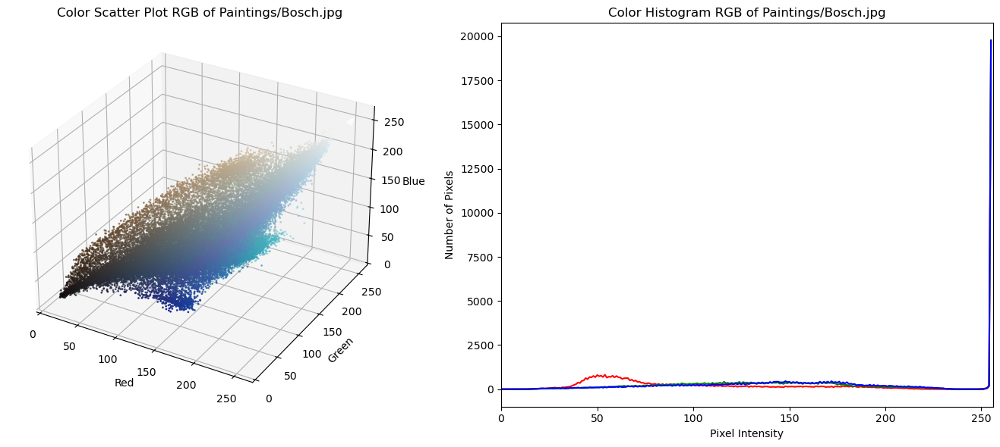

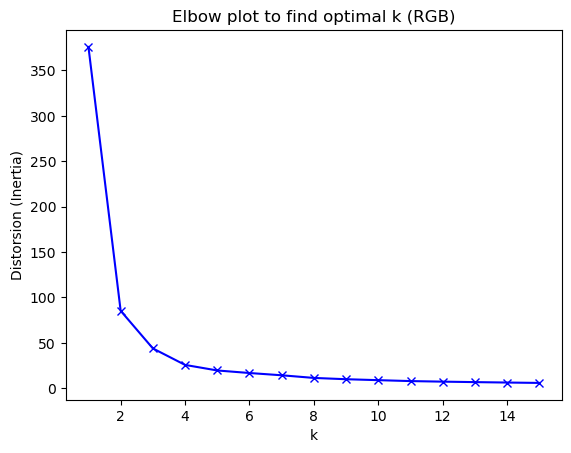

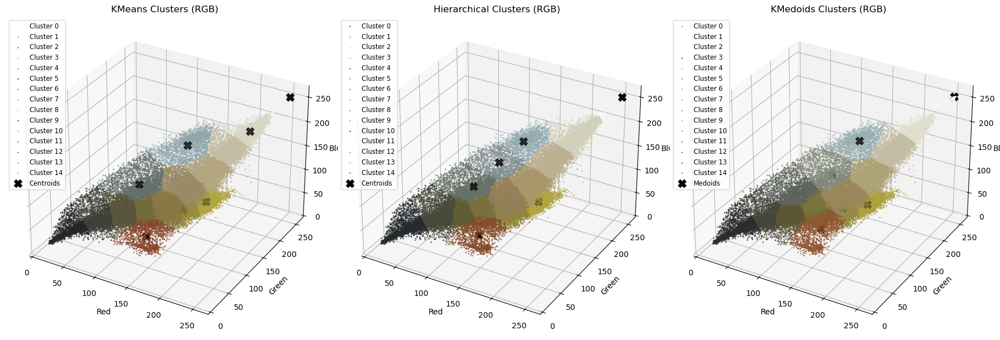

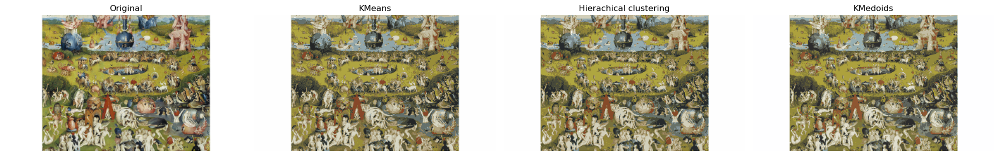


Quality Metrics for Paintings/Bosch.jpg
       Method       MSE      PSNR     SSIM
       KMeans 89.899092 28.593251 0.942915
Agglomerative 91.979592 28.493889 0.942055
     KMedoids 92.947310 28.448435 0.942435


In [ ]:
# ==========================================
#  4.1 De tuin der lusten (Hieronymus Bosch)
# ==========================================

# Call modified process_image and unpack returned values for the first image:
image_name, original, quant_kmeans, quant_hierarchical, quant_kmedoids = process_image(
            image_paths[0],
            metric_method='euclidean',
            use_subsample=True,
            sample_fraction=0.02)

# Calculate metrics and store them:
metrics = calculate_metrics_for_image(original, quant_kmeans, quant_hierarchical, quant_kmedoids, image_name=image_name)
all_metrics[image_name] = metrics

The first illustration corresponds to a point cloud in three-dimensional RGB space in which each point represents a pixel from the original image, and its colour reflects its actual values in the red, green and blue channels. This visualisation makes it possible to analyse the chromatic distribution of the image quantitatively, which is useful from a computational standpoint. Nevertheless, this representation does not necessarily align with human colour perception, because the RGB space is not perceptually uniform; in other words, equal distances in that space do not translate into equally salient visual differences for the human eye.

In this cloud an apparent predominance of bluish hues can be observed. This perception, however, contrasts with direct observation of the painting, where green tones prevail. Such a discrepancy highlights one of the fundamental limitations of RGB space for visual analysis and justifies the choice of colour spaces that are more in tune with human perception in more complex, detailed studies.

The RGB histogram, meanwhile, makes it possible to examine the frequency distributions of the values for each colour channel. In the image under analysis, two principal peaks are evident, suggesting the existence of at least two dominant colour groups in the painting. This hypothesis is reinforced by the elbow plot, which shows an inflection point around two clusters, indicating a theoretically optimal segmentation based on intra-cluster compactness.

However, the presence of a bimodal distribution in the histogram does not guarantee that segmenting the image into two chromatic groups will faithfully represent the painting’s visual richness. Although technically valid, such a drastic reduction of the colour palette would lead to a considerable loss of nuance—especially problematic in artistic images, where subtlety of colour is essential to convey expressiveness. In addition, a certain imbalance towards the red component is observed, which tends to oversaturate the quantised colours in that direction, producing less vivid tones and negatively affecting the overall perception of the image.

Finally, the elbow plot shows how intra-cluster inertia varies with the number of clusters. As anticipated in the histogram analysis, a pronounced elbow is detected around two groups, which would suggest a mathematically optimal solution. In this particular case—and, more generally, in chromatic analysis of artworks—this criterion does not always translate into an adequate visual representation. For that reason, a larger number of clusters (15) was chosen, a more balanced compromise between computational compactness and visual fidelity, thereby allowing a richer, more nuanced reproduction of the original palette.

After applying clustering methods to the colour cloud extracted from the painting, substantial improvements in chromatic representation become evident compared with the original RGB cloud. Once the algorithms have been implemented, the distribution of points and the locations of the centroids show a notable enhancement in visual fidelity, allowing a more accurate reading of the work’s palette.

With the K-means algorithm, the point cloud acquires a more differentiated structure, with well-defined centroids in areas that correspond to colours actually present in the painting. This method is particularly effective at grouping greens and browns, which makes it easier to represent areas such as the vegetative background or shadowed regions. Although bluish tones are still gathered into dense clusters, a subtler distinction can be seen between shades such as greyish blue and deep sky-blue. The presence of some centroids “below” the cloud suggests that the algorithm has identified less-frequent but relevant colours despite their low statistical prevalence.

Hierarchical clustering, for its part, stands out for its ability to separate bluish tones in greater detail, distinguishing even slight variations between cool blue and grey-blue. It is less precise, however, when grouping warm colours: tones such as brown or olive green tend to be absorbed by larger clusters dominated by light greens or terracottas, leading to a loss of perceptual fidelity. Even so, this method enriches the overall representation by introducing centroids in areas of the chromatic space where the RGB model did not allow significant differentiation. K-medoids, meanwhile, offers the most balanced distribution of centroids and a detailed segmentation of various chromatic regions. It identifies not only intermediate colours in the grey and beige scale but also represents warm whites and olive hues with greater precision. Unlike the hierarchical method, this approach shows a clear intention to preserve chromatic diversity, though it is less sensitive to very subtle variations within the same tone. The result is a more uniform representation, albeit one that tends to over-fragment visually similar regions. Notably, this method produces more centroids than the others, enhancing the overall chromatic richness of the segmentation.

The chromatic representation obtained from analysing the colour cloud provides an essential foundation for understanding the results observed in the quantised images generated by the different clustering algorithms. Improvements in colour differentiation achieved by K-means, hierarchical clustering and K-medoids not only optimise the distribution in colour space but also directly influence the visual fidelity of the reconstructions obtained.

After quantisation, the resulting images show versions that, while resembling the original painting, exhibit a general loss of saturation and vibrancy. This decline in chromatic richness is consistent with what is observed in the point cloud: although the algorithms detected a greater variety of colours, limitations inherent to RGB space persist, particularly regarding the representation of warm hues. As noted above, the centroids—although well positioned—cannot fully compensate for the perceptual biases of the RGB model. In particular, the imbalance towards the red channel negatively affects key areas such as skin, where the original pinkish tones turn into pale beiges or even greyish shades. This effect is accentuated in the images quantised by the hierarchical method, which aligns with its lower precision in grouping warm colours such as browns and greens within broad clusters that lose essential nuances. The resulting simplification of the palette produces a duller, less contrasting representation, generating a flatter and less expressive visual atmosphere. Although this method was effective for splitting blue tones in the chromatic cloud, its application to the quantised image creates extensive areas of homogeneous colour, reducing the original work’s detail and textural richness.

By contrast, K-means—which had shown more efficient grouping of greens and browns and a clear differentiation among the various shades of blue—manages to maintain a more coherent tonal structure in the quantised image. Although it too is affected by the general loss of saturation, this method more effectively preserves the segmentation among background, figure and shadowed elements. It is particularly successful in vegetative areas and regions with mid-tone contrast, where the perception of volume and depth is better preserved.

Finally, the K-medoids approach, previously characterised by offering balanced segmentation with a high density of centroids, produces quantised images that better preserve smooth chromatic transitions, such as those present in diffuse backgrounds or clothing. Its main advantage lies in selecting real representatives from the data set, yielding centroids more faithful to the original colours and reducing perceptual artificiality. Nevertheless, this technique also shows some ambiguity at edges and in areas with complex mixtures, as though it tries to preserve chromatic continuity even at the cost of losing definition along contours.

In this analysis, the mean squared error (MSE) results were as follows: K-means with an MSE of 89.90, K-medoids with 92.39 and the hierarchical method with 95.65. These values show that K-means performs best, producing a quantised image with the smallest average deviation from the original. K-medoids follows closely behind, while hierarchical clustering, although it does not exhibit a substantially higher error, shows slightly lower accuracy. It is worth noting that, according to theory, these MSE values—well below the maximum possible value of 65,025—remain relatively low, suggesting that all quantised images retain an acceptable level of similarity to the original. Even so, this metric must be contextualised: MSE, although useful as an objective indicator, does not consider the spatial distribution of error or the image’s structural features. Consequently, errors located in visually important regions may be masked by low averages, limiting the metric’s capacity to reflect human perceptions of visual quality.

Regarding peak signal-to-noise ratio (PSNR), the following values were obtained: 28.59 dB for K-means, 28.47 dB for K-medoids and 28.32 dB for the hierarchical method. As expected, these results are consistent with those obtained for MSE, since PSNR is an inverse function of mean squared error. K-means retains the highest signal-to-noise ratio, followed closely by K-medoids, while hierarchical clustering comes last. However, it should be emphasised that all images show PSNR values below 30 dB, indicating the presence of perceptible distortions. This situation can be attributed to the original painting’s visual and chromatic complexity, where even small alterations introduced by quantisation can result in noticeable losses of visual quality. Despite this, the values lie within a reasonable range for colour-reduction processes, especially given the significant reduction of the original palette.

The structural similarity index (SSIM) provides a more comprehensive and perceptually relevant assessment by considering not only luminance and contrast differences but also image structure. The values obtained were 0.9435 for K-medoids, 0.9429 for K-means and 0.9397 for the hierarchical method. Although the numerical differences are subtle, all reconstructions are close to the ideal value of 1, indicating high structural similarity. While none surpasses the threshold of 0.95— considered in the literature as indicative of very high similarity—the results remain strong. K-medoids stands slightly above the other methods, suggesting better preservation of spatial organisation and visual patterns from the original image.

In short, K-means emerges as the most efficient method from a quantitative perspective, minimising both average error (MSE) and relative distortion (PSNR), evidence of its ability to preserve essential chromatic information faithfully. Nonetheless, its structural performance (SSIM) is only marginally below the best, indicating a slight loss in perceptual continuity of forms and textures. K-medoids presents itself as a solid, balanced alternative: although its MSE and PSNR are slightly higher than those of K-means, it achieves the highest SSIM, making it the most robust method in terms of structural preservation—a quality particularly valuable when visual coherence is prioritised over strict numerical error reduction. Finally, the hierarchical method shows the lowest performance across the three metrics, pointing to a more pronounced overall loss of visual fidelity. Although it cannot be deemed inefficient, its results suggest that it is less suitable for tasks requiring a high degree of visual correspondence with the original image.


#### **4.2 *Nascita di Venere* by Sandro Botticelli**
<p style='text-align: right'> 1485 | Located in Le Gallerie Degli Uffizi, Florence </p>

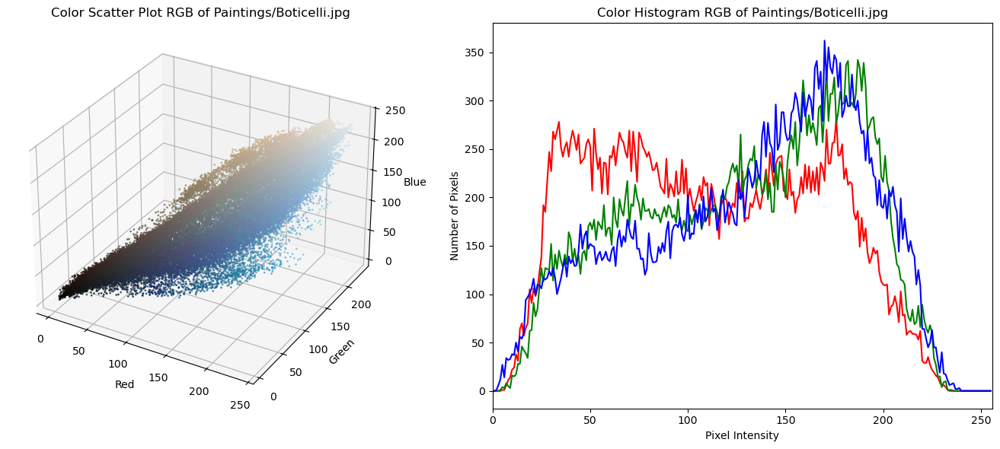

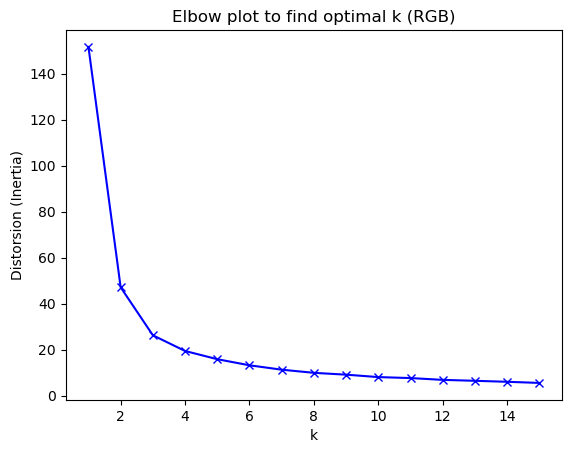

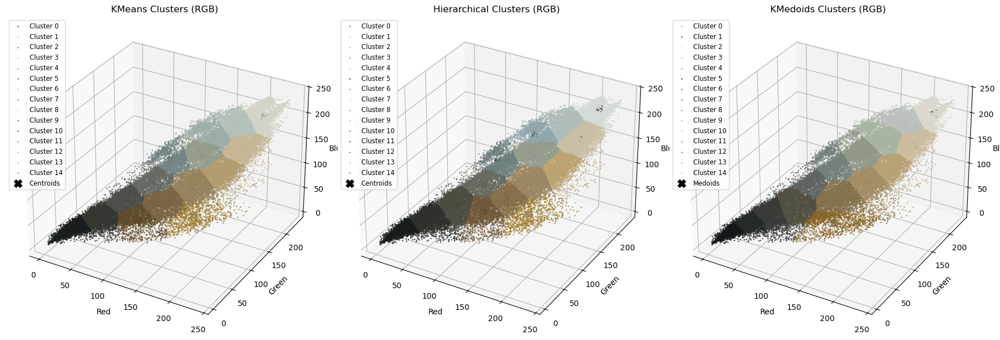

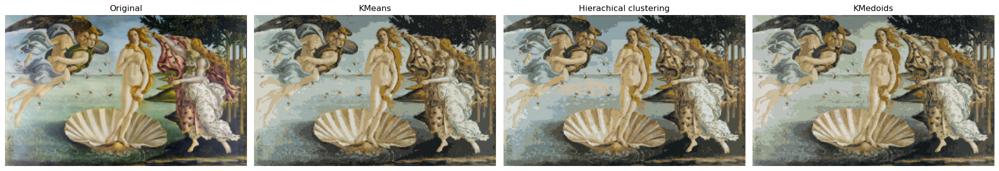


Quality Metrics for Paintings/Boticelli.jpg
       Method        MSE      PSNR     SSIM
       KMeans 115.872111 27.491014 0.878367
Agglomerative 126.058553 27.125080 0.862101
     KMedoids 130.623787 26.970581 0.877189


In [ ]:
# ==========================================
#  4.2 Nascita di Venere (Sandro Botticelli)
# ==========================================

# Call modified process_image and unpack returned values for the second image:
image_name, original, quant_kmeans, quant_hierarchical, quant_kmedoids = process_image(
            image_paths[1],
            metric_method='euclidean',
            use_subsample=True,
            sample_fraction=0.02)

# Calculate metrics and store them
metrics = calculate_metrics_for_image(original, quant_kmeans, quant_hierarchical, quant_kmedoids, image_name=image_name)
all_metrics[image_name] = metrics

The three-dimensional visualisation of the painting’s colours in RGB space reveals a pronounced presence of blues and browns, corresponding to the sky and sea as well as to the skin tones and hair of the figures. This chromatic pattern evidences a warm, harmonious palette with a notable contrast between the marine background and the human, floral and textile elements. Visually, the point cloud concentrates on a plane dominated by low red and green combinations and higher values in the blue channel.

Histogram analysis shows four principal peaks distributed across the three channels—two in red, one in blue and one in green—suggesting a segmentation of the image into distinct chromatic regions. In the red channel, a prominent peak between intensities 25 and 120 indicates the presence of dark, warm tones associated with shadows, contours and elements such as hair or background. Within that range, the green and blue channels register significantly lower values, reinforcing red’s predominance in the darker areas.
From approximately intensity 120 to 170, the green and blue channels rise progressively while red begins to decline. Around intensity 170 the three channels reach a relative equilibrium, coinciding with a second red peak. This zone can be interpreted as a chromatic balance point—likely corresponding to areas of diffuse light such as fair skin and illuminated marine zones—suggesting a harmonious blend in parts of the composition.

These four channel peaks align with the elbow-method outcome, which indicated that four clusters would suffice to represent the image’s chromatic diversity. Even so, segmentation into fifteen clusters was retained to ensure uniform comparison among different works and to capture greater granularity in colour dispersion and grouping in visually complex compositions such as this.

Quantisation results using clustering techniques reveal significant differences in colour segmentation. In the three-dimensional plots, the centroids appear located visually in ‘background’ zones of the data cloud because, as averages of their groups, they often correspond to areas of lower visual density or to less-extreme colour combinations, making them less conspicuous in the graphical foreground.

In terms of chromatic division, K-medoids affords more detailed segmentation, particularly in the transition zones between skin and background. This method shows greater sensitivity to subtle tones, preserving delicate textures such as the faint shadows on Venus’s body or the details in the garments. K-means, by contrast, tends to emphasise segmentation in blues and greys, achieving clear differentiation within these cool colours characteristic of sky and sea; it also introduces a brown variation with more yellowish nuances. The hierarchical method, based on RGB agglomeration, stands out for sharper segmentation in the brown range, enabling more precise differentiation of
elements such as hair, branches and fabric—especially in the figures at the painting’s right and left edges.

K-means records the lowest mean squared error (MSE) and the highest PSNR value, indicating closest proximity to the original image in pixel intensity terms. It should be noted, however, that the PSNR value—though highest among the methods compared—still falls below the 30 dB threshold. This is attributable to the original image’s high level of detail, which renders any quantisation-induced distortion more perceptible.

Regarding the structural similarity index (SSIM), which evaluates structural and perceptual aspects, K-means again leads, though with only a marginal advantage over K-medoids. Both methods perform well in preserving the work’s visual structure, whereas the hierarchical method registers the lowest values across all metrics—albeit without drastic deviations.

Taken together, the numerical results support the earlier qualitative observations. K-means provides the most faithful reconstruction according to objective metrics, whereas K-medoids proves particularly adept at perceptual segmentation of intermediate, diffuse zones. Hierarchical clustering, for its part, demonstrates utility in differentiating specific tonalities, such as browns. These findings confirm the value of a multi-technique analysis for addressing the chromatic complexity of classical works from both computational and visual perspectives.


#### **4.3 *The Persistance of Memory* by Salvador Dali**
<p style='text-align: right'> 1931 | Located in MoMA, New York </p>

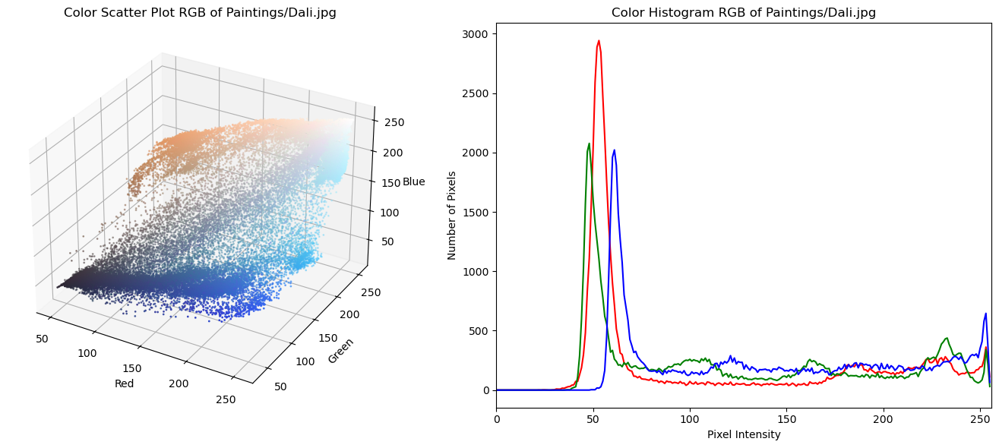

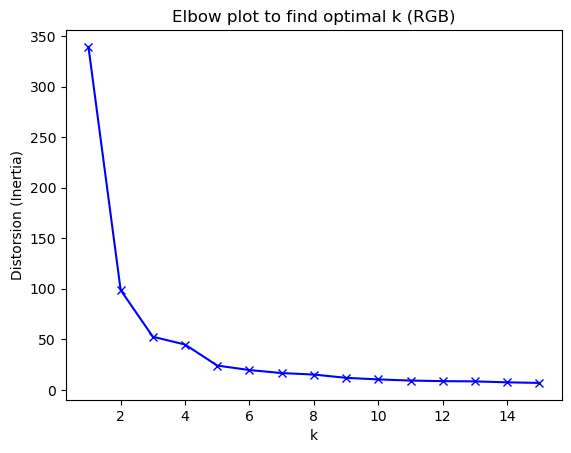

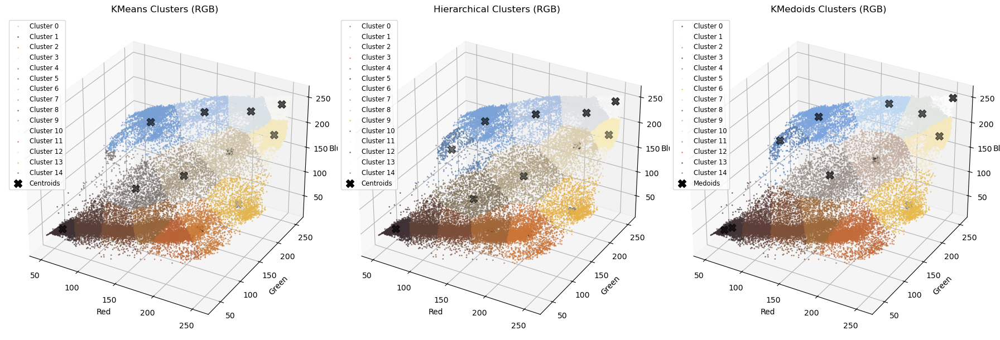

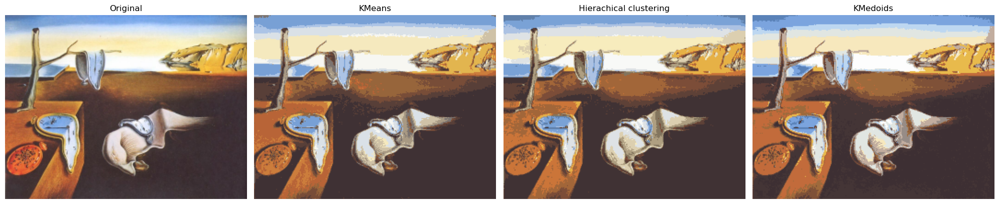


Quality Metrics for Paintings/Dali.jpg
       Method        MSE      PSNR     SSIM
       KMeans 103.083352 27.998918 0.858980
Agglomerative 105.768479 27.887241 0.856691
     KMedoids 115.384575 27.509326 0.856492


In [ ]:
# ==============================================
#  4.3 The Persistence of Memory (Salvador Dali)
# ==============================================

# Call modified process_image and unpack returned values for the third image:
image_name, original, quant_kmeans, quant_hierarchical, quant_kmedoids = process_image(
            image_paths[2],
            metric_method='euclidean',
            use_subsample=True,
            sample_fraction=0.02)

# Calculate metrics and store them
metrics = calculate_metrics_for_image(original, quant_kmeans, quant_hierarchical, quant_kmedoids, image_name=image_name)
all_metrics[image_name] = metrics

The colour analysis of The Persistence of Memory in RGB space reveals a markedly more complex chromatic differentiation than that of the previous work. The point cloud in this three dimensional space is far more dispersed and intricate, indicating a broad range of tones. Terracotta hues stand out, along with very light blues such as cyan, and extensive transitions that run from deep blues to extremely pale shades. This visual diversity reflects the composition’s richness, where warm elements in the foreground—such as the melting clocks and the brown platform—contrast with a sky that fades gently from whites and yellows into intense blues.

The histogram reinforces this observation, displaying three clearly defined peaks within the intensity interval of roughly forty to seventy. First, the green channel shows a pronounced peak of about two thousand pixels; the green values then fall while the red channel rises sharply to almost three thousand pixels. This shift appears to match the terracotta areas and the orange reflections in the foreground. The red channel then falls, and the blue channel rises to around two thousand pixels, making evident the strong presence of cyan and light blue tones in the upper part of the painting. Beyond these peaks the three channels level off, with red remaining at lower levels. This sequence suggests a chromatic organisation in three dominant blocks, which aligns with the elbow method’s recommendation to segment into three clusters. To obtain a more detailed representation and maintain homogeneous comparison with the other works, a segmentation of fifteen clusters was retained.

Clustering segmentation confirms these distinctions. The hierarchical method, although able to capture general tonalities, tends to over group brown shades, producing a noticeable loss of nuance in areas such as the ground and the clocks. In the three dimensional representation many centroids appear below the point cloud, indicating that this technique often synthesises colours into averages that do not fully reflect the tonal richness of the original image. K means, on the other hand, offers a more balanced and coherent segmentation, clearly differentiating orange, brown and blue tones, which translates into greater visual clarity in the transitions between light and shadow. Its cluster cloud shows better centroid distribution, consistent with its quantitative performance.

K medoids excels in preserving chromatic transitions, especially in regions with gentle gradients such as the sky. Its reconstruction displays subtle differences among various shades of blue, pointing to a richer and more detailed visual representation. Although its numerical values for mean squared error and peak signal to noise ratio are not the best among the methods evaluated, its performance in the structural similarity index remains competitive, indicating that it adequately preserves the overall perception of the image.

Quantitatively, K means achieves the strongest results, with the lowest error, the highest signal to noise ratio and the top structural similarity score, supporting its overall performance in both numerical precision and visual coherence. Although K medoids shows a slight increase in error and a marginal drop in the other metrics, its faithfulness in representing visual details makes it a solid option when perceptual richness is prioritised. The hierarchical approach, useful for a general segmentation, records the weakest indicators across the three metrics, confirming that its tendency to oversimplify colour groups negatively affects reconstruction quality.

#### **4.4 *Nymphéas* by Claude Monet**
<p style='text-align: right'> 1915 | Located in Neue Pinakothek, Munich </p>

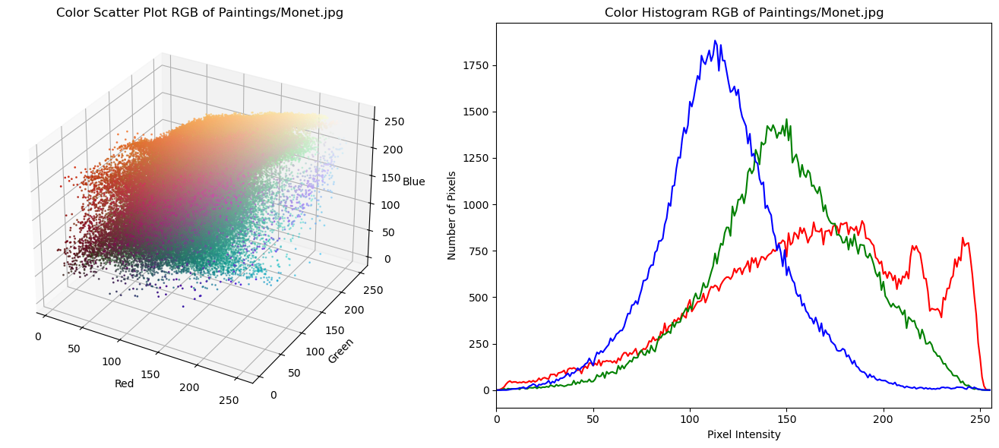

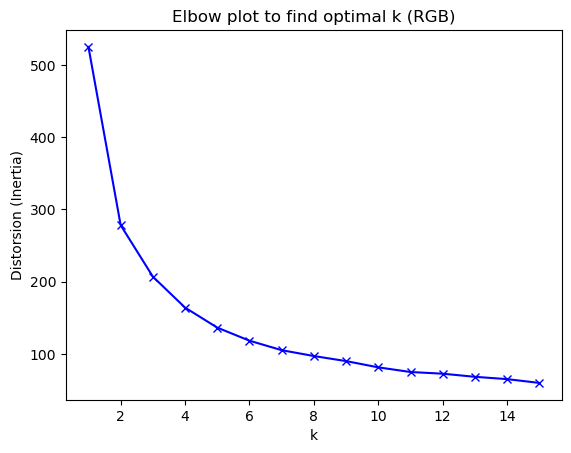

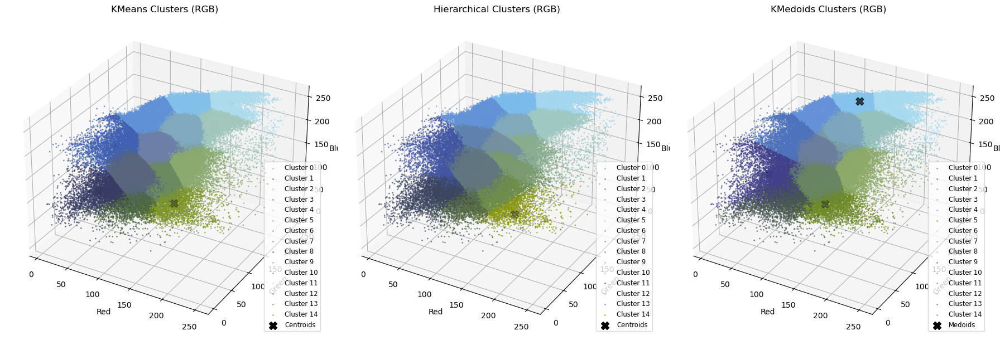

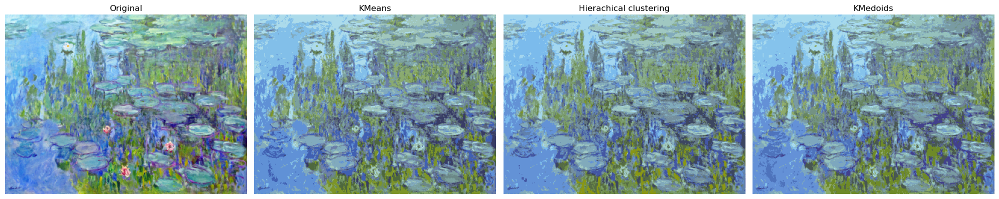


Quality Metrics for Paintings/Monet.jpg
       Method        MSE      PSNR     SSIM
       KMeans 197.866021 25.167091 0.791163
Agglomerative 209.554583 24.917832 0.787868
     KMedoids 208.112240 24.947827 0.789602


In [ ]:
# ============================
#  4.4 Nymphéas (Claude Monet)
# ============================

# Call modified process_image and unpack returned values for the fourth image:
image_name, original, quant_kmeans, quant_hierarchical, quant_kmedoids = process_image(
            image_paths[3],
            metric_method='euclidean',
            use_subsample=True,
            sample_fraction=0.05, red_weight=1.0)

# Calculate metrics and store them
metrics = calculate_metrics_for_image(original, quant_kmeans, quant_hierarchical, quant_kmedoids, image_name=image_name)
all_metrics[image_name] = metrics

The chromatic distribution in RGB space for Claude Monet’s Nymphéas reveals tonal richness marked by soft, diffuse colours characteristic of the artist’s impressionist style. The point cloud in three-dimensional space shows notable dispersion that spans light, mid and dark shades of green, pink, orange and purple. This chromatic variety appears as a more scattered, less structured cloud than in other works analysed, consistent with Monet’s loose brushwork and optical blending.

The RGB histograms reinforce this observation. Five principal peaks reflect the painting’s chromatic complexity. The blue channel dominates at first, with an intense peak around intensity 100 exceeding 1,750 pixels, probably associated with aquatic areas and bluish reflections. The green channel then rises at intensity 150, reaching roughly 1,500 pixels, likely linked to the vegetation. The red channel, though less dominant, shows three significant peaks: one near intensity 180 at about 800 pixels and two more at intensities 220 and 240, each around 750 pixels, corresponding to warm reflections, petals and floral details typical of this series. Although the elbow method suggests a natural grouping into 5 clusters, segmentation into 15 clusters was retained for comparison with other works and to allow a more detailed analysis of subtle colour transitions.

Segmentation by K-means shows certain limitations. In particular, this method fails to differentiate clearly among the various blue tones, sacrificing important nuances in the treatment of water and sky. It does, however, provide stronger representation of dark greens, preserving areas of vegetal shadow and depth. This tendency is evident in the cluster cloud, where the sole visible centroid lies in a region corresponding to green shades with low blue content.

The hierarchical method, by contrast, offers segmentation that succeeds in distinguishing blue tones, including subtle variations of dark blue, but it underrepresents dark greens, which can affect the perception of dense foliage. As with K-means, only one visible centroid appears, also located in the green zone, though in a position that suggests broader generalisation of tones. In the reconstructed image, the flowers lose definition, probably because the clustering process assigns little weight to the red channel.

K-medoids provides the most balanced outcome. Its three-dimensional representation shows a more uniform cluster distribution and features two clearly visible medoids, one in the light blue domain and another in the green region. This configuration affords better representation of both cool tones in the sky and water and vegetal nuances. As a result, segmentation more faithfully preserves the soft contrasts and tonal transitions that characterise the painting. Although a loss of floral definition persists because of the red channel’s secondary role, the reconstruction maintains the diffuse, immersive atmosphere of the original.

Despite these specific differences, overall behaviour across the three methods is not markedly divergent. All capture the painting’s chromatic structure with reasonable efficacy, and variations among them reflect nuances rather than categorical breaks. This suggests that while each technique has noteworthy aspects, their global results converge on a reconstruction coherent with the work’s original aesthetic.

Regarding quantitative metrics, K-means delivers the best overall performance, with the lowest mean squared error of 197.87, a peak signal-to-noise ratio of 25.17 decibels and a structural similarity index of 0.791. These values indicate a reconstruction closer to the original in numerical and structural terms. K-medoids, with a mean squared error of 208.11, a peak signal-to-noise ratio of 24.95 and a structural similarity index of 0.790, performs comparably, especially in visual perception. The hierarchical method ranks slightly lower with the least favourable values across the three metrics: mean squared error of 209.55, peak signal-to-noise ratio of 24.92 and structural similarity index of 0.788, confirming its tendency to oversimplify certain areas.

### **4.5 *Les Demoiselles d'Avignon* by Pablo Picasso**
<p style='text-align: right'> 1907 | Located in MoMA, New York </p>


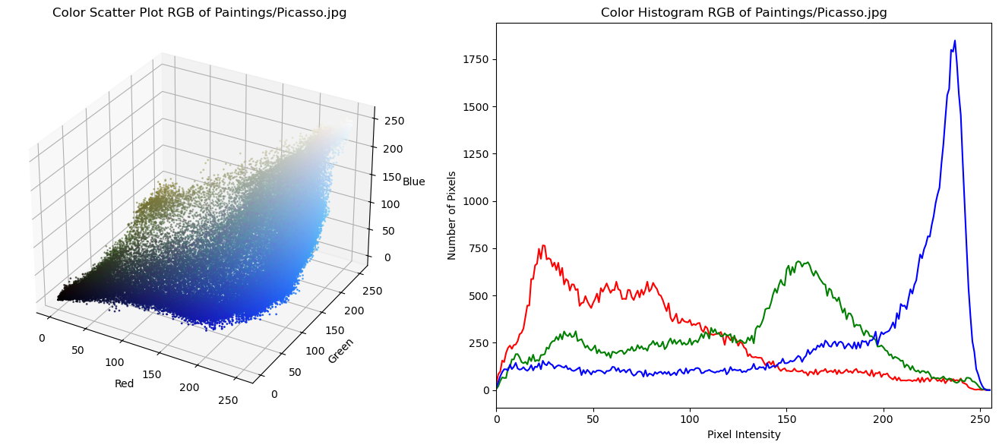

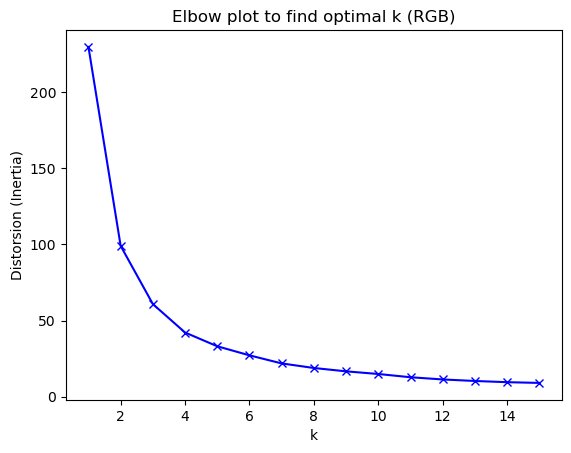

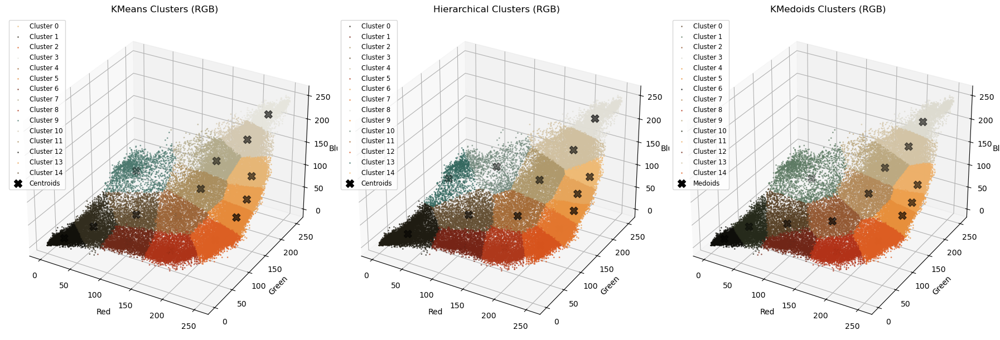

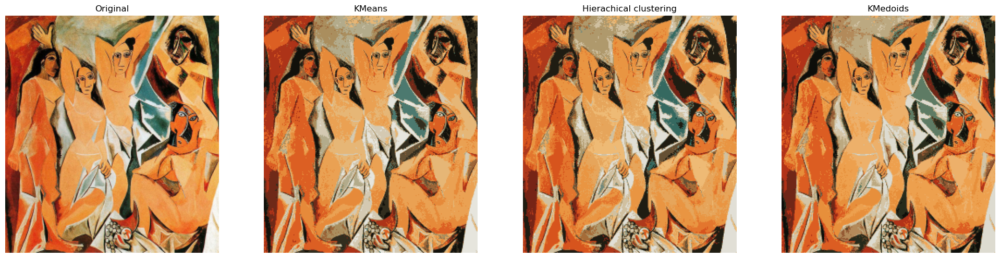


Quality Metrics for Paintings/Picasso.jpg
       Method        MSE      PSNR     SSIM
       KMeans 146.142037 26.483052 0.847558
Agglomerative 166.805772 25.908693 0.843018
     KMedoids 160.212040 26.083852 0.850463


In [ ]:
# ==============================================
#  4.5 Les Demoiselles d'Avignon (Pablo Picasso)
# ==============================================

# Call modified process_image and unpack returned values for the fifth image:

image_name, original, quant_kmeans, quant_hierarchical, quant_kmedoids = process_image(
            image_paths[4],
            metric_method='euclidean',
            use_subsample=True,
            sample_fraction=0.02)

# Calculate metrics and store them
metrics = calculate_metrics_for_image(original, quant_kmeans, quant_hierarchical, quant_kmedoids, image_name=image_name)
all_metrics[image_name] = metrics

In Les Demoiselles d’Avignon the RGB colour cloud displays considerable dispersion in the region corresponding to blue tones, with smaller groupings in the green and brown areas. This distribution can be attributed both to the intrinsic characteristics of RGB space and to the predominance of the red channel, which strongly influences the composition’s overall chromatic perception. The colour histogram reveals roughly five well-defined peaks: three associated with the red channel, one with the blue channel—the most pronounced—and one with the green channel. This observation accords with the elbow plot, which points toward a natural tendency to form five chromatic clusters. To maintain methodological coherence across the analysis, however, the number of clusters was kept at fifteen.

In the three dimensional RGB representation produced by the K means algorithm, the centroids are arranged along an arc that faithfully reflects the work’s chromatic transition: from the dark earthy background tones through an intermediate band of ochres and peach tones representing skin to the blue-green shades of the drapery. The method places several centroids in high-density colour regions, enabling more precise segmentation of skin tones, but this leads to scant representation of less frequent colours, such as turquoise or deep black. Even so, K means achieves a smooth, continuous rendering of the main areas, maintaining an appropriate balance between warm and cool colours.

The hierarchical method, by contrast, generates a more irregular cluster distribution because of its distance-based grouping criterion. Consequently, several centroids lie at the chromatic spectrum’s extremes: one captures browns and blacks, while another focuses on the lightest peach tones. This polarised distribution restricts representation of intermediate colours, affecting blue-green hues in particular. In the quantised image this yields heightened contrast and sharper contours, producing a visual effect akin to posterisation. The transformation entails the loss of gentle gradients and subtle transitions, especially in the drapery and figures, reducing the image’s natural quality.

K medoids offers a more balanced outcome. Because real pixels serve as representatives of each group, the medoids lie within chromatic regions and generate more precise colour boundaries. This approach preserves infrequent yet visually relevant tones, such as emerald green or the dark shades in the faces. The resulting image retains local nuances more faithfully, particularly in areas like limbs or garment folds, preventing the unwanted merging that often appears with K means. Its principal limitation lies in rendering intense highlights: without averaging colours, whites tend to be replaced by similar pixels, which can slightly diminish overall brightness.

Quantitatively, K means performs solidly, with an MSE of 146.14, a PSNR of 26.48 and an SSIM of 0.847. K medoids edges ahead in the structural metric with an SSIM of 0.850, although it records a higher MSE of 160.21 and a slightly lower PSNR of 26.08, reflecting its capacity to preserve local detail at the cost of a modest increase in global error. The hierarchical method posts the least favourable values: an MSE of 166.80, a PSNR of 25.91 and an SSIM of 0.843, confirming its greater impact on gradients and textures.


#### **4.6 *De sterrennacht* by Vincent Van Gogh**
<p style='text-align: right'> 1889 | Located in MoMA, New York </p>

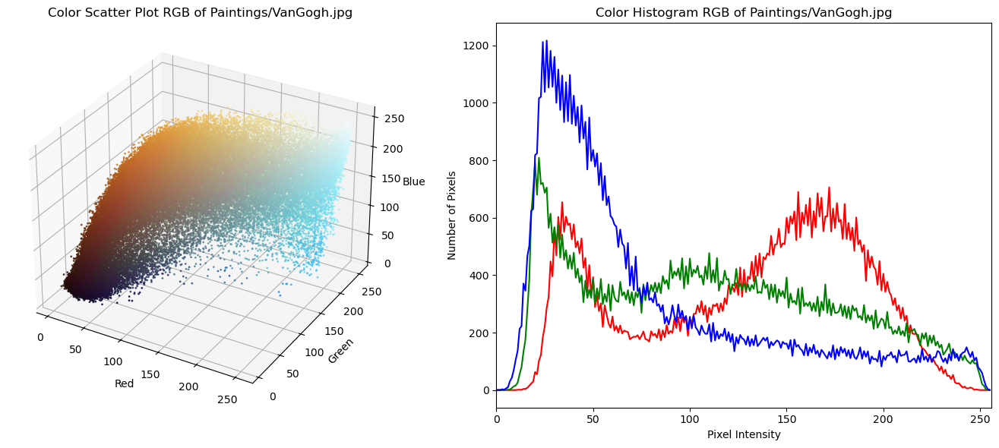

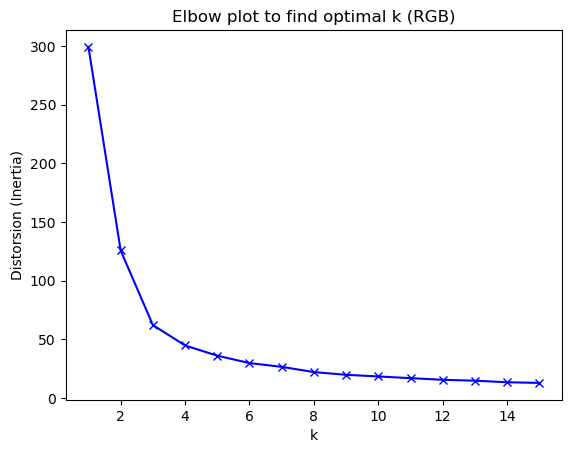

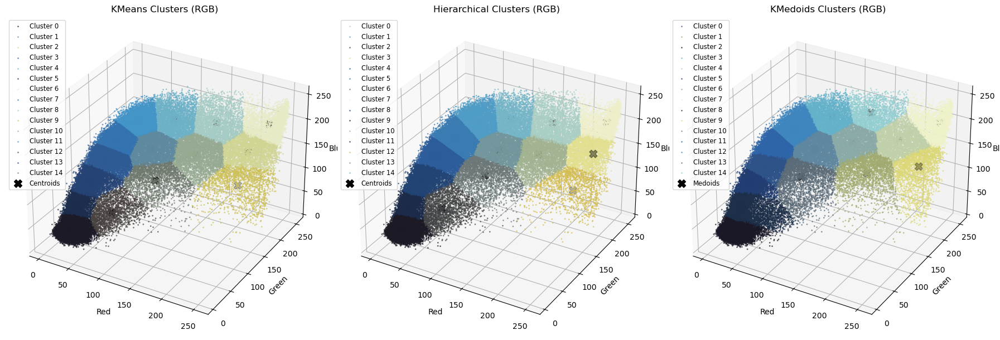

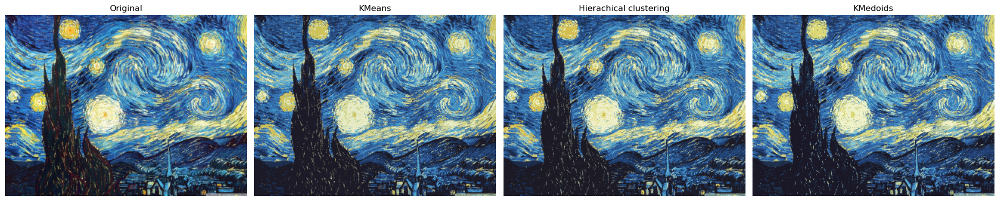


Quality Metrics for Paintings/VanGogh.jpg
       Method        MSE      PSNR     SSIM
       KMeans 160.228958 26.083394 0.886102
Agglomerative 166.566814 25.914919 0.882577
     KMedoids 174.700681 25.707858 0.875393


In [ ]:
# =======================================
#  4.6 De sterrennacht (Vincent van Gogh)
# =======================================

# Call modified process_image and unpack returned values for the sixth image:
image_name, original, quant_kmeans, quant_hierarchical, quant_kmedoids = process_image(
            image_paths[5],
            metric_method='euclidean',
            use_subsample=True,
            sample_fraction=0.02)

# Calculate metrics and store them
metrics = calculate_metrics_for_image(original, quant_kmeans, quant_hierarchical, quant_kmedoids, image_name=image_name)
all_metrics[image_name] = metrics

In The Starry Night the RGB colour cloud is dominated by orange, purple and a broad spectrum of blues ranging from very light to intensely dark. The colour histogram displays five well-defined peaks—two in the red channel, two in green and one in blue—which aligns with the elbow-plot analysis suggesting a naturally organised structure of five clusters.

Using the K means algorithm, the centroids lie along a curve that traverses RGB space from deep blues to pale yellows. Most are concentrated in the mid-blue band, allowing smooth transitions within the sky’s swirling forms and avoiding abrupt breaks. Bright zones such as the stars’ white-yellow cores, however, are simplified to only a few shades, diminishing some of their original luminosity. Even so, the overall perception of the landscape remains intact.

Hierarchical clustering assigns its groups mainly to navy blues and light yellows, leaving intermediate tones under-represented. This heightens local contrast: brushstrokes appear sharper, transitions more abrupt, and elements such as the cypress and horizon gain dramatic emphasis. The cost is a loss of subtle gradients, especially in the sky, where more segmented bands emerge.
With K medoids, each group’s representative is an actual image colour, which helps preserve less frequent shades such as the greyish blues in the background and the blue-greens around certain stars. In the quantised image the yellow halos show more realistic variation and luminance remains more organic. Yet dominant blues become somewhat fragmented, introducing slight speckling where the original showed uniformity.

Overall, all three methods successfully reproduce the painting’s essential duality of colour. The most evident differences lie in gradient fidelity and stroke representation. K means delivers the smoothest tonal transitions across large blue areas while simplifying bright highlights. K medoids excels at retaining realistic variations in the yellow accents but introduces some granularity into deep blues. Hierarchical clustering, by favouring chromatic extremes, sharpens contours and brushstrokes yet posterises the sky most strongly. In visual fidelity K means and K medoids remain closer to the original, whereas the hierarchical method diverges more owing to its pronounced segmentation of mid tones.

Regarding quality metrics, K means records an MSE of 160.23, a PSNR of 26.08 dB and an SSIM of 0.886, reflecting a solid balance between global error and structural preservation. The hierarchical method achieves an MSE of 166.57, a PSNR of 25.91 dB and an SSIM of 0.883, confirming its impact on gradients while largely maintaining overall structure. Finally, K medoids, though posting the highest MSE (174.70) and the lowest PSNR (25.71 dB), attains an acceptable SSIM of 0.875, supporting its ability to preserve local chromatic details at the cost of a modest increase in global error. Considering the combined quantitative metrics and perceived visual quality, K means emerges as the most effective algorithm for quantising The Starry Night, offering a balanced representation that respects both the sky’s gentle tonal transitions and the painting’s overall structural integrity.

#### **4.7 *Las Meninas* by Diego Velázquez**
<p style='text-align: right'> 1656 | Located in Museo del Prado, Madrid </p>

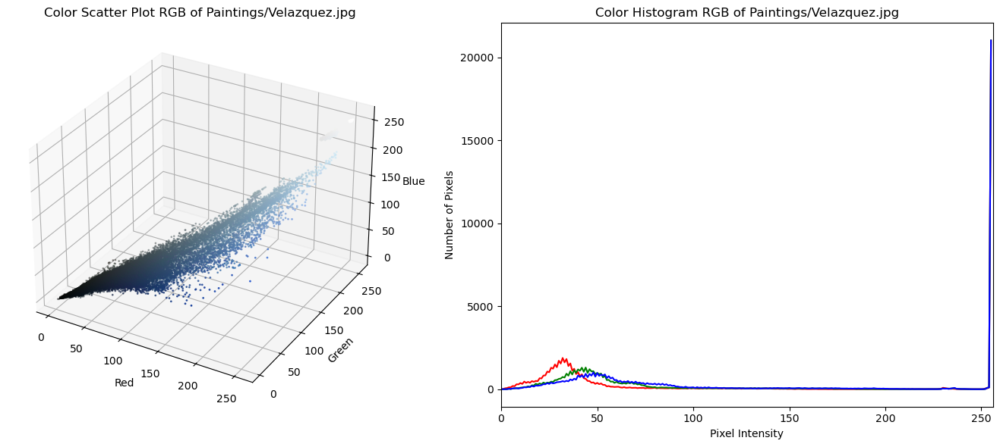

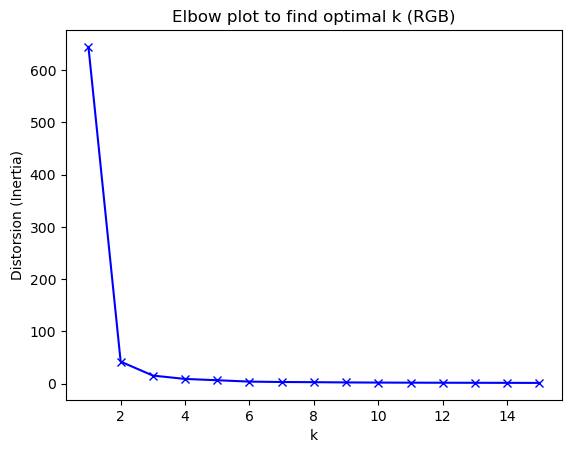

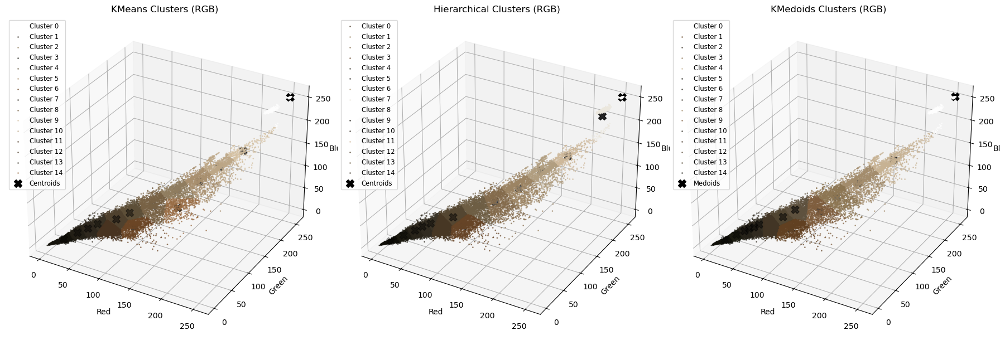

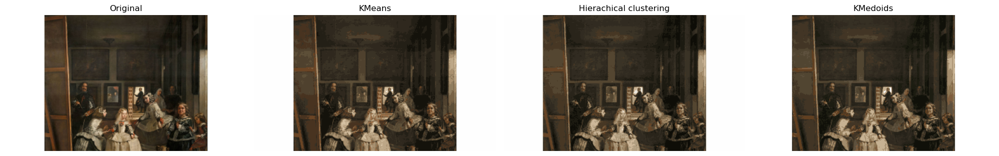


Quality Metrics for Paintings/Velazquez.jpg
       Method       MSE      PSNR     SSIM
       KMeans 22.623086 34.585285 0.943632
Agglomerative 22.183024 34.670596 0.951574
     KMedoids 25.095586 34.134830 0.955299


In [ ]:
# ==================================
#  4.7 Las Meninas (Diego Velazquez)
# ==================================

# Call modified process_image and unpack returned values for the seventh image:

image_name, original, quant_kmeans, quant_hierarchical, quant_kmedoids = process_image(
            image_paths[6],
            metric_method='euclidean',
            use_subsample=True,
            sample_fraction=0.02)

# Calculate metrics and store them
metrics = calculate_metrics_for_image(original, quant_kmeans, quant_hierarchical, quant_kmedoids, image_name=image_name)
all_metrics[image_name] = metrics

In Las Meninas the RGB point cloud lies almost entirely along the RGB diagonal, corresponding to a muted, restricted palette dominated by earth tones, greys and whites. A slight bias toward the red channel reflects the warm browns present in garments, furnishings and shadows. This tightly contained distribution also appears in the histogram, which shows three peaks—red, green and blue—between intensities 25 and 50 with fewer than 2 500 pixels, and a fourth, higher blue peak above intensity 250 with more than 20 000 pixels, associated with the cool reflections of the mirror and background.

K means allocates its centroids evenly along this diagonal, focusing on the mid-tones that comprise the clothed figures and walls and reserving only two extremities for highlights and deep shadows. The resulting quantisation is well balanced: chiaroscuro remains recognisable in the faces and in the infanta, and transitions stay smooth even at edges such as the canvas frame or the distant doorway. Nevertheless, textures in dark areas such as the ceiling simplify and lose impasto depth.

Hierarchical clustering, by contrast, accentuates tonal extremes, placing several centroids in deep blacks and dirty whites while compressing the mid-range. This bias increases contrast and sharpens pleats, frames and architectural elements but introduces more abrupt transitions that step across the floor and ceiling. The final effect emphasises spatial depth and structure at the expense of volumetric softness.

K medoids positions its representatives at actual image values, preserving the reddish browns of the easel and the toasted hues of the left-hand menina’s dress with greater fidelity. Small tonal variations, especially in faces and the dog, remain intact, avoiding the flat patches that can appear with K means. Its drawback lies in luminous zones, where whites are quantised to less-pure values, so reflections—such as the mirror—appear slightly subdued.

Quality metrics confirm these impressions. K means offers a good overall balance (MSE 22.62, SSIM 0.9436); the hierarchical method improves structural similarity (SSIM 0.9516) at the price of higher contrast; and K medoids, despite a slightly higher error (MSE 25.10), achieves the highest fidelity in fine details (SSIM 0.9553). Given the painting’s limited palette, differences among methods are subtle, yet the hierarchical approach stands out for enhancing edges and spatial structure without diverging drastically from the original image.


#### **4.8 *Meisje met de parel* by Johannes Vermeer**
<p style='text-align: right'> 1665 | Located in Rijksmuseum, Maruitshuis </p>

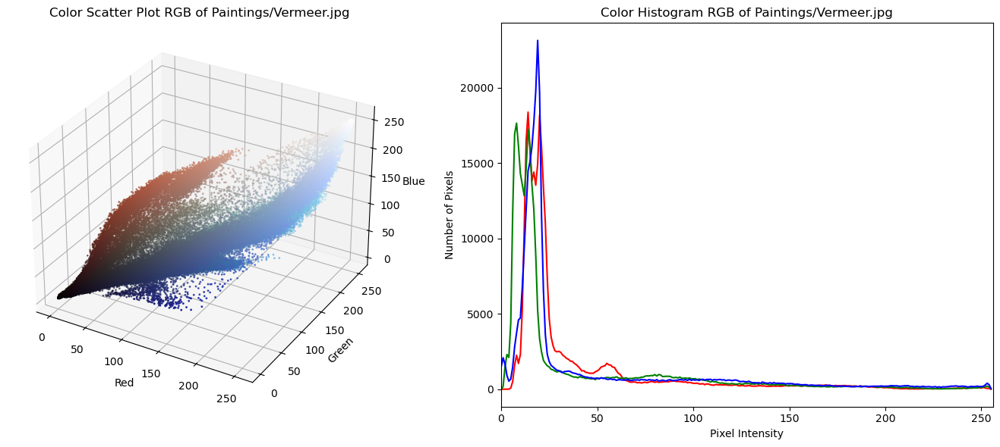

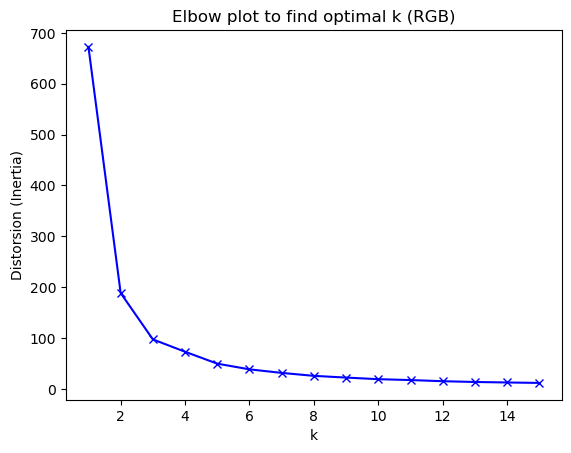

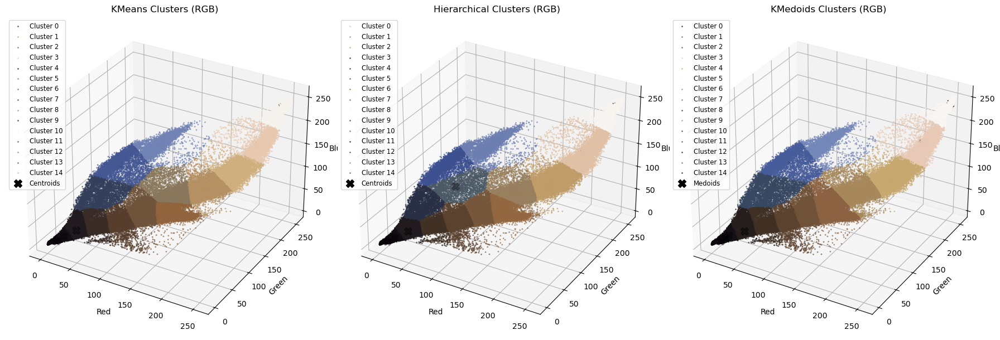

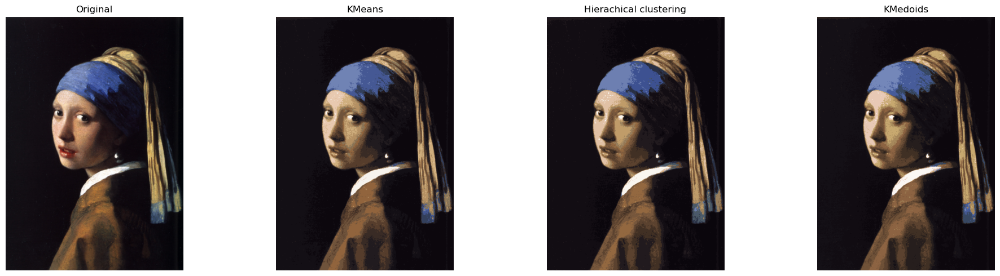


Quality Metrics for Paintings/Vermeer.jpg
       Method       MSE      PSNR     SSIM
       KMeans 41.953559 31.903116 0.896396
Agglomerative 45.302579 31.569574 0.889874
     KMedoids 45.663621 31.535100 0.905079


In [ ]:
# ===========================================
#  4.8 Meisje met de parel (Johannes Vermeer)
# ===========================================

# Call modified process_image and unpack returned values for the eighth image:
image_name, original, quant_kmeans, quant_hierarchical, quant_kmedoids = process_image(
            image_paths[7],
            metric_method='euclidean',
            use_subsample=True,
            sample_fraction=0.02)

# Calculate metrics and store them
metrics = calculate_metrics_for_image(original, quant_kmeans, quant_hierarchical, quant_kmedoids, image_name=image_name)
all_metrics[image_name] = metrics

Analysis of Girl with a Pearl Earring shows the RGB point cloud arranged in two broad wings that rise from absolute black toward reddish-brown and blue-violet tones. These correspond, respectively, to the face, skin and coat on one side and to the turbant and bluish background on the other. The histogram reinforces this structure with several significant peaks below intensity 50, featuring a strong concentration in the blue channel—linked to the background and headscarf—and smaller rises in red and green that mark the figure’s warm tones.

The K means algorithm achieves a balanced segmentation, distributing centroids across the major chromatic regions. It captures the dark tones of background and coat as well as mid-range hues that model the face. The essential blue range appears clearly, distinguishing the scarf’s saturated blue, its deep shadows and its softer highlights. The outcome is a natural quantisation in which the face’s volume remains intact and the pearl retains its characteristic lustre, though some subtleties in the scarf’s folds merge into more uniform blocks.

Hierarchical clustering, by prioritising data density, concentrates representation in the darkest zones of the cloud, leaving less latitude for intermediate hues. This tendency reduces modulation in areas such as the skin, generating sharper contrasts on features like cheekbones and coat. Even so, it enhances the painting’s chiaroscuro: the face stands out more dramatically against the background, and the scarf acquires a graphic character with defined edges and marked tonal transitions.

K medoids, by employing real pixels as representatives, offers high chromatic fidelity. The scarf’s blue appears convincingly nuanced, recovering some of the textile richness that other methods simplify. It also reproduces the warm gradations of the face with greater accuracy, maintaining the light-to-shadow transition through patches that respect the original structure. Its main weakness emerges in the purest whites: because no perfectly white value is selected, the pearl and collar take on a light ochre that lessens their brightness.

From a quantitative standpoint, all three methods perform strongly. K means provides the best general balance with an MSE of 41.95 and an SSIM of 0.8964. K medoids excels in preserving chromatic nuances, achieving an SSIM of 0.9051. The hierarchical method, though slightly lower with an SSIM of 0.8899, produces a high-contrast image that heightens the work’s drama. Overall, the composition remains recognisable in every case, yet K means and K medoids preserve the original’s tonal delicacy and richness more effectively.

### **5. Comparison of the error quantization for all images**

In this section, the results for all the studied quantization error metrics for each image are displayed and discussed in detail:

In [ ]:
# =======================================================
#  5. Comparison of the error quantization for all images
# =======================================================

# Print summary of metrics for all images:
df = pd.DataFrame(all_metrics).T          # Transpose so images are rows
df.index.name = "Image"
print("\n Summary of Metrics:\n")
print(df.to_string(float_format="%.2f"))  # Format numbers to 2 decimal places


 Summary of Metrics:

                                                    Method                                                           MSE                                                          PSNR                                                          SSIM
Image                                                                                                                                                                                                                                               
Paintings/Bosch.jpg      [KMeans, Agglomerative, KMedoids]      [89.89909213130107, 91.9795918367347, 92.94731038233206]  [28.593250549451056, 28.493888828254462, 28.448435337638863]    [0.942914830821787, 0.9420551532277742, 0.942435463885468]
Paintings/Boticelli.jpg  [KMeans, Agglomerative, KMedoids]  [115.87211100260417, 126.05855305989583, 130.62378743489583]    [27.49101441687467, 27.12508043019686, 26.970580888981623]  [0.8783668610122805, 0.8621010701405942, 0.877189404247716

#### **5.1 Analysis of the quantization error results**
Based on the evaluation of the image quantization results using the metrics MSE (Mean Squared Error), PSNR (Peak Signal-to-Noise Ratio), and SSIM (Structural Similarity Index), the image Velazquez.jpg stands out as the best quantized image across all criteria. It consistently achieved the lowest MSE values, ranging from 22.18 to 25.10, indicating minimal pixel-wise error between the original and quantized images. Correspondingly, it recorded the highest PSNR values, up to 34.67 dB, signifying a high-fidelity reconstruction. Most importantly, it demonstrated the highest SSIM values, reaching 0.955, reflecting excellent preservation of structural and perceptual quality. This consistent performance across all three clustering methods (KMeans, Agglomerative, and KMedoids) confirms that the Velazquez image maintained both color accuracy and visual coherence after quantization.

When analyzing individual metrics, **Velazquez.jpg remains the clear leader:** it had the best MSE and PSNR, indicating strong numerical fidelity, and also ranked highest in SSIM, ensuring high perceptual similarity. Vermeer.jpg followed closely in structural quality with an SSIM of 0.905 under KMedoids, showing good performance despite slightly higher MSE values. On the other hand, images like Monet.jpg and Dali.jpg performed worst overall, exhibiting high MSE (Monet: ~209), low PSNR (~24.9 dB), and relatively low SSIM (Monet: ~0.789, Dali: ~0.856), likely due to their complex textures, smooth gradients, or subtle color variations that challenged clustering algorithms. Interestingly, Van Gogh.jpg, although it had high MSE (~175), still preserved a good SSIM (~0.886), emphasizing how pixel-wise error does not always align with human perception of image quality. In conclusion, while SSIM provides a more reliable measure of perceived quality, all three metrics together confirm that Velazquez.jpg was quantized most successfully, achieving superior results in both numerical accuracy and visual integrity.

### **6. Problems and troubleshooting**
One of the first problems we encountered was the large volume of data inherent to image processing. Even after resizing the images to one-quarter of their original dimensions, each pixel still contained three RGB values, which significantly increased the dimensionality and computational burden. To address this, we implemented a subsampling strategy, using only 2% to 5% of the resized image data to train the clustering algorithms. This reduced the computational load while preserving the representativeness of the color distribution.

Another major bottleneck was the slow execution time caused by intensive computations, especially in clustering and distance calculations. To speed up the process, we explicitly assigned a fixed number of threads for execution using Python’s `os` library. This allowed us to better manage system resources and take advantage of multicore processing.

We also faced challenges related to unbalanced color distributions, which negatively affected the performance of clustering algorithms and the clarity of the elbow plot. In particular, raw RGB values caused some clusters to dominate due to their larger magnitude ranges. As a solution, we applied normalization to the data, ensuring that each color channel contributed equally to distance calculations. This preprocessing step significantly improved the performance and reliability of all clustering methods.

The `K-Medoids` algorithm from the `scikit-learn-extra` library presented another critical issue. It consistently failed when processing larger datasets due to memory leaks and also tended to return fewer than the expected number of clusters, particularly when subsampling was used. Moreover, its initialization method was not robust enough to guarantee a good spread of initial medoids. To solve this, we switched to the pyclustering library, which offers a more efficient and stable implementation of K-Medoids. This alternative performed better in terms of memory usage, speed, and scalability.

Lastly, we improved the clustering quality by using the `k-means++` initialization method within the pyclustering library. Unlike random initialization, k-means++ selects initial medoids that are well-dispersed across the data space, which helps the algorithm avoid poor local minima. This change not only accelerated convergence but also led to more accurate and visually coherent quantization results.

### **7. Final comments**

This notebook implemented a complete image quantization pipeline using three popular unsupervised clustering algorithms: **K-Means**, **K-Medoids**, and **Agglomerative Hierarchical Clustering**. The objective was to reduce the number of distinct colors in an image while preserving visual fidelity. The entire system was rigorously tested across various scenarios, including classical artworks, allowing us to evaluate performance both quantitatively and perceptually.
 
#### **Quantization Error Analysis**
 
To assess the quality of the quantized images, we employed three key metrics:
 
- **MSE (Mean Squared Error):** Captures the average squared difference between original and quantized pixel intensities. A lower MSE indicates better reconstruction.

- **PSNR (Peak Signal-to-Noise Ratio):** Derived from MSE, this logarithmic metric expresses the ratio between the maximum signal value and the quantization noise. Higher values indicate better quality.

- **SSIM (Structural Similarity Index):** Measures the perceived similarity between the original and quantized images, taking into account luminance, contrast, and structure. A value close to 1 reflects high structural fidelity.
 
**Observations:**
 
- **K-Means** consistently yielded the lowest MSE and highest PSNR across the test set. It demonstrated fast convergence and produced smooth, coherent color regions.

- **K-Medoids**, although slightly inferior in terms of numerical metrics, provided robust results on images with outliers and high-frequency details. It preserved edge integrity better than K-Means in some cases due to the use of actual data points as cluster centers.

- **Agglomerative Clustering** offered solid results when configured with Ward linkage, but was computationally expensive and occasionally produced less distinct cluster boundaries. Its performance was highly sensitive to the choice of linkage and metric.
 
Out of all the artworks tested, **Diego Velázquez's painting emerged as the most successful case for quantization**. All three methods retained excellent color structure, tonal transitions, and compositional integrity. The Velázquez image featured a balanced range of colors and well-separated clusters in RGB space, which contributed to its consistent quantization performance.
 
#### **Troubleshooting and Refinement Process**
 
Throughout the development of this project, several technical challenges were encountered and systematically addressed. Key troubleshooting milestones included:
 
**K-Medoids Instability in scikit-learn-extra**
 
- **Problem:** The `KMedoids` implementation from `scikit-learn-extra` frequently failed to converge when applied to subsampled pixel data, and it produced inconsistent medoid assignments due to sensitivity to initialization.

- **Solution:** We transitioned to the `pyclustering.cluster.kmedoids` implementation, which supports flexible initialization (e.g., using k-means++ style seeding) and provides more stable medoid computation. This change significantly improved convergence and visual consistency.
 
**Normalization and Channel Weighting**
 
- **Problem:** Discrepancies arose between clustering results due to inconsistent normalization practices. Furthermore, images with warm color tones suffered from underrepresentation of red channel variation.

- **Solution:** A unified normalization routine was applied to all clustering methods. Additionally, a tunable `red_weight` parameter was introduced to allow increased emphasis on the red channel when necessary. This helped balance color representation across diverse image types.
 
**Color Format Mismatch (BGR vs RGB)**
 
- **Problem:** OpenCV loads images in BGR format by default, while most visualization and clustering operations assume RGB ordering. This mismatch led to incorrect color cluster assignments and misleading reconstructions.

- **Solution:** A consistent image conversion pipeline was implemented immediately after image loading, ensuring all downstream functions operated in RGB format. This correction improved color fidelity across the entire pipeline.
 
**Elbow Method Interpretation**
 
- **Problem:** In complex or highly textured images, the elbow plot did not always exhibit a clear inflection point, making the selection of the optimal number of clusters ambiguous.

- **Solution:** We interpreted the elbow method as a heuristic tool rather than a strict rule. In ambiguous cases, we manually selected `k` based on histogram analysis, 3D scatter plots, and domain knowledge of the image content.
 
**Visualization Failures in Agglomerative Clustering**
 
- **Problem:** In some runs, Agglomerative clustering produced label arrays with undefined cluster centers, which disrupted the color mapping and plotting functions.

- **Solution:** We modified the centroid estimation logic to compute mean RGB values per cluster post hoc, ensuring consistent mapping and visualization even when cluster centers were not explicitly returned by the algorithm.
 
#### **Workflow Summary**
 
The complete image quantization process can be summarized in the following stages:
 
1. **Image Preprocessing**

   - The input image is loaded, converted to RGB format, and resized to 25% of its original dimensions using area-based interpolation.

   - Optional normalization is applied to pixel intensities.

   - Channel weighting (e.g., increased red sensitivity) can be configured for better control of color emphasis.
 
2. **Cluster Estimation**

   - A 3D RGB scatter plot is generated to visually explore the distribution of pixel colors.

   - The elbow method is applied to estimate an appropriate value for `k`, the number of clusters.
 
3. **Clustering Algorithms**

   - Three clustering methods (K-Means, K-Medoids, Agglomerative) are applied to the pixel dataset.

   - Each method partitions the RGB space into `k` clusters, yielding labels and cluster centers (centroids or medoids).
 
4. **Reconstruction**

   - Each pixel is reassigned the color of its corresponding cluster center.

   - Quantized images are generated and compared side-by-side with the original.
 
5. **Evaluation**

   - The quality of each quantized image is evaluated using MSE, PSNR, and SSIM.

   - Visualizations of clusters and image reconstructions are used for qualitative inspection.
 
#### **Conclusion**
 
This project successfully demonstrated the use of unsupervised clustering for image quantization. All three methods provided viable solutions, each with distinct strengths:
 
- **K-Means** delivered the best overall performance in speed and accuracy.

- **K-Medoids** offered robustness to outliers and strong preservation of local detail.

- **Agglomerative Clustering** was the most computationally intensive but capable of producing hierarchical insights when needed.
 
Among the images tested, the **Velázquez painting** consistently achieved the highest quality quantization, illustrating the pipeline's capability to handle complex artistic content with minimal loss of perceptual fidelity.
 
We are satisfied with the final results, both from a technical and visual standpoint. The modular structure of the codebase allows for further experimentation with other clustering methods, color spaces, and quantization techniques. Future work may involve extending the algorithm to video frames or integrating perceptual color models (e.g., LAB or HSV) to further improve quantization outcomes.

 

---